In [1]:
!pip install -U "protobuf>=6.31.1,<8.0.0"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.2/343.2 kB 9.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.6
    Uninstalling protobuf-5.29.6:
      Successfully uninstalled protobuf-5.29.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydf 0.15.0 requires protobuf<7.0.0,>=5.29.1, but you have protobuf 7.36.1 which is incompatible.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 7.36.1 which is incompatible.
google-ai-generativelanguage 0.6.15 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.2, but you have protobuf 7.36.1 which is incompatible.


In [2]:
!pip install -U importlib-resources

# **Redes Neuronales Convolucionales**

---

En esta actividad se trabajará con Redes Neuronales Convolucionales (Convolutional Neural Networks, CNN) para resolver un problema de clasificación de imágenes. En particular, se utilizará un conjunto de imágenes de mascotas, enfocándose en la clasificación de perros y gatos.

Dado que las CNN profundas son modelos computacionalmente demandantes, se recomienda realizar la práctica en Google Colaboratory, aprovechando el soporte para unidades de procesamiento gráfico (GPU). En el siguiente enlace se describe el procedimiento para habilitar una GPU en Colab:  
[Guía para activar GPU en Google Colab](https://medium.com/deep-learning-turkey/google-colab-free-gpu-tutorial-e113627b9f5d).

El conjunto de datos a utilizar es el **Oxford-IIIT Pet Dataset**, el cual contiene imágenes de distintas razas de perros y gatos. Su sitio oficial es:  
[Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/)

Este dataset es considerablemente más complejo que otros utilizados previamente, como Fashion MNIST, ya que:
- Incluye múltiples clases (razas),
- Presenta variaciones significativas en escala, pose e iluminación,
- Contiene imágenes con diferentes fondos y encuadres.

El conjunto de datos puede integrarse fácilmente a flujos de trabajo basados en frameworks de aprendizaje profundo como [Tensorflow](https://www.tensorflow.org/datasets/catalog/oxford_iiit_pet) y [PyTorch](https://docs.pytorch.org/vision/main/generated/torchvision.datasets.OxfordIIITPet.html), ya sea mediante utilidades propias de cada framework o mediante descarga directa desde el sitio oficial.

Antes de iniciar el desarrollo del modelo, se recomienda descargar el dataset, explorar visualmente las imágenes y analizar su estructura, con el fin de comprender mejor los retos asociados al problema de clasificación.

> **Alcance de este notebook.** Es una versión centrada en *transfer learning* de la actividad. Conserva el
> análisis exploratorio (EDA), el preprocesado, el *data augmentation*, los fundamentos teóricos y los
> **Modelos 4 (MobileNetV2 congelada) y 5 (*fine-tuning* de MobileNetV2)**. Los modelos entrenados desde cero
> (MLP y CNN propias) se han retirado. A continuación se **implementan y comparan distintas arquitecturas de
> *transfer learning*** (EfficientNet, EfficientNetV2, ResNet50V2, DenseNet121, InceptionV3, Xception y
> ConvNeXt), se prueban variantes de cabeza de clasificación y de *fine-tuning*, y se **destaca el mejor modelo
> obtenido con esta técnica**, que es el único que se evalúa sobre el conjunto de test.
>
> **Corrección respecto a la versión anterior (alineación de predicciones).** `obtener_predicciones()` recorría el conjunto de test dos veces: una
>    para predecir y otra para leer las etiquetas. Con `shuffle_files=True`, el orden cambia entre pasadas, de
>    ahí la *accuracy* recalculada del 2,23 % frente al 85,99 % de `evaluate()`. Ahora predicciones y etiquetas
>    se obtienen en **la misma pasada**, y se comprueba que ambas cifras coinciden.

## Ejercicio

Utilizando ***Convolutional Neural Networks*** (CNN) implementadas con Keras, entrenar un clasificador capaz de reconocer razas de perros y gatos en imágenes, alcanzando una accuracy en el conjunto de **test** de al menos **85%**. Es indispensable que el **mejor modelo seleccionado no presente evidencias de overfitting ni de underfitting**.

El desarrollo de la actividad debe apoyarse en un **proceso experimental riguroso**, documentado mediante un **informe técnico**, en el cual se analicen de manera comparativa las distintas estrategias exploradas y se justifiquen las decisiones adoptadas con base en los resultados obtenidos.

A continuación, se detallan los aspectos que deben ser abordados en el informe:
* **Análisis exploratorio de los datos utilizados**, considerando la distribución de clases, el tamaño del dataset, ejemplos representativos de las imágenes y la identificación de posibles desbalances.
* **Diseño y evaluación de al menos cuatro modelos**. Se espera que al menos uno de ellos corresponda a una arquitectura propuesta por los estudiantes. Adicionalmente, pueden emplearse modelos preentrenados mediante *transfer learning* o *fine-tuning*.
* **Análisis de resultados**, incluyendo métricas de *precision* y *recall* por clase y/o el uso de una matriz de confusión, con el fin de identificar qué clases presentan mejor o peor desempeño.
* **Análisis visual de los errores del modelo**, discutiendo qué tipos de imágenes o qué razas generan mayor confusión.
* **Comparación del desempeño de modelos basados en CNN frente a un modelo Fully Connected** (quinto modelo), considerando las imágenes aplanadas como entrada.
* **Entrenamiento y comparación de distintas arquitecturas CNN**, discutiendo aspectos como la profundidad de la red, hiperparámetros, optimizador, funciones de activación, uso de técnicas de regularización y batch normalization, entre otros.
* **Empleo de técnicas de data augmentation** y análisis de su impacto en el desempeño y la capacidad de generalización del modelo.

---
### Notas importantes

* Los conjuntos de **training** y **validation** deben emplearse durante el entrenamiento y ajuste de los modelos. El conjunto de **test** debe utilizarse **exclusivamente para la evaluación final del desempeño**.
* Evitar el reentrenamiento de los modelos, salvar el mejor modelo de cada modelo empleado, para que en caso de ser necesario se realicen las predicciones sin necesidad de emplear GPU.
* Es obligatorio verificar que el modelo no presente **overfitting**, apoyándose en el análisis de las curvas de entrenamiento y validación.
* No es necesario mostrar en el notebook las trazas de entrenamiento de todos los modelos evaluados. No obstante, se recomienda conservar las gráficas de entrenamiento para sustentar el análisis en el informe. **De manera obligatoria, debe mostrarse el entrenamiento completo y la evaluación sobre el conjunto de test del mejor modelo obtenido**.
* Las imágenes **no se encuentran normalizadas**, por lo que es necesario aplicar un proceso de normalización previo al entrenamiento del modelo.

---
### Notas adicionales

* Con el fin de **optimizar el uso de recursos computacionales**, se debe **evitar el reentrenamiento innecesario de los modelos**. Para cada arquitectura evaluada, es obligatorio **guardar el mejor modelo obtenido**, utilizando como criterio su desempeño sobre el conjunto de validación.
* En caso de requerir nuevas predicciones, análisis de errores o comparaciones adicionales, estas deberán realizarse **cargando los modelos previamente almacenados**, sin necesidad de volver a entrenarlos ni de emplear GPU.
* Para garantizar la **reproducibilidad de los experimentos**, se recomienda fijar de manera consistente las semillas aleatorias (*random seeds*) asociadas al entrenamiento, así como documentar los hiperparámetros, configuraciones del optimizador y criterios de parada utilizados en cada modelo.
* La **trazabilidad experimental** debe quedar reflejada en el notebook y en el informe técnico, de modo que sea posible identificar claramente qué configuraciones dieron lugar a cada resultado reportado. Esto incluye la asociación explícita entre modelos entrenados, métricas obtenidas, curvas de entrenamiento y conclusiones derivadas.

# Solución del problema

**Objetivo principal:** alcanzar una *accuracy* **≥ 85 %** sobre el conjunto de test con un modelo que **no
presente ni *overfitting* ni *underfitting*** apreciables.

**Objetivos específicos:**

1. Realizar un análisis exploratorio que caracterice el tamaño, el balance de clases y la variabilidad visual
   del conjunto de datos.
2. Reproducir los dos modelos de *transfer learning* de referencia: **extracción de características con
   MobileNetV2 (Modelo 4)** y **fine-tuning de MobileNetV2 (Modelo 5)**.
3. **Implementar y comparar distintas arquitecturas de *transfer learning*** bajo un protocolo idéntico:
   diferentes modelos base preentrenados, diferentes cabezas de clasificación y *fine-tuning* de los más
   prometedores.
4. Seleccionar con criterios explícitos (validación y ausencia de sobreajuste) el **mejor modelo obtenido con
   *transfer learning*** y evaluarlo **una única vez** sobre test.
5. Analizar el modelo ganador con métricas por clase (*precision*, *recall*, F1), matriz de confusión y
   análisis visual de los errores.

### 0. Carga del conjunto de datos.

Nota: Se corrige la inconsistencia que estaba en el documento , ya que `'train[:80]'` (sin el signo de porcentaje), tfds interpreta como *los primeros $80$ ejemplos*

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

In [2]:
semilla = 8
split_data, info = tfds.load(
    'oxford_iiit_pet',
    split=[
        'train[:90%]',     # entrenamiento
        'train[90%:]', # validación
        'test'],   # prueba
    as_supervised=False,     # -> diccionario con todas las anotaciones
        decoders={"segmentation_mask": tfds.decode.SkipDecoding()},
        with_info=True,
        shuffle_files=True,
        read_config=tfds.ReadConfig(shuffle_seed=semilla),
)

(train_ds_bruto, val_ds_bruto, test_ds_bruto) = split_data

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.1ZHQO5_4.0.0/oxford_iiit_pet-train.tfrecord-[0-…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.1ZHQO5_4.0.0/oxford_iiit_pet-test.tfrecord-[0-9…

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/4.0.0. Subsequent calls will reuse this data.


El conjunto de datos **Oxford-IIIT Pet** contiene dos particiones originales: entrenamiento (`train`) y prueba (`test`).

In [3]:
print("Entrenamiento:", info.splits['train'].num_examples)
print("Prueba:", info.splits['test'].num_examples)

Entrenamiento: 3680
Prueba: 3669


Para construir los conjuntos utilizados en el modelo, se tomó la partición original de entrenamiento y se
dividió en un **90 % para entrenamiento** y un **10 % para validación**. La partición original de prueba se
conservó completa como conjunto de evaluación final.

De esta forma, la distribución utilizada es:

In [4]:
print(f"""
Entrenamiento: {tf.data.experimental.cardinality(train_ds_bruto).numpy()} imágenes, correspondientes al 90 % del conjunto `train`.

Validación: {tf.data.experimental.cardinality(val_ds_bruto).numpy()} imágenes, correspondientes al 10 % restante del conjunto `train`.

Prueba: {tf.data.experimental.cardinality(test_ds_bruto).numpy()}  imágenes, correspondientes al conjunto `test` original.
""")


Entrenamiento: 3312 imágenes, correspondientes al 90 % del conjunto `train`.

Validación: 368 imágenes, correspondientes al 10 % restante del conjunto `train`.

Prueba: 3669  imágenes, correspondientes al conjunto `test` original.



Aunque el conjunto de prueba contiene más imágenes que el conjunto de entrenamiento, esto se debe a que el dataset original incluye particiones `train` y `test` de tamaños muy similares. Mantener el conjunto `test` original permite evaluar el modelo sobre datos independientes que no han sido utilizados durante el entrenamiento ni durante el ajuste de hiperparámetros.


Sus parámetros relevantes son:

| Parámetro | Función |
|---|---|
| `split` | Partición o particiones a cargar; admite *slicing* (`"train[:90%]"`). |
| `as_supervised` | Si es `True`, cada elemento es la tupla `(imagen, etiqueta)` en lugar de un diccionario. |
| `with_info` | Devuelve además los metadatos (`tfds.core.DatasetInfo`): nombres de clases, número de ejemplos, cita bibliográfica. |
| `data_dir` | Directorio de almacenamiento (por defecto `~/tensorflow_datasets`). |
| `shuffle_files` | Baraja el orden de los ficheros `TFRecord` al leerlos. |

## 1. Configuración del entorno

Varios componentes del entrenamiento:
* Inicialización de los pesos.
* El dropout
* Las transformaciones aleatorias de *data augmentation*

dependen de generadores de números pseudoaleatorios. Sin control de estos, dos ejecuciones en el código producen métricas distinas y las comparaciones entre arquitecturas dejan de ser válidas.

TensorFlow intervienen **3 generadores** que deben fijarse conjuntamente:
1.  Python (`random`).
2.  Numpy (`np.random`).
3.  TensorFlow (`tf.random`).

La utilidad de `keras.utils.set_random_seed(semilla)` los fija los tres de una sola vez.

Nota: Fijar las semillas garantiza reproducibilidad *estadística*, pero no necesariamente *bit a bit*: los kernels
paralelos de GPU acumulan operaciones en coma flotante en orden no determinista. Para determinismo estricto
existe `tf.config.experimental.enable_op_determinism()`, a costa de un tiempo de entrenamiento
significativamente mayor; aquí se deja como opción configurable, desactivada por defecto.

### 1.1 Importación de librerías

In [5]:
import gc
import json
import os
import random
import time
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import tensorflow as tf
import tensorflow_datasets as tfds
import keras

from sklearn.metrics import classification_report, confusion_matrix

print("TensorFlow         :", tf.__version__)
print("Keras              :", keras.__version__)
print("TensorFlow Datasets:", tfds.__version__)
print("NumPy              :", np.__version__)

TensorFlow         : 2.20.0
Keras              : 3.13.2
TensorFlow Datasets: 4.9.10
NumPy              : 2.1.3


### 1.2 Configuración global del experimento

Revisamos los metadatos del datasets

In [6]:
print(info)

tfds.core.DatasetInfo(
    name='oxford_iiit_pet',
    full_name='oxford_iiit_pet/4.0.0',
    description="""
    The Oxford-IIIT pet dataset is a 37 category pet image dataset with roughly 200
    images for each class. The images have large variations in scale, pose and
    lighting. All images have an associated ground truth annotation of breed and
    species. Additionally, head bounding boxes are provided for the training split,
    allowing using this dataset for simple object detection tasks. In the test
    split, the bounding boxes are empty.
    """,
    homepage='http://www.robots.ox.ac.uk/~vgg/data/pets/',
    data_dir='/root/tensorflow_datasets/oxford_iiit_pet/4.0.0',
    file_format=tfrecord,
    download_size=773.52 MiB,
    dataset_size=773.68 MiB,
    features=FeaturesDict({
        'file_name': Text(shape=(), dtype=string),
        'head_bbox': BBoxFeature(shape=(4,), dtype=float32),
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLab

In [7]:
# Número de clases
num_clases = info.features['label'].num_classes

# Nombres de las clases
nombres_clases = info.features['label'].names

print(f"""
Nombre: {info.name} v {info.version}

Número de razas:{num_clases}

Razas: {nombres_clases}

Número de especies: {info.features['species'].num_classes}

Especies: {info.features["species"].names}

Features: {info.features}

Splits: {info.splits}


"""
     )


Nombre: oxford_iiit_pet v 4.0.0

Número de razas:37

Razas: ['Abyssinian', 'american_bulldog', 'american_pit_bull_terrier', 'basset_hound', 'beagle', 'Bengal', 'Birman', 'Bombay', 'boxer', 'British_Shorthair', 'chihuahua', 'Egyptian_Mau', 'english_cocker_spaniel', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'Maine_Coon', 'miniature_pinscher', 'newfoundland', 'Persian', 'pomeranian', 'pug', 'Ragdoll', 'Russian_Blue', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'Siamese', 'Sphynx', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']

Número de especies: 2

Especies: ['Cat', 'Dog']

Features: FeaturesDict({
    'file_name': Text(shape=(), dtype=string),
    'head_bbox': BBoxFeature(shape=(4,), dtype=float32),
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=37),
    'segmentation_mask': Image(shape=(None, None, 1), dtype

In [8]:
SEMILLA = semilla
DETERMINISMO_ESTRICTO = False      # True => determinismo bit a bit (mucho más lento)

TAM_IMG = 160                      # las imágenes se estandarizan a 160x160 px
FORMA_ENTRADA = (TAM_IMG, TAM_IMG, 3)
TAM_LOTE = 32                      # tamaño de mini-lote (batch size)
NUM_CLASES = info.features['label'].num_classes                   # razas del Oxford-IIIT Pet
NUM_SPECIES = len(info.features["species"].names)

AUTOTUNE = tf.data.AUTOTUNE        # paralelismo gestionado por tf.data

# Épocas máximas por experimento (EarlyStopping puede detener antes el entrenamiento)
EPOCAS = {
    "m4_transfer": 30,
    "m5_finetuning": 25,
    "base_congelada": 30,          # fase 1 y fase 2 de la exploración
    "fine_tuning": 20,             # fase 3 de la exploración
}

# Exploración de arquitecturas de transfer learning (sección 9)
BASES_EXPLORACION = ["efficientnetb0", "efficientnetv2b0", "resnet50v2",
                     "densenet121", "inceptionv3", "xception", "convnext_tiny"]
TOP_K_FINE_TUNING = 3              # modelos congelados que pasan a fine-tuning
FRACCION_DESCONGELADA = 0.25       # fracción final de capas del modelo base que se reentrena

DIR_MODELOS = Path("modelos")   # puntos de control e historiales de entrenamiento
DIR_MODELOS.mkdir(exist_ok=True)

# --- Paleta de color única para todas las figuras del notebook -------
# Paleta categórica validada para visión con deficiencia cromática;
# los slots se usan siempre en el mismo orden y con el mismo significado.
C_SERIE_1 = "#2a78d6"   # azul       -> entrenamiento / base congelada
C_SERIE_2 = "#eb6834"   # naranja    -> validación / fine-tuning
C_SERIE_3 = "#1baf7a"   # aguamarina -> test / tercera serie
C_ACENTO  = "#e34948"   # rojo       -> errores, avisos y objetivo del 85 %
C_TEXTO   = "#0b0b0b"
C_SUAVE   = "#52514e"
C_REJILLA = "#d9d8d4"
# Rampa secuencial de un solo tono (azul, claro -> oscuro) para mapas de calor
RAMPA_AZUL = LinearSegmentedColormap.from_list(
    "azul_secuencial",
    ["#f7fbff", "#cde2fb", "#9ec5f4", "#6da7ec", "#3987e5", "#256abf", "#184f95", "#0d366b"],
)

plt.rcParams.update({
    "figure.dpi": 110,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "grid.linewidth": 0.6,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.edgecolor": C_SUAVE,
    "axes.labelcolor": C_TEXTO,
    "text.color": C_TEXTO,
    "xtick.color": C_SUAVE,
    "ytick.color": C_SUAVE,
    "font.size": 9,
    "lines.linewidth": 2.0,
})

print(f"Imagen {TAM_IMG}x{TAM_IMG} | lote {TAM_LOTE} | clases {NUM_CLASES} | semilla {SEMILLA}")
print(f"Modelos guardados en: {DIR_MODELOS.resolve()}")

Imagen 160x160 | lote 32 | clases 37 | semilla 8
Modelos guardados en: /content/modelos


### 1.3 Semillas aleatorias y hardware disponible

In [9]:
def configurar_semillas(semilla=SEMILLA, determinismo_estricto=DETERMINISMO_ESTRICTO):
    print(f"""Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅\n""")
    os.environ["PYTHONHASHSEED"] = str(semilla)
    random.seed(semilla)
    np.random.seed(semilla)
    tf.random.set_seed(semilla)
    keras.utils.set_random_seed(semilla)
    if determinismo_estricto:
        tf.config.experimental.enable_op_determinism()
    return semilla


def describir_hardware():
    """Muestra los dispositivos disponibles y activa el crecimiento de memoria en GPU."""
    gpus = tf.config.list_physical_devices("GPU")
    if gpus:
        for gpu in gpus:
            try:
                tf.config.experimental.set_memory_growth(gpu, True)
            except RuntimeError:
                pass  # el dispositivo ya estaba inicializado
        print("GPU disponible: ✅", [g.name for g in gpus])
    else:
        print(f"""
Sin GPU: el entrenamiento se ejecutará en CPU (considerablemente más lento). 🚫
Dispositivos lógicos: {[d.device_type for d in tf.config.list_logical_devices()]}
        """)
    return gpus


# --- Ejecución estructurada ------------------------------------------
configurar_semillas()
_gpus = describir_hardware()

Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅

GPU disponible: ✅ ['/physical_device:GPU:0']


## 2. Análisis exploratorio de los datos (EDA)

Antes de diseñar alguna arquitectura, es necesario responder a cuatro preguntas que condicionan por completo
las decisiones posteriores:

1. **¿Cuántos datos hay?** Determina si es viable entrenar desde cero o si es obligatorio recurrir a
   *transfer learning*.
2. **¿Están balanceadas las clases?** Un desbalance fuerte obligaría a usar pesos por clase, remuestreo o
   métricas macro en lugar de *accuracy*.
3. **¿Cómo son las imágenes?** Tamaños, relaciones de aspecto e iluminación determinan el preprocesado.
4. **¿Qué dificultad visual presenta el problema?** La inspección directa de ejemplos anticipa qué confusiones
   cabe esperar.

Todo el EDA se realiza **exclusivamente sobre el conjunto de entrenamiento y, para comprobar la
representatividad de las particiones, sobre los conteos de clase de validación y test**. En ningún caso se
inspeccionan visualmente las imágenes de test ni se toma ninguna decisión de modelado a partir de ellas.

### 2.1 Funciones de EDA

In [10]:
def describir_estructura(ds):
    print("""Muestra la estructura de un elemento del dataset (formato diccionario).🔍\n""")
    ejemplo = next(iter(ds.take(1)))
    print(f"{'Campo':<20}{'Tipo':<12}{'Forma':<22}Valor")
    print("-" * 78)
    for clave, valor in ejemplo.items():
        contenido = valor.numpy()
        if valor.dtype == tf.string and valor.shape == ():
            texto = str(contenido)[:28]
        elif valor.shape == ():
            texto = str(contenido)
        else:
            texto = f"min={contenido.min()} max={contenido.max()}"
        print(f"{clave:<20}{str(valor.dtype.name):<12}{str(tuple(valor.shape)):<22}{texto}")
    return ejemplo

def extraer_etiquetas(ds, nombre_particion=""):
    """Recorre un dataset en formato diccionario y devuelve (razas, especies).

    Se leen únicamente los dos campos escalares, en lotes, para no procesar las
    imágenes: es una pasada barata que evita recorrer el dataset varias veces.
    """
    print(f"Extrayendo las etiquetas de raza y de especie de {nombre_particion} 🏷")
    razas, especies = [], []
    lotes = ds.map(lambda ejemplo: (ejemplo["label"], ejemplo["species"]),
                   num_parallel_calls=AUTOTUNE).batch(512)
    for raza, especie in lotes:
        razas.append(raza.numpy())
        especies.append(especie.numpy())
    return np.concatenate(razas), np.concatenate(especies)

def construir_mapa_especies(razas, especies, num_clases=NUM_CLASES):
    """Deriva del dataset la especie de cada raza (0 = gato, 1 = perro).

    Lanza un error si una misma raza aparece asociada a dos especies distintas.
    """
    print("Derivando del dataset a qué especie pertenece cada raza ")
    mapa = np.full(num_clases, -1, dtype=np.int32)
    for raza, especie in zip(razas, especies):
        if mapa[raza] == -1:
            mapa[raza] = especie
        elif mapa[raza] != especie:
            raise ValueError(f"La raza {raza} aparece con dos especies distintas.")
    if (mapa == -1).any():
        faltantes = np.where(mapa == -1)[0]
        print(f"Aviso: {len(faltantes)} razas sin ejemplos en esta partición: {faltantes}")
    return mapa

def verificar_mapa_especies(mapa, razas, especies, nombre_particion):
    """Comprueba que el mapa raza -> especie se cumple en una partición."""
    print(f"Verificando la correspondencia raza-especie en {nombre_particion.lower()} ✅")
    validas = mapa[razas] != -1
    incoherencias = int((mapa[razas][validas] != especies[validas]).sum())
    print(f"{nombre_particion:<14}: {len(razas):>5} ejemplos | "
          f"{incoherencias} incoherencias raza/especie")
    return incoherencias

def contar_por_clase(razas, num_clases=NUM_CLASES):
    """Vector de conteos por raza a partir de las etiquetas ya extraídas."""
    print(f"Contando cuántas imágenes hay de cada raza 🔢. Se tiene {len(razas)} datos y contiene {NUM_CLASES} clases")
    return np.bincount(razas, minlength=num_clases)


def contar_por_especie(especies, num_especies):
    """Vector de conteos por especie."""
    print(f"Contando cuántas imágenes hay de cada especie 🔢. Se tiene {len(especies)} y contiene {num_especies} species ")
    return np.bincount(especies, minlength=num_especies)

def analizar_muestra_imagenes(ds, n_muestras=600):
    """Recorre n_muestras imágenes sin procesar y extrae estadísticas descriptivas.

    Devuelve un diccionario con anchos, altos, relaciones de aspecto y brillo medio.
    """
    print("Analizando resolución, relación de aspecto y brillo de una muestra de imágenes 📐")
    anchos, altos, brillos, medias_rgb = [], [], [], []
    for ejemplo in ds.take(n_muestras):
        imagen = ejemplo["image"]
        alto, ancho = int(imagen.shape[0]), int(imagen.shape[1])
        altos.append(alto)
        anchos.append(ancho)
        media_canal = np.asarray(imagen, dtype=np.float32).mean(axis=(0, 1))
        medias_rgb.append(media_canal)
        brillos.append(float(media_canal.mean()))
    return {
        "ancho": np.array(anchos),
        "alto": np.array(altos),
        "aspecto": np.array(anchos) / np.array(altos),
        "brillo": np.array(brillos),
        "medias_rgb": np.array(medias_rgb),
    }

# =====================================================================
# 4. Funciones de visualización
# =====================================================================
def resumir_particiones(conteos_por_particion):
    """Imprime el tamaño de cada partición y su porcentaje sobre el total."""
    print("Resumiendo el tamaño y el balance de cada partición 📊")
    total = sum(c.sum() for c in conteos_por_particion.values())
    print(f"{'Partición':<14}{'Imágenes':>10}{'%':>8}{'Mín/clase':>11}{'Máx/clase':>11}")
    print("-" * 54)
    for nombre, conteos in conteos_por_particion.items():
        print(f"{nombre:<14}{conteos.sum():>10}{100 * conteos.sum() / total:>7.1f}%"
              f"{conteos.min():>11}{conteos.max():>11}")
    print("-" * 54)
    print(f"{'TOTAL':<14}{total:>10}")
    return total


def graficar_distribucion_clases(conteos, nombres_clases, especie_por_clase, titulo):
    """Diagrama de barras horizontal con el número de imágenes por raza."""
    print("Dibujando la distribución de imágenes por raza 📊")
    orden = np.argsort(conteos)
    etiquetas = [nombres_clases[i].replace("_", " ") for i in orden]
    colores = [C_SERIE_3 if especie_por_clase[i] == 0 else C_SERIE_1 for i in orden]

    fig, ax = plt.subplots(figsize=(7.5, 9))
    ax.barh(range(len(orden)), conteos[orden], color=colores, height=0.72)
    ax.set_yticks(range(len(orden)))
    ax.set_yticklabels(etiquetas, fontsize=7.5)
    ax.set_xlabel("Número de imágenes")
    ax.set_title(titulo, fontsize=11, pad=12)
    ax.axvline(conteos.mean(), color=C_SUAVE, linestyle="--", linewidth=1,
               label=f"media = {conteos.mean():.1f}")
    # La identidad no se codifica solo con color: se añade leyenda explícita.
    manejadores = [
        plt.Line2D([0], [0], color=C_SERIE_3, lw=6, label="Razas de gato"),
        plt.Line2D([0], [0], color=C_SERIE_1, lw=6, label="Razas de perro"),
        plt.Line2D([0], [0], color=C_SUAVE, lw=1, ls="--", label=f"Media ({conteos.mean():.1f})"),
    ]
    ax.legend(handles=manejadores, loc="lower right", frameon=False, fontsize=8)
    ax.grid(axis="y", visible=False)
    fig.tight_layout()
    plt.show()


def graficar_balance_especies(conteos_especies, especie_por_clase):
    """Compara el número de imágenes y de razas de cada especie.
    """
    print(f"\n   Dibujando el balance entre gatos y perros. \n ")
    imagenes = [int(conteos_especies[e]) for e in (0, 1)]
    razas = [int((especie_por_clase == e).sum()) for e in (0, 1)]

    fig, ejes = plt.subplots(1, 2, figsize=(8, 3.2))
    for eje, valores, titulo in zip(ejes, [imagenes, razas],
                                    ["Imágenes por especie", "Razas por especie"]):
        barras = eje.bar(NOMBRES_ESPECIES, valores, color=[C_SERIE_3, C_SERIE_1], width=0.55)
        eje.bar_label(barras, fmt="%d", padding=3, fontsize=9, color=C_TEXTO)
        eje.set_title(titulo, fontsize=10)
        eje.grid(axis="x", visible=False)
        eje.set_ylim(0, max(valores) * 1.18)
    fig.tight_layout()
    plt.show()
    return imagenes, razas

def mostrar_muestras(ds, nombres_clases, titulo, filas=3, columnas=6, semilla=SEMILLA):
    """Rejilla de imágenes aleatorias rotuladas con su raza y su especie."""
    fig, ejes = plt.subplots(filas, columnas, figsize=(2.0 * columnas, 2.4 * filas))
    muestras = ds.shuffle(512, seed=semilla).take(filas * columnas)
    for eje, ejemplo in zip(ejes.flat, muestras):
        eje.imshow(ejemplo["image"].numpy())
        raza = nombres_clases[int(ejemplo["label"])].replace("_", " ")
        especie = NOMBRES_ESPECIES[int(ejemplo["species"])]
        color = C_SERIE_3 if int(ejemplo["species"]) == 0 else C_SERIE_1
        eje.set_title(f"{raza}\n({especie})", fontsize=8, color=color)
        eje.axis("off")
    fig.suptitle(f"Ejemplos del conjunto de {titulo} (tamaño original)", fontsize=11)
    fig.tight_layout()
    plt.show()

def mostrar_una_imagen_por_clase(ds, nombres_clases, titulo,  limite_busqueda=2000):
    """Muestra un ejemplo representativo de cada una de las 37 razas."""
    representantes = {}
    for ejemplo in ds.take(limite_busqueda):
        indice = int(ejemplo["label"])
        if indice not in representantes:
            representantes[indice] = (ejemplo["image"].numpy(), int(ejemplo["species"]))
        if len(representantes) == len(nombres_clases):
            break

    columnas, filas = 7, int(np.ceil(len(nombres_clases) / 7))
    fig, ejes = plt.subplots(filas, columnas, figsize=(1.75 * columnas, 2.0 * filas))
    for indice, eje in enumerate(ejes.flat):
        eje.axis("off")
        if indice in representantes:
            imagen, especie = representantes[indice]
            eje.imshow(imagen)
            eje.set_title(nombres_clases[indice].replace("_", " "), fontsize=12,
                          color=C_SERIE_3 if especie == 0 else C_SERIE_1)
    fig.suptitle(f"Una imagen por raza del conjunto de {titulo} (título en verde = gato, en azul = perro)", fontsize=18)
    fig.tight_layout()
    plt.show()
    return representantes

def graficar_estadisticas_imagenes(estadisticas):
    """Distribución de resoluciones, relación de aspecto y brillo medio."""
    print("Dibujando las estadísticas descriptivas de las imágenes 📈")
    fig, ejes = plt.subplots(1, 3, figsize=(11, 3.1))

    ejes[0].scatter(estadisticas["ancho"], estadisticas["alto"], s=9, alpha=0.35,
                    color=C_SERIE_1, edgecolors="none")
    ejes[0].set_xlabel("Ancho (px)")
    ejes[0].set_ylabel("Alto (px)")
    ejes[0].set_title("Resolución original", fontsize=10)

    ejes[1].hist(estadisticas["aspecto"], bins=40, color=C_SERIE_1)
    ejes[1].axvline(1.0, color=C_ACENTO, linestyle="--", linewidth=1.2)
    ejes[1].set_xlabel("Relación de aspecto (ancho / alto)")
    ejes[1].set_ylabel("Nº de imágenes")
    ejes[1].set_title("Relación de aspecto", fontsize=10)

    ejes[2].hist(estadisticas["brillo"], bins=40, color=C_SERIE_1)
    ejes[2].set_xlabel("Intensidad media (0-255)")
    ejes[2].set_ylabel("Nº de imágenes")
    ejes[2].set_title("Brillo medio", fontsize=10)

    fig.tight_layout()
    plt.show()

    print(f"Ancho : min {estadisticas['ancho'].min()}  max {estadisticas['ancho'].max()}  "
          f"mediana {np.median(estadisticas['ancho']):.0f}")
    print(f"Alto  : min {estadisticas['alto'].min()}  max {estadisticas['alto'].max()}  "
          f"mediana {np.median(estadisticas['alto']):.0f}")
    print(f"Aspecto: media {estadisticas['aspecto'].mean():.2f}  "
          f"[{estadisticas['aspecto'].min():.2f}, {estadisticas['aspecto'].max():.2f}]")
    print(f"Media RGB del muestreo: {estadisticas['medias_rgb'].mean(axis=0).round(1)}")

### 2.2 Etiquetas de raza y especie

In [11]:
_ejemplo = describir_estructura(train_ds_bruto)

razas_ent, especies_ent = extraer_etiquetas(train_ds_bruto, "entrenamiento")
razas_val, especies_val = extraer_etiquetas(val_ds_bruto, "validación")
razas_test, especies_test = extraer_etiquetas(test_ds_bruto, "test")

NOMBRES_ESPECIES_ORIGEN = info.features["species"].names
NOMBRES_ESPECIES = [{"Cat": "Gato", "Dog": "Perro"}.get(n, n) for n in NOMBRES_ESPECIES_ORIGEN]
print(NOMBRES_ESPECIES)

Muestra la estructura de un elemento del dataset (formato diccionario).🔍

Campo               Tipo        Forma                 Valor
------------------------------------------------------------------------------
file_name           string      ()                    b'miniature_pinscher_102.jpg
head_bbox           float32     (4,)                  min=0.057057056576013565 max=0.800000011920929
image               uint8       (333, 500, 3)         min=0 max=255
label               int64       ()                    21
segmentation_mask   string      ()                    b'\x89PNG\r\n\x1a\n\x00\x00\
species             int64       ()                    1
Extrayendo las etiquetas de raza y de especie de entrenamiento 🏷
Extrayendo las etiquetas de raza y de especie de validación 🏷
Extrayendo las etiquetas de raza y de especie de test 🏷
['Gato', 'Perro']


In [12]:
ESPECIE_POR_CLASE = construir_mapa_especies(razas_ent, especies_ent)
print("Verificación de la correspondencia raza -> especie:")
for nombre, (r, e) in {"Entrenamiento": (razas_ent, especies_ent),
                       "Validación": (razas_val, especies_val),
                       "Test": (razas_test, especies_test)}.items():
    verificar_mapa_especies(ESPECIE_POR_CLASE, r, e, nombre)


Derivando del dataset a qué especie pertenece cada raza 
Verificación de la correspondencia raza -> especie:
Verificando la correspondencia raza-especie en entrenamiento ✅
Entrenamiento :  3312 ejemplos | 0 incoherencias raza/especie
Verificando la correspondencia raza-especie en validación ✅
Validación    :   368 ejemplos | 0 incoherencias raza/especie
Verificando la correspondencia raza-especie en test ✅
Test          :  3669 ejemplos | 0 incoherencias raza/especie


In [13]:
for indice, nombre_especie in enumerate(NOMBRES_ESPECIES):
    razas_de_la_especie = [info.features["label"].names[i] for i in np.where(ESPECIE_POR_CLASE == indice)[0]]
    print(f"\n{nombre_especie} ({len(razas_de_la_especie)} razas): "
          f"{', '.join(r.replace('_', ' ') for r in razas_de_la_especie)}")


Gato (12 razas): Abyssinian, Bengal, Birman, Bombay, British Shorthair, Egyptian Mau, Maine Coon, Persian, Ragdoll, Russian Blue, Siamese, Sphynx

Perro (25 razas): american bulldog, american pit bull terrier, basset hound, beagle, boxer, chihuahua, english cocker spaniel, english setter, german shorthaired, great pyrenees, havanese, japanese chin, keeshond, leonberger, miniature pinscher, newfoundland, pomeranian, pug, saint bernard, samoyed, scottish terrier, shiba inu, staffordshire bull terrier, wheaten terrier, yorkshire terrier


### 2.3 Estadísticas

In [14]:
# --- Ejecución estructurada: conteos por raza y por especie ----------
conteos_ent = contar_por_clase(razas_ent ,NUM_CLASES )
conteos_val = contar_por_clase(razas_val, NUM_CLASES)
conteos_test = contar_por_clase(razas_test, NUM_CLASES)

N_ENTRENAMIENTO = int(conteos_ent.sum())
N_VALIDACION = int(conteos_val.sum())
N_TEST = int(conteos_test.sum())


conteos_especies_ent = contar_por_especie(especies_ent, NUM_SPECIES)
conteos_especies_val = contar_por_especie(especies_val, NUM_SPECIES)
conteos_especies_test = contar_por_especie(especies_test, NUM_SPECIES)

Contando cuántas imágenes hay de cada raza 🔢. Se tiene 3312 datos y contiene 37 clases
Contando cuántas imágenes hay de cada raza 🔢. Se tiene 368 datos y contiene 37 clases
Contando cuántas imágenes hay de cada raza 🔢. Se tiene 3669 datos y contiene 37 clases
Contando cuántas imágenes hay de cada especie 🔢. Se tiene 3312 y contiene 2 species 
Contando cuántas imágenes hay de cada especie 🔢. Se tiene 368 y contiene 2 species 
Contando cuántas imágenes hay de cada especie 🔢. Se tiene 3669 y contiene 2 species 


In [15]:
_ = resumir_particiones({
    "Entrenamiento": conteos_ent,
    "Validación": conteos_val,
    "Test": conteos_test,
})

Resumiendo el tamaño y el balance de cada partición 📊
Partición       Imágenes       %  Mín/clase  Máx/clase
------------------------------------------------------
Entrenamiento       3312   45.1%         82         96
Validación           368    5.0%          4         16
Test                3669   49.9%         88        100
------------------------------------------------------
TOTAL               7349


In [16]:
# Medida de desbalance: coeficiente de variación de los conteos por clase
cv_ent = conteos_ent.std() / conteos_ent.mean()
print(f"Imágenes por raza (entrenamiento): media {conteos_ent.mean():.1f}, "
      f"desviación {conteos_ent.std():.1f}, coeficiente de variación {cv_ent:.3f}")
print(f"Baseline de una clasificación aleatoria: {100 / NUM_CLASES:.2f} % de accuracy "
      f"(por raza) y {100 / 2:.0f} % (por especie)")

Imágenes por raza (entrenamiento): media 89.5, desviación 3.3, coeficiente de variación 0.037
Baseline de una clasificación aleatoria: 2.70 % de accuracy (por raza) y 50 % (por especie)


In [17]:
print(f"""Imágenes por raza (entrenamiento):\n
media {conteos_ent.mean():.1f} -> Promedio de imágenes que hay por raza
desviación {conteos_ent.std():.1f} -> Desviación de las razas
coeficiente de variación {cv_ent:.3f} -> Cercano a 0 significa que las clases están balanceadas.

Baseline de una clasificación aleatoria:  {100 / NUM_CLASES:.2f} % de accuracy -> Es la probabilidad de escoger alguna de las
{NUM_CLASES} razas al azar  y {100 / NUM_SPECIES} % de probabilidad de escoger por especie.
""")

Imágenes por raza (entrenamiento):

media 89.5 -> Promedio de imágenes que hay por raza
desviación 3.3 -> Desviación de las razas
coeficiente de variación 0.037 -> Cercano a 0 significa que las clases están balanceadas.

Baseline de una clasificación aleatoria:  2.70 % de accuracy -> Es la probabilidad de escoger alguna de las
37 razas al azar  y 50.0 % de probabilidad de escoger por especie.



In [18]:
print(f"\n{'Partición':<15}{'Gato':>9}{'Perro':>11}{'% gato':>11}{'% perro':>12}")
print("-" * 52)

for nombre, conteos in {
    "Entrenamiento": conteos_especies_ent,
    "Validación": conteos_especies_val,
    "Test": conteos_especies_test
}.items():
    print(
   f"{nombre:<14} {conteos[0]:>9} {conteos[1]:>9} {100 * conteos[0] / conteos.sum():>9.1f}% {100 * conteos[1] / conteos.sum():>9.1f}%"
    )


Partición           Gato      Perro     % gato     % perro
----------------------------------------------------
Entrenamiento       1061      2251      32.0%      68.0%
Validación           127       241      34.5%      65.5%
Test                1183      2486      32.2%      67.8%


### 2.4 Visualización

Dibujando la distribución de imágenes por raza 📊


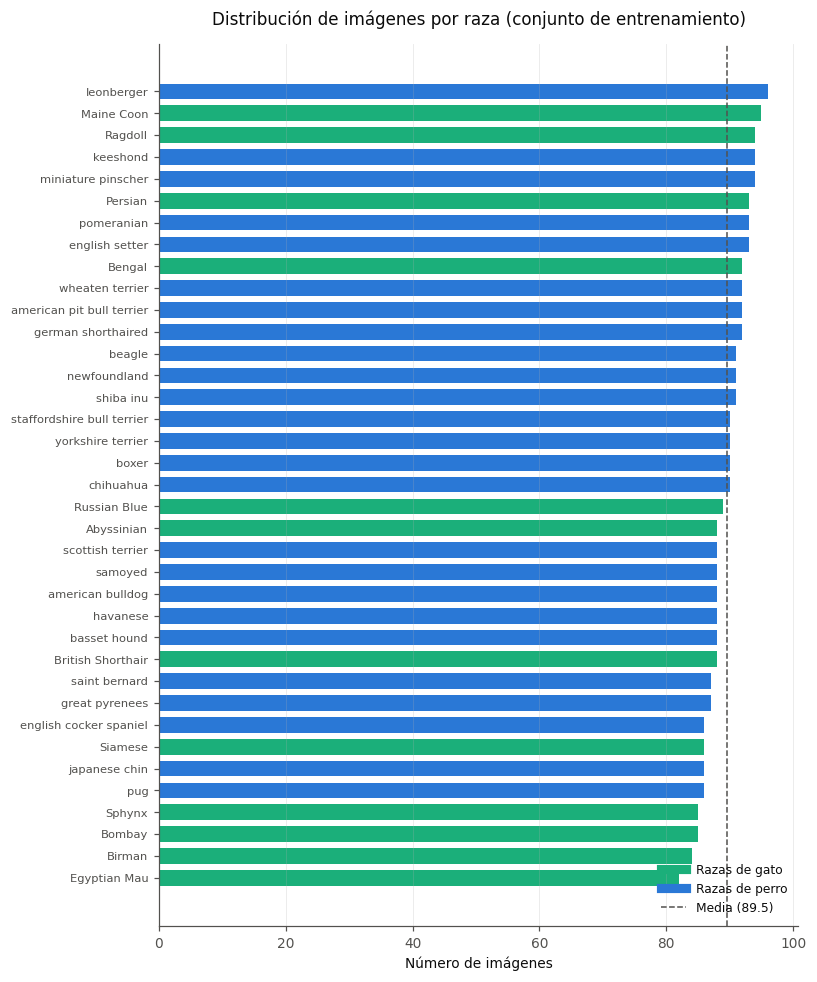

In [19]:
graficar_distribucion_clases(
    conteos_ent, nombres_clases, ESPECIE_POR_CLASE,
    "Distribución de imágenes por raza (conjunto de entrenamiento)",
)


   Dibujando el balance entre gatos y perros. 
 


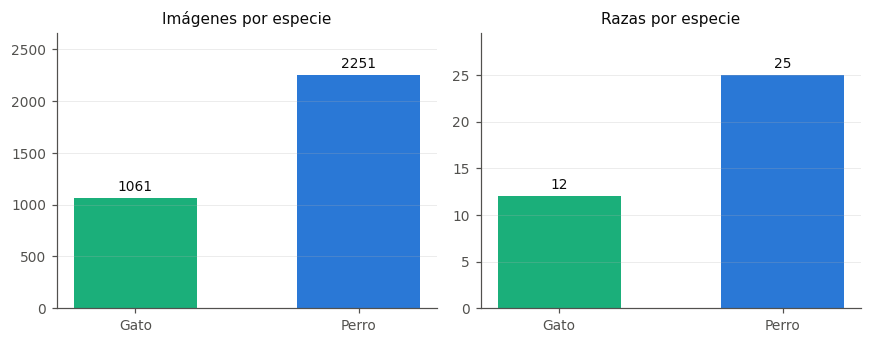

In [20]:
_imgs_especie, _razas_especie = graficar_balance_especies(conteos_especies_ent, ESPECIE_POR_CLASE)

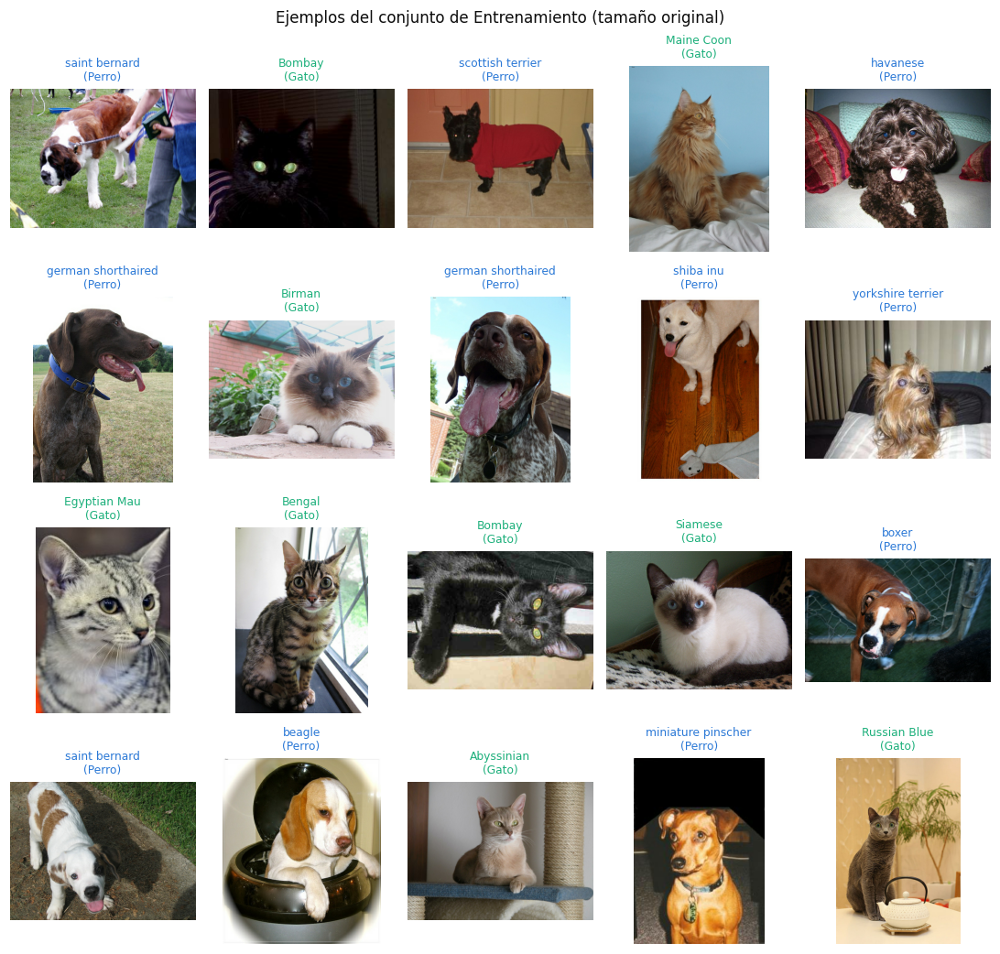

In [21]:
mostrar_muestras(train_ds_bruto, nombres_clases,"Entrenamiento", filas=4, columnas=5, )

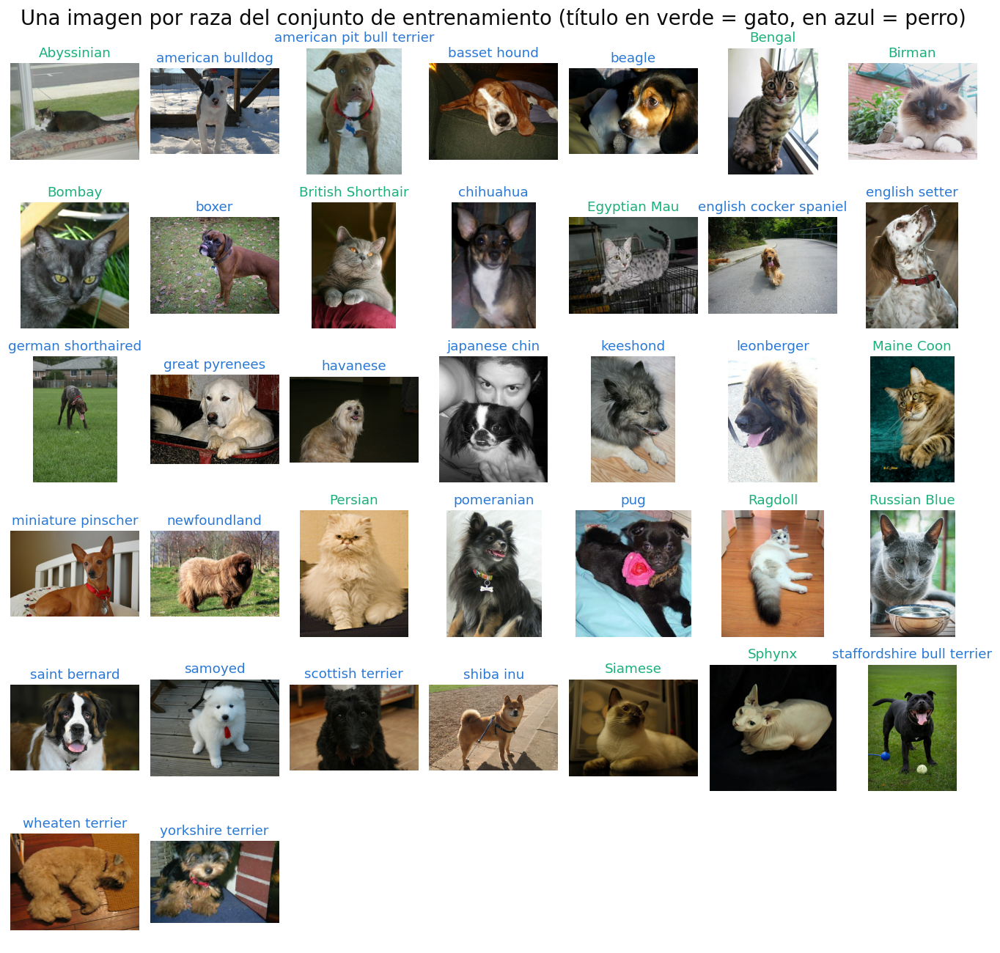

In [22]:
_representantes = mostrar_una_imagen_por_clase(train_ds_bruto, nombres_clases, "entrenamiento")

### 2.5 Resolución, relación de aspecto e iluminación

Analizando resolución, relación de aspecto y brillo de una muestra de imágenes 📐
Dibujando las estadísticas descriptivas de las imágenes 📈


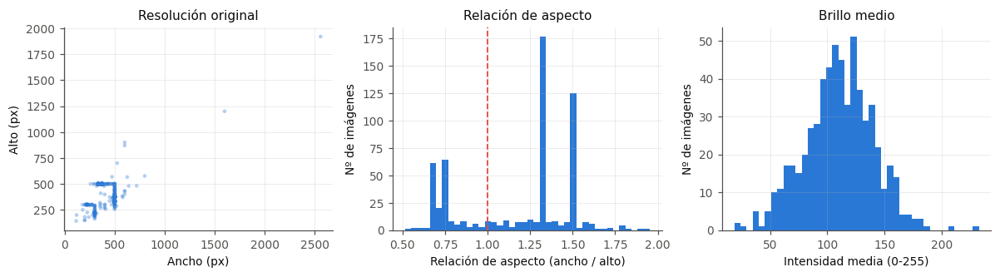

Ancho : min 114  max 2560  mediana 500
Alto  : min 143  max 1920  mediana 375
Aspecto: media 1.18  [0.52, 1.95]
Media RGB del muestreo: [119.6 113.   98.4]


In [23]:
estadisticas_imagenes = analizar_muestra_imagenes(train_ds_bruto, n_muestras=600)
graficar_estadisticas_imagenes(estadisticas_imagenes)

* El ancho va desde $114$ px hasta $2560$ px, con una mediana de $500$ px: conviven imágenes muy pequeñas con
  otras bastante grandes. La mediana indica que aproximadamente la mitad de las imágenes tiene un ancho menor o
  igual a $500$ px.
* El alto va desde $143$ px hasta $1920$ px, con una mediana de $375$ px. Igual que con el ancho, hay bastante
  variabilidad. Una imagen "típica" del conjunto, tomando las medianas, estaría cerca de:

        500 x 375 px

* La relación de aspecto $\frac{ancho}{alto}$ tiene una media de $1.18$: un valor mayor que $1$ significa que
  la imagen es más ancha que alta, por lo que en promedio las imágenes son ligeramente horizontales.
* El rango [$0.52$, $1.95$] muestra encuadres muy distintos:
    - $0.52$: imagen claramente vertical.
    - $1.00$: imagen cuadrada.
    - $1.18$: ligeramente horizontal (valor medio).
    - $1.95$: imagen muy horizontal, casi el doble de ancha que alta.

Esta variabilidad justifica la aplicación de un proceso de redimensionamiento antes de introducir las imágenes
al modelo.

* En cuanto al color, las intensidades medias RGB fueron [$119.6$, $113.0$, $98.4$], con una ligera
  predominancia de los canales rojo y verde frente al azul.

### 2.6 Conclusiones

| Hallazgo | Consecuencia sobre el diseño |
|---|---|
| $3\,312$ imágenes de entrenamiento para $37$ clases (≈ $90$ por clase) | Insuficiente para entrenar desde cero una red profunda: se hace obligatorio el *transfer learning* desde modelos preentrenados en ImageNet. |
| Clases balanceadas a nivel de raza (coeficiente de variación cercano a 0) | La *accuracy* es una métrica válida; no se necesitan pesos por clase ni remuestreo. |
| Desbalance moderado por especie (≈ 1/3 gatos, 2/3 perros), idéntico en las tres particiones | No afecta a la tarea (la clase es la raza), pero fija en ≈ 68 % el *baseline* de la tarea derivada gato/perro. |
| Resoluciones heterogéneas y relaciones de aspecto variables | Es imprescindible **redimensionar** a un tamaño fijo ($160$×$160$). Se acepta la distorsión del aspecto a cambio de conservar el objeto completo. |
| Rango de píxeles [$0$, $255$] y brillo muy variable | Es obligatorio **normalizar** según el modelo base; la variabilidad de iluminación justifica el aumento de contraste en el *data augmentation*. |
| Alta variabilidad intra-clase (pose, escala, fondo, oclusión) | Justifica el *data augmentation* geométrico (volteo, rotación, traslación, zoom). |

## 3. Preprocesamiento

**Redimensionado.** Una capa densa exige un vector de tamaño fijo y una CNN entrenada por lotes exige que
todos los elementos del lote tengan la misma forma, de modo que todas las imágenes se llevan a 160×160×3.


Existen dos estrategias:
* *(a)* escalar directamente, distorsionando la relación de aspecto.
* *(b)* recortar o rellenar (*letterboxing*) para preservarla.

Se elige la primera porque garantiza que el animal completo
permanece en la imagen —el EDA mostró sujetos descentrados y encuadres muy dispares— y porque la CNN puede
aprender a tolerar una distorsión moderada, que además actúa como una forma leve de regularización.

**Normalización.** Los píxeles llegan como enteros en $[0, 255]$. Alimentar una red con esos valores es
problemático: las activaciones iniciales son grandes, los gradientes se desestabilizan y la convergencia se
ralentiza. Cada modelo base preentrenado exige **su propia** normalización, la misma con la que se entrenó en ImageNet:

$$x' = \frac{x}{127.5} - 1 \in [-1, 1] \qquad \text{(MobileNetV2, ResNet50V2, InceptionV3, Xception)}$$

$$x' = \frac{x/255 - \mu_{\text{ImageNet}}}{\sigma_{\text{ImageNet}}} \qquad \text{(DenseNet121)}$$

EfficientNet, EfficientNetV2 y ConvNeXt incorporan la normalización **dentro** del propio modelo de Keras y reciben la imagen directamente en $[0, 255]$.

Un detalle **crítico** del *transfer learning*: la normalización debe ser exactamente la misma con la que se
entrenó la red preentrenada. MobileNetV2 se entrenó con entradas en $[-1, 1]$; usar $[0, 1]$ degrada el
rendimiento de forma notable aunque el código no dé ningún error.

**Dónde normalizar.** La normalización se implementa como **primera capa del modelo** (`keras.layers.
Rescaling`) y no dentro del *pipeline* `tf.data`. La ventaja es que el modelo guardado queda
*autocontenido*: acepta imágenes en el rango original y no hay riesgo de aplicar en inferencia un
preprocesado distinto del de entrenamiento.

**Del diccionario a la tupla supervisada.** Como el dataset se carga con `as_supervised=False`, cada elemento
es un diccionario con seis campos. La primera operación del *pipeline* selecciona la entrada (`image`) y el
objetivo (`label`, la raza) y descarta el resto, que ya se ha explotado en el análisis: es lo que Keras
espera en `fit()`. La especie no se propaga al *pipeline* de entrenamiento porque **no es el objetivo de la
tarea**.

**Codificación de las etiquetas.** Las etiquetas se mantienen como enteros ($0..36$) y se emplea la pérdida
`sparse_categorical_crossentropy`, matemáticamente equivalente a `categorical_crossentropy` sobre vectores
*one-hot* pero sin materializar una matriz de $N \times 37$ valores.

### 3.1 Funciones de preprocesamiento

In [24]:
# =====================================================================
# 5.1. Funciones de preprocesado
# =====================================================================

def preparar_ejemplo(ejemplo, tam=TAM_IMG):
    """Convierte el diccionario del dataset en la tupla (imagen, raza).

    Es el punto en el que se pasa del formato completo (as_supervised=False) al
    formato supervisado que espera Keras: se selecciona `image` como entrada y
    `label` (la raza) como objetivo, y se descartan el resto de anotaciones, que
    ya se han aprovechado en el análisis.

    La imagen se lleva a tam x tam y se mantiene en uint8 para que la caché en
    memoria ocupe cuatro veces menos que en float32; la conversión a float se
    realiza después del batch.
    """
    #Necesario porque una red neuronal necesita que todas las imágenes de un lote tengan las mismas dimensiones
    imagen = tf.image.resize(ejemplo["image"], (tam, tam), method="bilinear") #Redimensiona todas las imágenes al mismo tamaño
    #tf.image.resize devuelve no. decimales.
    imagen = tf.cast(tf.round(imagen), tf.uint8) #redondeamos los valores y después lo convierte a tipo entero
    # uint8 utiliza 1 byte por valor mientras que float32 utiliza 4 bytes por valor  (4 veces más memoria)
    return imagen, ejemplo["label"] #Retorna el tensor , raza


def preparar_ejemplo_con_especie(ejemplo, tam=TAM_IMG):
    """Variante multitarea: (imagen, {"raza": ..., "especie": ...}).
    Esto permitiría construir un modelo con dos salidas
    imagen -> CNN -> capas (clasificación de raza, clasificación de especie)
    """

    imagen = tf.image.resize(ejemplo["image"], (tam, tam), method="bilinear")
    imagen = tf.cast(tf.round(imagen), tf.uint8)
    return imagen, {"raza": ejemplo["label"], "especie": ejemplo["species"]} #Es para un modelo multitarea


def a_flotante(imagenes, etiquetas):
    """Convierte un lote de imágenes uint8 a float32 conservando el rango [0, 255].
    Una normalización sería algo como:
    imagenes = tf.cast(imagenes, tf.float32) / 255.0
    o se puede hacer posteriormente dentro del propio modelo, mediante una capa.
    layers.Rescaling(1./255)
    """
    return tf.cast(imagenes, tf.float32), etiquetas


def preparar_dataset(ds, tam_lote=TAM_LOTE, entrenamiento=False, cachear=True,
                     tam_buffer=1024, semilla=SEMILLA, funcion_preparacion=None):
    """Construye el pipeline tf.data completo para una partición.

    Orden de las operaciones (relevante para el rendimiento y la corrección):
        map(diccionario -> (imagen, raza)) -> cache -> shuffle -> batch
        -> map(float32) -> prefetch
    El barajado solo se aplica a entrenamiento: en validación y test el orden debe
    ser determinista para poder alinear predicciones con etiquetas.
    """
    print(f"Construyendo el pipeline tf.data (entrenamiento={entrenamiento}): "
          f"redimensionado, caché, barajado, lotes y prefetch 🔧")
    #Si no se introduce una función de preparación, utiliza preparar ejemplo
    funcion_preparacion = funcion_preparacion or preparar_ejemplo
    ds = ds.map(funcion_preparacion, num_parallel_calls=AUTOTUNE) #(imagen_redimensionada, etiqueta_raza)
    """map() aplica una función a cada elemento del dataset.
    num_parallel_calls=AUTOTUNE permite que TensorFlow decida automáticamente cuántos elementos procesar paralelamente."""
    if cachear:
        ds = ds.cache()
        """cache() guarda los resultados después de la primera pasada.
        sin cache() y en la segunda época TensorFlow tendría que repetir el redimensionamiento."""
    if entrenamiento: #comprueba si el dataset corresponde al conjunto de entrenamiento.
        ds = ds.shuffle(tam_buffer, seed=semilla, reshuffle_each_iteration=True)
        #shuffle() mezcla los ejemplos.
    """ Esto es importante en entrenamiento porque no quieres que el modelo aprenda accidentalmente patrones
    relacionados con el orden de los datos.
    tam_buffer=1024 significa que TensorFlow mantiene un buffer de hasta 1024 ejemplos para realizar la mezcla.
    Cuanto mayor sea el buffer, mejor suele ser el barajado, aunque también requiere más memoria.

    seed=semilla permite reproducibilidad.

    reshuffle_each_iteration=True -> indica que se vuelva a barajar el conjunto en cada época. (deseable solo en entrenamiento)
    """
    ds = ds.batch(tam_lote)
    """ Agrupa las imagenes en lotes. En lugar de enviar al modelo una imagen cada vez,
    se envían en grupos lote 1 -> 32 imágenes.
    La forma general es (batch, alto, ancho, canales) """
    ds = ds.map(a_flotante, num_parallel_calls=AUTOTUNE)
    """
    resize -> uint8 -> cache ->shuffle -> batch -> float32
    Si hubieras convertido a float32 antes del cache(), el caché utilizaría aproximadamente cuatro veces más memoria.

    prefetch() sirve para mejorar el rendimiento durante entrenamiento.
    La idea es que TensorFlow puede preparar el siguiente lote mientras la GPU está trabajando con el lote actual.

    con prefetch() -> GPU procesa lote 1 mientras CPU prepara lote 2
    sin pretech() -> CPU prepara lote 1 GPU espera
    AUTOTUNE deja que TensorFlow determine automáticamente cuánto preprocesamiento adelantar.
    """
    return ds.prefetch(AUTOTUNE)

## 4 Data augmentation

El *data augmentation* genera, en cada época, variantes aleatorias de cada imagen de entrenamiento. Su
fundamento es la **invarianza**: la etiqueta "beagle" no cambia si el perro aparece reflejado, girado unos
grados, ligeramente desplazado o con otra iluminación. Al mostrar esas variantes, se enseña explícitamente a
la red a ignorar factores irrelevantes y se amplía artificialmente el soporte de la distribución de
entrenamiento. Formalmente actúa como un **regularizador**: reduce la varianza del estimador y, por tanto, la
brecha entre el error de entrenamiento y el de validación.

Transformaciones utilizadas y su justificación:

| Transformación | Parámetro | Justificación |
|---|---|---|
| `RandomFlip("horizontal")` | — | Un animal reflejado sigue siendo de la misma raza. **No** se usa volteo vertical: una mascota boca abajo no aparece en el dominio. |
| `RandomRotation` | ±8 % (≈ ±29°) | Cubre las inclinaciones típicas de una fotografía de mano. |
| `RandomZoom` | ±10 % | Simula variaciones de distancia sin llegar a recortar al animal. |
| `RandomTranslation` | ±8 % | El EDA mostró sujetos descentrados. |
| `RandomContrast` | ±15 % | Compensa la fuerte variabilidad de iluminación observada en el histograma de brillo. |


**Dos decisiones de implementación:**

1. **Las capas de aumento se insertan dentro del modelo**, no en el *pipeline* `tf.data`. Keras las ejecuta
   **solo en modo entrenamiento** (`training=True`) y las desactiva automáticamente en `evaluate()` y
   `predict()`, lo que elimina por completo el riesgo —muy habitual— de evaluar con imágenes aumentadas.
   Además, así se ejecutan en la GPU junto con el resto del grafo.
2. **El aumento se aplica antes del reescalado**, sobre el rango original $[0, 255]$, que es el que esperan
   por defecto las capas de contraste de Keras.

Es importante recordar que el *data augmentation* se aplica **únicamente al conjunto de entrenamiento**;
validación y test deben permanecer intactos para que sus métricas estimen el rendimiento real.

### 4.1 Funciones de data augmentation

In [25]:
def crear_aumentador(semilla=SEMILLA, nombre="aumentacion"):
    """Devuelve el bloque de capas de aumento de datos (activo solo en entrenamiento)."""
    print("Creando el bloque de data augmentation: volteo, rotación, zoom, traslación y contraste 🔄")
    return keras.Sequential(
        [
            keras.layers.RandomFlip("horizontal", seed=semilla),
            keras.layers.RandomRotation(0.08, fill_mode="reflect", seed=semilla),
            keras.layers.RandomZoom(0.10, fill_mode="reflect", seed=semilla),
            keras.layers.RandomTranslation(0.08, 0.08, fill_mode="reflect", seed=semilla),
            keras.layers.RandomContrast(0.15, seed=semilla),
        ],
        name=nombre,
    )


def visualizar_aumentacion(ds, aumentador, n_clases=5, n_variantes=4, semilla=SEMILLA):
    """Muestra varias clases distintas con su imagen original y versiones aumentadas."""
    print(f"Mostrando data augmentation sobre {n_clases} clases diferentes 🎨")

    ejemplos_seleccionados = []
    clases_vistas = set()

    ds_barajado = ds.shuffle(1024, seed=semilla, reshuffle_each_iteration=False)

    for ejemplo in ds_barajado:
        etiqueta = int(ejemplo["label"].numpy())

        if etiqueta not in clases_vistas:
            ejemplos_seleccionados.append(ejemplo)
            clases_vistas.add(etiqueta)

        if len(ejemplos_seleccionados) == n_clases:
            break

    n_columnas = n_variantes + 1
    fig, ejes = plt.subplots(
        len(ejemplos_seleccionados),
        n_columnas,
        figsize=(1.8 * n_columnas, 2.2 * len(ejemplos_seleccionados))
    )

    ejes = np.atleast_2d(ejes)

    for fila, ejemplo in enumerate(ejemplos_seleccionados):
        imagen = tf.cast(
            tf.image.resize(ejemplo["image"], (TAM_IMG, TAM_IMG)),
            tf.float32
        )

        etiqueta = int(ejemplo["label"].numpy())
        nombre_clase = nombres_clases[etiqueta].replace("_", " ")
        lote = tf.expand_dims(imagen, axis=0)

        ejes[fila, 0].imshow(np.clip(imagen.numpy(), 0, 255).astype("uint8"))
        ejes[fila, 0].set_title(f"Original\n{nombre_clase}", fontsize=8, color=C_SERIE_2)
        ejes[fila, 0].axis("off")

        for columna in range(1, n_columnas):
            aumentada = aumentador(lote, training=True)[0].numpy()
            ejes[fila, columna].imshow(np.clip(aumentada, 0, 255).astype("uint8"))
            ejes[fila, columna].set_title(f"Aumentada {columna}", fontsize=8, color=C_SUAVE)
            ejes[fila, columna].axis("off")

    fig.suptitle(f"Data augmentation en {len(ejemplos_seleccionados)} clases diferentes", fontsize=11)
    fig.tight_layout()
    plt.show()

### 4.2 Construcción de los pipelines

In [26]:
# --- Ejecución estructurada: pipelines definitivos -------------------
train_ds = preparar_dataset(train_ds_bruto, entrenamiento=True, cachear=True)
val_ds    = preparar_dataset(val_ds_bruto, entrenamiento=False, cachear=True)
# El test no se cachea: se recorre pocas veces y evita ~280 MB de memoria.
test_ds        = preparar_dataset(test_ds_bruto, entrenamiento=False, cachear=False)


Construyendo el pipeline tf.data (entrenamiento=True): redimensionado, caché, barajado, lotes y prefetch 🔧
Construyendo el pipeline tf.data (entrenamiento=False): redimensionado, caché, barajado, lotes y prefetch 🔧
Construyendo el pipeline tf.data (entrenamiento=False): redimensionado, caché, barajado, lotes y prefetch 🔧


In [27]:
_lote_imgs, _lote_etqs = next(iter(train_ds))
print("Forma del lote de imágenes:", _lote_imgs.shape, _lote_imgs.dtype)
print("Forma del lote de etiquetas:", _lote_etqs.shape, _lote_etqs.dtype)
print(f"Rango de valores: [{float(tf.reduce_min(_lote_imgs)):.1f}, "
      f"{float(tf.reduce_max(_lote_imgs)):.1f}]")
print(f"Lotes por época: entrenamiento={int(train_ds.cardinality())}, "
      f"validación={int(val_ds.cardinality())}, test={int(test_ds.cardinality())}")

Forma del lote de imágenes: (32, 160, 160, 3) <dtype: 'float32'>
Forma del lote de etiquetas: (32,) <dtype: 'int64'>
Rango de valores: [0.0, 255.0]
Lotes por época: entrenamiento=104, validación=12, test=115


### 4.3 Comprobación visual del data augmentation

Antes de entrenar conviene verificar que las transformaciones son **realistas**: una imagen aumentada debe
seguir siendo una fotografía plausible de la misma raza. Un aumento demasiado agresivo introduce ruido de
etiqueta y degrada el aprendizaje en lugar de mejorarlo.

Creando el bloque de data augmentation: volteo, rotación, zoom, traslación y contraste 🔄
Mostrando data augmentation sobre 6 clases diferentes 🎨


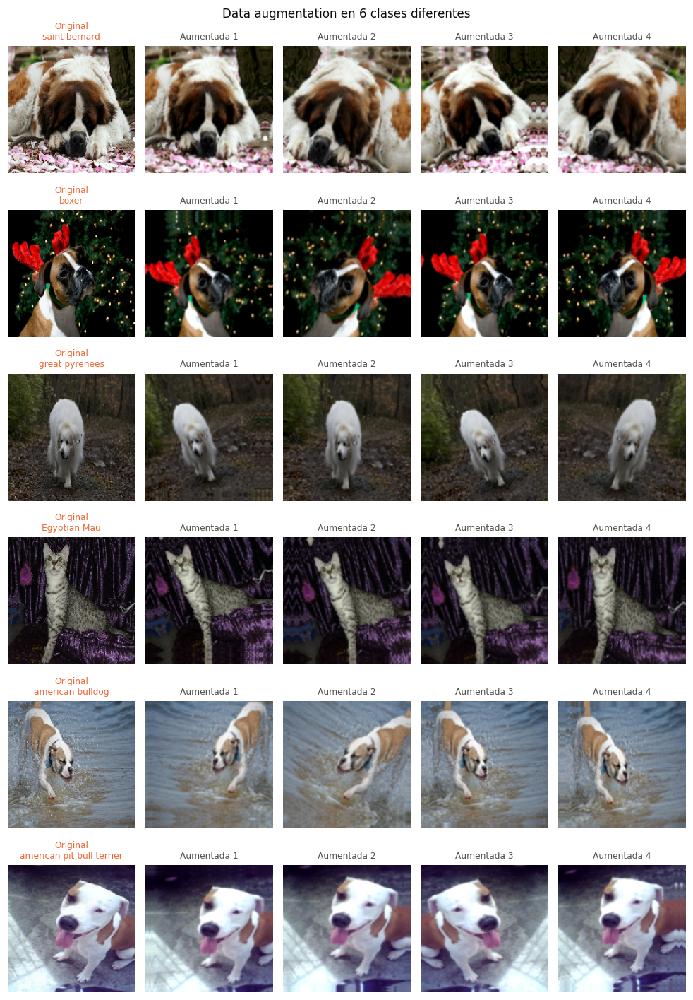

In [28]:
aumentador_demo = crear_aumentador()
visualizar_aumentacion(train_ds_bruto, aumentador_demo,  n_clases=6, n_variantes=4)


## 5. Fundamentos  teóricos de las CNN

### 5.1 Operación de convolución

Para una entrada $x$ con $C$ canales y un núcleo (*kernel*) $w$ de tamaño $K \times K$, el mapa de
activación $k$-ésimo se calcula como:

$$y_{i,j,k} \;=\; b_k \;+\; \sum_{u=0}^{K-1}\sum_{v=0}^{K-1}\sum_{c=0}^{C-1} w_{u,v,c,k}\; x_{i+u,\; j+v,\; c}$$

Cada núcleo es un **detector de patrones** que se desliza por toda la imagen. Los pesos no se diseñan a mano:
se aprenden por descenso de gradiente. Empíricamente, los núcleos de las primeras capas convergen hacia
detectores de bordes y de color, y los de las capas profundas hacia partes de objeto (ojos, orejas,
texturas de pelaje), que es exactamente la jerarquía que necesita este problema.

**Número de parámetros de una capa convolucional:**

$$P = (K \times K \times C_{\text{ent}} + 1) \times C_{\text{sal}}$$

Obsérvese que **no depende del tamaño de la imagen**. Una capa `Conv2D(32, 3x3)` sobre una entrada RGB tiene
$(3 \cdot 3 \cdot 3 + 1)\cdot 32 = 896$ parámetros, frente a los millones de una densa equivalente.

**Tamaño de salida.** Con relleno (*padding*) $P$ y paso (*stride*) $S$:

$$O = \left\lfloor \frac{I - K + 2P}{S} \right\rfloor + 1$$

* `padding="valid"` ($P=0$): la salida se encoge en cada capa y se pierde información del borde.
* `padding="same"`: se rellena con ceros para que $O = I$ cuando $S = 1$.

**Campo receptivo.** Es la región de la imagen original que influye sobre una activación. Apilar dos
convoluciones $3\times3$ produce un campo receptivo de $5\times5$ con menos parámetros que una única
convolución $5\times5$ ($2 \cdot 9 = 18$ frente a $25$ pesos por canal) y con una no linealidad adicional
intercalada. Este es el motivo por el que las arquitecturas modernas usan casi exclusivamente núcleos
$3\times3$ apilados.

### 5.2 Pooling y global average pooling

El **max-pooling** divide cada mapa de activación en ventanas (típicamente $2\times2$) y conserva el máximo:

$$y_{i,j} = \max_{(u,v)\in \mathcal{W}_{i,j}} x_{u,v}$$

Cumple tres funciones: reduce la resolución espacial a la mitad (y con ella el coste computacional),
aumenta el campo receptivo efectivo de las capas siguientes y aporta una **invarianza local a pequeños
desplazamientos**, ya que el máximo de una ventana no cambia si el patrón se mueve un píxel. No tiene
parámetros entrenables.

El **global average pooling (GAP)** promedia cada mapa de activación completo, transformando un tensor
$H \times W \times C$ en un vector de longitud $C$:

$$g_c = \frac{1}{H \cdot W}\sum_{i,j} x_{i,j,c}$$

Es la alternativa moderna a `Flatten` antes del clasificador. Con mapas finales de $5\times5\times256$,
`Flatten` produce un vector de 6 400 componentes (y ~1,6 M de parámetros si le sigue una densa de 256),
mientras que GAP produce uno de 256 (~65 K parámetros): **una reducción de 25×** que actúa como un fuerte
regularizador estructural. Por este motivo GAP es la elección en todos los modelos de este notebook.

### 5.3 Funciones de activación

Sin no linealidades, una pila de capas lineales colapsa en una única transformación lineal. Las utilizadas
aquí son:

**ReLU** — $\;f(z) = \max(0, z)$. Es la activación por defecto en capas ocultas: su gradiente es exactamente
1 para $z > 0$, lo que evita el desvanecimiento del gradiente que sufren la sigmoide y la tangente
hiperbólica en redes profundas, y su cálculo es trivial. Su inconveniente es la *dying ReLU*: una neurona que
queda siempre en la zona negativa deja de recibir gradiente y no vuelve a aprender; la *batch normalization*
y una tasa de aprendizaje moderada lo mitigan.

**Softmax** — capa de salida en clasificación multiclase:

$$p_k = \frac{e^{z_k}}{\sum_{j=1}^{37} e^{z_j}}$$

Convierte los *logits* en una distribución de probabilidad sobre las 37 razas ($p_k>0$, $\sum_k p_k = 1$).
Se usa `softmax` explícito en la última capa, de modo que `predict()` devuelve directamente probabilidades
interpretables.

### 5.4 Batch Normalization

Durante el entrenamiento, la distribución de las entradas de cada capa cambia continuamente porque las capas
anteriores actualizan sus pesos (*internal covariate shift*). La *batch normalization* (Ioffe y Szegedy,
2015) normaliza cada canal usando la media y la varianza del mini-lote y aplica después una transformación
afín aprendible:

$$\hat{x} = \frac{x - \mu_{\mathcal{B}}}{\sqrt{\sigma^2_{\mathcal{B}} + \epsilon}}, \qquad y = \gamma \hat{x} + \beta$$

Los parámetros $\gamma$ y $\beta$ permiten a la red recuperar la escala original si le conviene. Sus efectos
prácticos son: permite tasas de aprendizaje mayores, acelera la convergencia, reduce la sensibilidad a la
inicialización y aporta una ligera regularización (el ruido de estimar $\mu$ y $\sigma$ por lote).

**Comportamiento dual, clave para el *fine-tuning*.** En entrenamiento usa las estadísticas del lote; en
inferencia usa medias móviles acumuladas. Por eso, al descongelar un modelo preentrenado, las capas de
*batch normalization* deben **mantenerse congeladas**: si se dejan actualizar con lotes pequeños del nuevo
dominio, destruyen las estadísticas aprendidas sobre ImageNet y el rendimiento se desploma

### 5.5 Regularización

**Dropout.** En cada paso de entrenamiento desactiva cada neurona con probabilidad $p$:

$$\tilde{h}_i = \frac{h_i}{1-p}\cdot m_i, \qquad m_i \sim \text{Bernoulli}(1-p)$$

Impide la **coadaptación** entre neuronas —ninguna puede depender de la presencia de otra— y equivale
aproximadamente a promediar un conjunto exponencial de subredes. Se desactiva automáticamente en inferencia
(de ahí el reescalado por $1/(1-p)$, que mantiene la esperanza de la activación). Se aplica con $p$ creciente
con la profundidad, y con el valor mayor justo antes del clasificador, que es donde se concentran los
parámetros.

**Regularización L2 (*weight decay*).** Añade a la pérdida una penalización sobre la magnitud de los pesos:

$$\mathcal{L}_{\text{total}} = \mathcal{L}_{\text{datos}} + \lambda \sum_i w_i^2$$

Favorece soluciones con pesos pequeños y por tanto funciones más suaves, menos propensas a ajustar el ruido.

**Early stopping.** Detiene el entrenamiento cuando la pérdida de validación deja de mejorar durante un
número de épocas (*patience*) y restaura los mejores pesos. Es la forma más directa de regularización: limita
la capacidad efectiva del modelo controlando el tiempo de optimización.

**Data augmentation.** Amplía artificialmente el conjunto de entrenamiento.

**Reducción arquitectónica.** El uso de GAP en lugar de `Flatten` elimina millones de parámetros y es, en la
práctica, una de las regularizaciones más efectivas.

### 5.6 Función de pérdida y optimización

**Entropía cruzada categórica.** Para una muestra con clase verdadera $y$ y probabilidades predichas $p$:

$$\mathcal{L} = -\sum_{k} \mathbb{1}[k = y]\,\log p_k = -\log p_y$$

Penaliza logarítmicamente la probabilidad asignada a la clase correcta: un error confiado (probabilidad
próxima a 0 en la clase verdadera) genera una pérdida muy grande, lo que empuja al modelo a calibrar su
confianza. La variante *sparse* acepta la etiqueta como entero, evitando materializar los vectores *one-hot*.

**Descenso de gradiente estocástico y Adam.** La actualización básica es
$\theta_{t+1} = \theta_t - \eta \nabla_\theta \mathcal{L}$. **Adam** (Kingma y Ba, 2015) añade momento de
primer y segundo orden con corrección de sesgo:

$$m_t = \beta_1 m_{t-1} + (1-\beta_1) g_t, \qquad v_t = \beta_2 v_{t-1} + (1-\beta_2) g_t^2$$

$$\hat{m}_t = \frac{m_t}{1-\beta_1^t}, \qquad \hat{v}_t = \frac{v_t}{1-\beta_2^t}, \qquad
\theta_{t+1} = \theta_t - \eta \frac{\hat{m}_t}{\sqrt{\hat{v}_t} + \epsilon}$$

Al normalizar cada coordenada por la raíz de la media de sus gradientes al cuadrado, Adam adapta el paso
efectivo por parámetro, lo que lo hace robusto sin apenas ajuste manual. Es el optimizador empleado en todos
los modelos, con $\eta = 10^{-3}$ para la cabeza en *transfer
learning* y $\eta = 10^{-5}$ en *fine-tuning*.

**Tasa de aprendizaje.** Es el hiperparámetro más sensible: demasiado alta provoca divergencia u oscilación;
demasiado baja, convergencia lenta o estancamiento en malos mínimos. Se emplea `ReduceLROnPlateau`, que la
divide por 2 cuando la pérdida de validación se estanca, permitiendo un ajuste fino en la fase final.

### 5.7 Transfer Learning y Fine-tuning


Una CNN entrenada sobre ImageNet (1,28 M de imágenes, 1 000 clases) ha aprendido en sus capas convolucionales
un extractor de características **genérico**: bordes, texturas, formas y partes de objeto que son útiles
mucho más allá de las clases con las que se entrenó. Además, ImageNet contiene ~120 razas de perro, de modo
que sus representaciones son especialmente pertinentes para este problema.

**Estrategia 1 — extracción de características (Modelo 4).** Se congela el modelo base
(`base.trainable = False`), se sustituye su clasificador por una cabeza nueva y solo se entrena esta última.
Se entrenan decenas de miles de parámetros en lugar de millones, el riesgo de *overfitting* es bajo y el
entrenamiento resulta muy rápido.

**Estrategia 2 — *fine-tuning* (Modelo 5).** Partiendo del modelo anterior ya entrenado, se descongelan las
**últimas** capas convolucionales y se reentrena todo el conjunto con una tasa de aprendizaje muy pequeña.
Esto permite **especializar** las características de alto nivel —las más específicas del dominio— hacia las
razas concretas del problema. Tres reglas son imprescindibles:

1. **Entrenar primero la cabeza.** Con una cabeza inicializada al azar, los gradientes iniciales son enormes
   y destruirían los pesos preentrenados en las primeras iteraciones.
2. **Tasa de aprendizaje muy baja** ($10^{-5}$): se trata de refinar, no de reaprender.
3. **Mantener congeladas las capas de *batch normalization***

**MobileNetV2 como modelo base.** Se elige por su excelente relación precisión/coste: ~2,3 M de parámetros
frente a los ~23 M de ResNet50. Sus tres ideas son las **convoluciones separables en profundidad**
(*depthwise separable*), que factorizan una convolución estándar en una espacial por canal más una $1\times1$
de mezcla, reduciendo el coste en un orden de magnitud; los **residuos invertidos**, que expanden los canales
dentro del bloque y los comprimen a la salida; y los **cuellos de botella lineales**, que evitan la ReLU
final del bloque para no destruir información en espacios de baja dimensión. Acepta entradas de 160×160, el
tamaño usado en este trabajo, y espera valores normalizados en $[-1, 1]$.


### 5.8 Protocolo de entrenamiento y callbacks


Los *callbacks* de Keras permiten intervenir en el bucle de entrenamiento. Se usan tres:

| *Callback* | Configuración | Propósito |
|---|---|---|
| `ModelCheckpoint` | `monitor="val_accuracy"`, `save_best_only=True` | Persiste **el mejor modelo según validación**, no el de la última época. Permite evaluar y analizar errores después sin reentrenar. |
| `EarlyStopping` | `monitor="val_loss"`, `patience`, `restore_best_weights=True` | Detiene el entrenamiento cuando el modelo empieza a sobreajustar y evita gastar cómputo. |
| `ReduceLROnPlateau` | `factor=0.5`, `patience` menor que la de *early stopping* | Refina la convergencia reduciendo la tasa de aprendizaje ante estancamientos. |

Se monitoriza `val_accuracy` para el punto de control (es la métrica objetivo de la actividad) y `val_loss`
para la parada temprana, porque la pérdida es una señal más sensible y detecta el inicio del sobreajuste
antes que la *accuracy*: es habitual que `val_loss` empiece a crecer mientras `val_accuracy` aún se mantiene
estable. La paciencia de `ReduceLROnPlateau` se fija estrictamente por debajo de la de `EarlyStopping` para
que el modelo tenga oportunidad de aprovechar la tasa reducida antes de que el entrenamiento se detenga.

#### 5.8.1 Funciones

In [29]:
# =====================================================================
# 7.1. Compilación y callbacks
# =====================================================================

def compilar_modelo(modelo, tasa_aprendizaje=1e-3, optimizador="adam"):
    """Compila un modelo con la configuración común a todos los experimentos.
    La tasa de aprendizaje controla qué tan grandes son los cambios que hace el modelo en sus pesos durante el entrenamiento.
    Una tasa demasiado alta puede hacer que el modelo no converja; una demasiado baja puede volver el entrenamiento muy lento.
    """
    print(f"Compilando el modelo con su optimizador {optimizador}, su función de pérdida y sus métricas ⚙")
    if optimizador == "adam":
        opt = keras.optimizers.Adam(learning_rate=tasa_aprendizaje)
    elif optimizador == "sgd":
        opt = keras.optimizers.SGD(learning_rate=tasa_aprendizaje, momentum=0.9, nesterov=True)
    else:
        raise ValueError(f"Optimizador no soportado: {optimizador}")

    modelo.compile(
        optimizer=opt,
        loss="sparse_categorical_crossentropy", #Es apropiada para clasificación multiclase cuando las etiquetas son enteros.
        metrics=[
            "accuracy", #mide el porcentaje de veces que la clase con mayor probabilidad coincide con la clase real.
            keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3"), #calcula el Top-3 accuracy.
        ],
    )
    return modelo


def crear_callbacks(ruta_modelo, paciencia_parada=10, paciencia_lr=4, factor_lr=0.5):
    """Punto de control del mejor modelo, parada temprana y reducción de la tasa de aprendizaje.
    Los callbacks son funciones que Keras ejecuta automáticamente durante el entrenamiento para controlar
    lo que ocurre entre épocas.

    ModelCheckpoint:    Este callback guarda el mejor modelo durante el entrenamiento.

    monitor="val_accuracy"   ->   significa que observa el accuracy de validación.
    mode="max"   ->   significa que un valor mayor es mejor.
    save_best_only=True  ->   evita guardar un modelo en cada época; solo guarda cuando hay mejora.


    EarlyStopping:  Sirve para detener el entrenamiento si el modelo deja de mejorar.

    monitor="val_loss"          -> Observa la pérdida del conjunto de validación.
    patience                    ->   El entrenamiento se detendrá cuando pasen n épocas sin mejorar val_loss
    Esto ayuda a evitar entrenar inútilmente y también reduce el riesgo de sobreajuste.
    restore_best_weights=True   ->   hace que, al terminar, el modelo recupere automáticamente los pesos correspondientes
    a la mejor val_loss.
    Esto es importante porque el modelo de la última época no necesariamente es el mejor.


    ReduceLROnPlateau:  Este callback reduce la tasa de aprendizaje cuando el modelo se estanca.

    La idea es que al principio el modelo pueda aprender con pasos relativamente grandes,
    pero cuando se acerque a una buena solución haga ajustes más pequeños.

    min_lr=1e-7 impide que la tasa se reduzca indefinidamente.

    """
    print("Creando los callbacks: checkpoint del mejor modelo, early stopping y reducción de la tasa de aprendizaje 🔔")
    return [
        keras.callbacks.ModelCheckpoint(
            filepath=str(ruta_modelo),
            monitor="val_accuracy",
            mode="max",
            save_best_only=True,
            verbose=0,
        ),
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=paciencia_parada,
            restore_best_weights=True,
            verbose=1,
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=factor_lr,
            patience=paciencia_lr,
            min_lr=1e-7,
            verbose=1,
        ),
    ]


def contar_parametros(modelo):
    """Devuelve (parámetros totales, parámetros entrenables)."""
    print("Contando los parámetros totales y entrenables del modelo 🧮")
    totales = int(modelo.count_params())
    entrenables = int(sum(int(np.prod(w.shape)) for w in modelo.trainable_weights))
    return totales, entrenables

## 6. Infraestructura experimental

Para que todos los modelos sean **comparables**, todos deben entrenarse y evaluarse exactamente con el mismo
protocolo. Esta sección define, de una sola vez, las funciones que implementan ese protocolo:

* **Compilación** con la misma pérdida y las mismas métricas.
* **Callbacks** idénticos (punto de control, parada temprana, reducción de la tasa de aprendizaje).
* **Entrenamiento con persistencia**: `entrenar_o_cargar()` guarda el mejor modelo y su historial y, si ya
  existen en disco, los carga en lugar de reentrenar. Es lo que permite reejecutar todo el análisis sin GPU.
* **Evaluación y diagnóstico**: curvas, brecha entrenamiento-validación, métricas y predicciones.
* **Registro de resultados** en una estructura común, `RESULTADOS`, que alimenta la comparativa de la
  sección 10 y garantiza la trazabilidad entre cada modelo, sus hiperparámetros y sus métricas.

Además de `accuracy` se registra la **top-3 accuracy**: en un problema de grano fino con $37$ clases informa de
si los errores son "casi aciertos" (la clase correcta queda entre las tres más probables) o fallos completos.

### 6.1 Entrenamiento con persistencia de los modelos

Esta es la función que materializa el requisito del enunciado de **no reentrenar innecesariamente**: guarda
el mejor punto de control según validación y su historial, y en ejecuciones posteriores los recupera de
disco.

Incorpora además una salvaguarda nueva:

* **Semillas por experimento.** Las semillas se fijan justo antes de construir cada modelo, de forma que
  todas las arquitecturas parten de las mismas condiciones aleatorias (orden de los lotes, *dropout* y
  aumentos).

In [30]:
# =====================================================================
# 6.1. Entrenamiento con persistencia
# =====================================================================

# Capas propias de ConvNeXt: se declaran explícitamente para que load_model
# pueda reconstruirlas aunque no estén registradas como serializables.
try:
    from keras.src.applications.convnext import LayerScale, StochasticDepth
    OBJETOS_PERSONALIZADOS = {"LayerScale": LayerScale, "StochasticDepth": StochasticDepth}
except ImportError:
    OBJETOS_PERSONALIZADOS = {}

def _ruta_modelo(nombre):
    return DIR_MODELOS / f"{nombre}.keras"


def _ruta_historial(nombre):
    return DIR_MODELOS / f"{nombre}_historial.json"


def guardar_historial(nombre, historia, duracion_s, hiperparametros):
    """Persiste el historial de entrenamiento y los hiperparámetros en formato JSON."""
    print("Guardando en JSON el historial de entrenamiento y los hiperparámetros 💾")
    registro = {
        "historia": {k: [float(v) for v in vals] for k, vals in historia.items()},
        "epocas_ejecutadas": len(historia["loss"]),
        "tiempo_entrenamiento_s": float(duracion_s),
        "hiperparametros": hiperparametros,
    }
    _ruta_historial(nombre).write_text(json.dumps(registro, indent=2, ensure_ascii=False), encoding="utf-8")
    return registro


def entrenar_o_cargar(nombre, funcion_constructora, train_ds, val_ds,
                      epocas, paciencia_parada=10, paciencia_lr=4,
                      hiperparametros=None, forzar_reentrenamiento=False, verbose=1):
    """Entrena un modelo o lo recupera de disco si ya fue entrenado.

    Parámetros
    ----------
    nombre : identificador usado para los ficheros `<DIR_MODELOS>/<nombre>.keras` y
             `<DIR_MODELOS>/<nombre>_historial.json`.
    funcion_constructora : función sin argumentos que devuelve el modelo ya compilado.

    Devuelve (modelo, registro_historial). El modelo devuelto es siempre el MEJOR
    punto de control según `val_accuracy`, nunca el de la última época.
    """
    print(f"Entrenando el modelo '{nombre}', o recuperándolo del disco si ya fue entrenado 🚀")
    ruta_modelo, ruta_hist = _ruta_modelo(nombre), _ruta_historial(nombre)

    if ruta_modelo.exists() and ruta_hist.exists() and not forzar_reentrenamiento:
        modelo = keras.models.load_model(ruta_modelo, custom_objects=OBJETOS_PERSONALIZADOS)
        registro = json.loads(ruta_hist.read_text(encoding="utf-8"))
        print(f"[{nombre}] modelo recuperado de disco "
              f"({registro['epocas_ejecutadas']} épocas, "
              f"{registro['tiempo_entrenamiento_s'] / 60:.1f} min de entrenamiento original). "
              f"Usar forzar_reentrenamiento=True para reentrenar.")
        return modelo, registro

    print(f"[{nombre}] entrenando (máximo {epocas} épocas)...")
    configurar_semillas()
    modelo = funcion_constructora()
    callbacks = crear_callbacks(ruta_modelo, paciencia_parada, paciencia_lr)

    inicio = time.time()
    historia = modelo.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epocas,
        callbacks=callbacks,
        verbose=verbose,
    )
    duracion = time.time() - inicio

    registro = guardar_historial(nombre, historia.history, duracion, hiperparametros or {})
    # Se recarga el mejor punto de control para que lo devuelto no dependa de
    # la última época ejecutada.
    del modelo
    gc.collect()
    modelo = keras.models.load_model(ruta_modelo, custom_objects=OBJETOS_PERSONALIZADOS)
    print(f"[{nombre}] entrenamiento finalizado en {duracion / 60:.1f} min "
          f"({registro['epocas_ejecutadas']} épocas). Guardado en {ruta_modelo}")
    return modelo, registro

### 6.2 Curvas de aprendizaje y diagnóstico de ajuste

El diagnóstico automático se apoya en dos umbrales explícitos: una brecha entrenamiento-validación superior
a **10 puntos** se considera indicio de *overfitting*, y una *accuracy* de entrenamiento inferior al **55 %**
sin brecha apreciable, indicio de *underfitting*. Ambos se evalúan en la **época del punto de control
guardado**, no en la última época ejecutada, porque es ese modelo el que se conserva y se evalúa.

In [31]:
# =====================================================================
# 7.3. Curvas de aprendizaje y diagnóstico de ajuste
# =====================================================================

def graficar_curvas(registro, titulo):
    """Curvas de pérdida y accuracy por época (entrenamiento vs validación).

    Se usan dos paneles independientes en lugar de un doble eje Y: pérdida y
    accuracy tienen escalas distintas y superponerlas induce a error.
    """
    print("Dibujando las curvas de pérdida y accuracy de entrenamiento y validación 📉")
    historia = registro["historia"]
    epocas = np.arange(1, len(historia["loss"]) + 1)
    mejor = int(np.argmax(historia["val_accuracy"]))

    marcador = "o" if len(epocas) < 3 else None   # legibilidad si hubo pocas épocas
    fig, ejes = plt.subplots(1, 2, figsize=(10.5, 3.4))

    ejes[0].plot(epocas, historia["loss"], color=C_SERIE_1, marker=marcador,
                 label="Entrenamiento")
    ejes[0].plot(epocas, historia["val_loss"], color=C_SERIE_2, marker=marcador,
                 label="Validación")
    ejes[0].set_xlabel("Época")
    ejes[0].set_ylabel("Pérdida (entropía cruzada)")
    ejes[0].set_title("Pérdida", fontsize=10)
    ejes[0].legend(frameon=False, fontsize=8)

    ejes[1].plot(epocas, historia["accuracy"], color=C_SERIE_1, marker=marcador,
                 label="Entrenamiento")
    ejes[1].plot(epocas, historia["val_accuracy"], color=C_SERIE_2, marker=marcador,
                 label="Validación")
    ejes[1].scatter([epocas[mejor]], [historia["val_accuracy"][mejor]],
                    s=45, color=C_SERIE_2, zorder=5, edgecolors="white", linewidths=1.5)
    ejes[1].annotate(f"mejor: {historia['val_accuracy'][mejor]:.3f} (época {mejor + 1})",
                     xy=(epocas[mejor], historia["val_accuracy"][mejor]),
                     xytext=(-10, -18), textcoords="offset points",
                     fontsize=8, color=C_SUAVE, ha="right")
    ejes[1].set_xlabel("Época")
    ejes[1].set_ylabel("Accuracy")
    ejes[1].set_ylim(0, 1)
    ejes[1].set_title("Accuracy", fontsize=10)
    ejes[1].legend(frameon=False, fontsize=8, loc="lower right")

    fig.suptitle(titulo, fontsize=11)
    fig.tight_layout()
    plt.show()


def diagnosticar_ajuste(registro, umbral_sobreajuste=0.10, umbral_infraajuste=0.55):
    """Diagnostica overfitting / underfitting a partir de las curvas.

    El diagnóstico se realiza en la época del MEJOR modelo de validación, que es
    el punto de control que se conserva, y no en la última época ejecutada.
    """
    print("Diagnosticando si el modelo sufre overfitting o underfitting 🩺")
    historia = registro["historia"]
    mejor = int(np.argmax(historia["val_accuracy"]))
    acc_ent = historia["accuracy"][mejor]
    acc_val = historia["val_accuracy"][mejor]
    brecha = acc_ent - acc_val
    perdida_creciente = historia["val_loss"][-1] > min(historia["val_loss"]) * 1.15

    if acc_ent < umbral_infraajuste and brecha < umbral_sobreajuste:
        veredicto = "UNDERFITTING: el modelo no logra ajustar ni siquiera los datos de entrenamiento."
    elif brecha > umbral_sobreajuste:
        veredicto = (f"OVERFITTING: brecha de {brecha * 100:.1f} puntos entre entrenamiento y validación "
                     f"(umbral {umbral_sobreajuste * 100:.0f}).")
    else:
        veredicto = f"AJUSTE CORRECTO: brecha de {brecha * 100:.1f} puntos, dentro del margen aceptable."

    print(f"Mejor época            : {mejor + 1} de {registro['epocas_ejecutadas']}")
    print(f"Accuracy entrenamiento : {acc_ent * 100:.2f} %")
    print(f"Accuracy validación    : {acc_val * 100:.2f} %")
    print(f"Brecha (ent - val)     : {brecha * 100:+.2f} puntos")
    if perdida_creciente:
        print("Aviso: la pérdida de validación final supera en >15 % a su mínimo "
              "(síntoma de sobreajuste en las últimas épocas; el checkpoint guardado es anterior).")
    print(f"=> {veredicto}")

    return {"mejor_epoca": mejor + 1, "acc_entrenamiento": acc_ent,
            "acc_validacion": acc_val, "brecha": brecha, "veredicto": veredicto}

### 6.3 Evaluación, predicciones y registro de resultados

In [32]:
# =====================================================================
# 6.3. Evaluación, predicciones y registro de resultados
# =====================================================================

RESULTADOS = {}   # clave -> métricas de cada modelo
REGISTROS = {}    # clave -> historial de entrenamiento de cada modelo


def evaluar_modelo(modelo, ds, nombre_particion="validación", verbose=0):
    """Evalúa un modelo sobre una partición y devuelve un diccionario de métricas."""
    print(f"Evaluando el modelo sobre el conjunto de {nombre_particion} 🧪")
    metricas = modelo.evaluate(ds, verbose=verbose, return_dict=True)
    print(f"{nombre_particion:>12}: pérdida {metricas['loss']:.4f} | "
          f"accuracy {metricas['accuracy'] * 100:.2f} % | "
          f"top-3 {metricas['top3'] * 100:.2f} %")
    return metricas


def obtener_predicciones(modelo, ds):
    """Devuelve (y_verdadero, y_predicho, probabilidades) recorriendo la partición UNA sola vez.

    Las etiquetas y las predicciones se extraen del mismo lote. Recorrer el dataset dos
    veces (una para predecir y otra para leer las etiquetas) las desalinea cuando el
    orden de lectura cambia entre pasadas, como ocurre con `shuffle_files=True`.
    """
    print("Calculando las predicciones del modelo sobre la partición 🔮")
    etiquetas, probabilidades = [], []
    for imagenes, etiquetas_lote in ds:
        probabilidades.append(np.asarray(modelo.predict_on_batch(imagenes)))
        etiquetas.append(etiquetas_lote.numpy())
    probabilidades = np.concatenate(probabilidades)
    y_verdadero = np.concatenate(etiquetas)
    y_predicho = probabilidades.argmax(axis=1)
    return y_verdadero, y_predicho, probabilidades


def registrar_resultado(clave, nombre_legible, descripcion, modelo, registro, metricas_val,
                        archivo, estrategia, base, corto):
    """Almacena en RESULTADOS todas las cifras necesarias para la comparativa."""
    print("Registrando las métricas del modelo para la comparativa final 🗂")
    historia = registro["historia"]
    mejor = int(np.argmax(historia["val_accuracy"]))
    totales, entrenables = contar_parametros(modelo)

    RESULTADOS[clave] = {
        "nombre": nombre_legible,
        "corto": corto,
        "descripcion": descripcion,
        "archivo": archivo,
        "estrategia": estrategia,          # "congelada" | "fine-tuning"
        "base": base,
        "parametros": totales,
        "parametros_entrenables": entrenables,
        "epocas": registro["epocas_ejecutadas"],
        "mejor_epoca": mejor + 1,
        "minutos": registro["tiempo_entrenamiento_s"] / 60,
        "acc_entrenamiento": historia["accuracy"][mejor],
        "acc_validacion": metricas_val["accuracy"],
        "top3_validacion": metricas_val["top3"],
        "perdida_validacion": metricas_val["loss"],
        "brecha": historia["accuracy"][mejor] - historia["val_accuracy"][mejor],
        "curva_val": historia["val_accuracy"],
        "hiperparametros": registro.get("hiperparametros", {}),
    }
    REGISTROS[clave] = registro
    return RESULTADOS[clave]


def evaluar_y_registrar(clave, nombre_legible, descripcion, modelo, registro, val_ds,
                        archivo, estrategia, base, corto=None, mostrar_curvas=True):
    """Encadena las operaciones que se repiten tras entrenar cada modelo:
    curvas -> diagnóstico -> evaluación en validación -> registro del resultado."""
    print("Ejecutando el bloque de análisis del modelo: curvas, diagnóstico, evaluación y registro 🧾")
    if mostrar_curvas:
        graficar_curvas(registro, nombre_legible)
    diagnostico = diagnosticar_ajuste(registro)
    print()
    metricas_val = evaluar_modelo(modelo, val_ds, "validación")
    resultado = registrar_resultado(clave, nombre_legible, descripcion, modelo, registro,
                                    metricas_val, archivo, estrategia, base,
                                    corto or nombre_legible.split(" · ")[0])
    print(f"Parámetros: {resultado['parametros']:,} totales | "
          f"{resultado['parametros_entrenables']:,} entrenables")
    return metricas_val, diagnostico


def cargar_modelo_registrado(clave):
    """Recupera de disco el mejor punto de control de un modelo ya registrado."""
    print(f"Cargando de disco el punto de control de '{RESULTADOS[clave]['archivo']}' 📂")
    return keras.models.load_model(_ruta_modelo(RESULTADOS[clave]["archivo"]),
                                   custom_objects=OBJETOS_PERSONALIZADOS)

## 7. Modelo 4: Transfer learning con MobileNetV2 (extracción de características)

Los tres modelos anteriores comparten una limitación insalvable: deben aprender **desde cero**, con ~$3,312$
imágenes, todo lo que hay que saber sobre bordes, texturas, formas y partes de animal. MobileNetV2
preentrenada en ImageNet ya lo sabe: ha visto 1,28 millones de imágenes, entre ellas ~120 razas de perro.

En esta primera estrategia el modelo base se usa como **extractor de características
congelado**:

```
entrada 160×160×3
   └─ data augmentation                (solo en entrenamiento)
   └─ Rescaling(1/127.5, offset=-1)    → rango [-1, 1], el de MobileNetV2
   └─ MobileNetV2 (congelada)          → mapa de 5×5×1280
   └─ GlobalAveragePooling2D           → vector de 1280 características
   └─ Dropout(0.3)
   └─ Dense(37, softmax)               → única parte entrenable
```

**Tres detalles de implementación decisivos:**

1. **La normalización debe ser la original de MobileNetV2** ($[-1,1]$). Se implementa con
   `Rescaling(1/127.5, offset=-1)`, que es exactamente lo que hace `mobilenet_v2.preprocess_input`, pero como
   capa serializable dentro del modelo.
2. **El modelo base se invoca con `training=False`** en el grafo funcional. Esto fuerza a sus capas de
   *batch normalization* a usar siempre las estadísticas de ImageNet, tanto ahora como durante el
   *fine-tuning* posterior.
3. **Se mantiene el *data augmentation***: aunque solo se entrenen ~47 K parámetros, la cabeza también puede
   sobreajustar, y el aumento apenas encarece el entrenamiento.

Solo se entrenan $1280 \times 37 + 37 = 47\,397$ parámetros, frente a los ~2,3 M congelados del modelo base.

### 7.1 Arquitectura

In [33]:
# =====================================================================
# 7. Modelo 4: MobileNetV2 congelada + cabeza de clasificación
# =====================================================================

HP_M4 = {
    "modelo_base": "MobileNetV2 (ImageNet, include_top=False, alpha=1.0)",
    "estrategia": "extracción de características (base congelada)",
    "cabeza": "GAP -> Dropout(0.3) -> Dense(37, softmax)",
    "preproceso": "[-1, 1] (Rescaling 1/127.5, offset=-1)",
    "optimizador": "adam",
    "tasa_aprendizaje": 1e-3,
    "data_augmentation": True,
}


def crear_base_mobilenet(entrenable=False):
    """Carga MobileNetV2 preentrenada en ImageNet, sin su clasificador."""
    print("Cargando MobileNetV2 preentrenada en ImageNet, sin su clasificador 📦")
    base = keras.applications.MobileNetV2(
        input_shape=FORMA_ENTRADA,
        include_top=False,
        weights="imagenet",
    )
    base.trainable = entrenable
    return base


def obtener_submodelo_base(modelo):
    """Localiza el modelo preentrenado anidado dentro de un modelo compuesto."""
    print("Localizando el modelo preentrenado anidado dentro del modelo compuesto 🔎")
    for capa in modelo.layers:
        if isinstance(capa, keras.Model) and len(capa.layers) > 20:
            return capa
    raise ValueError("No se encontró el modelo base preentrenado.")


def construir_transfer(tasa_dropout=0.3, tasa_aprendizaje=1e-3, usar_aumentacion=True):
    """Modelo 4: extracción de características con MobileNetV2 congelada."""
    print("Construyendo el Modelo 4: transfer learning con la base congelada ♻")
    base = crear_base_mobilenet(entrenable=False)

    entradas = keras.Input(shape=FORMA_ENTRADA, name="entrada")
    x = crear_aumentador()(entradas) if usar_aumentacion else entradas
    # Preprocesado propio de MobileNetV2: [0,255] -> [-1,1]
    x = keras.layers.Rescaling(1.0 / 127.5, offset=-1.0, name="preproceso_mobilenet")(x)
    # training=False fija las capas BatchNormalization en modo inferencia.
    x = base(x, training=False)
    x = keras.layers.GlobalAveragePooling2D(name="gap")(x)
    x = keras.layers.Dropout(tasa_dropout, name="dropout_clasificador")(x)
    salidas = keras.layers.Dense(NUM_CLASES, activation="softmax", name="salida")(x)

    modelo = keras.Model(entradas, salidas, name="m4_transfer")
    return compilar_modelo(modelo, tasa_aprendizaje, HP_M4["optimizador"])


_m4_demo = construir_transfer()
_tot, _ent = contar_parametros(_m4_demo)
_m4_demo.summary()
print(f"\nParámetros congelados: {_tot - _ent:,} | entrenables: {_ent:,} "
      f"({100 * _ent / _tot:.1f} % del total)")

Construyendo el Modelo 4: transfer learning con la base congelada ♻
Cargando MobileNetV2 preentrenada en ImageNet, sin su clasificador 📦
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Creando el bloque de data augmentation: volteo, rotación, zoom, traslación y contraste 🔄
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Contando los parámetros totales y entrenables del modelo 🧮


Model: "m4_transfer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ entrada (InputLayer)            │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ aumentacion (Sequential)        │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ preproceso_mobilenet            │ (None, 160, 160, 3)    │             0 │
│ (Rescaling)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_clasificador (Dropout)  │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ salida (Dense)                  │ (None, 37)             │        47,397 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,305,381 (8.79 MB)

 Trainable params: 47,397 (185.14 KB)

 Non-trainable params: 2,257,984 (8.61 MB)


Parámetros congelados: 2,257,984 | entrenables: 47,397 (2.1 % del total)


### 7.2 Entrenamiento y resultados

In [34]:
modelo_m4, registro_m4 = entrenar_o_cargar(
    nombre="m4_transfer",
    funcion_constructora=construir_transfer,
    train_ds=train_ds,
    val_ds=val_ds,
    epocas=EPOCAS["m4_transfer"],
    paciencia_parada=8,
    paciencia_lr=3,
    hiperparametros=HP_M4,
)

Entrenando el modelo 'm4_transfer', o recuperándolo del disco si ya fue entrenado 🚀
[m4_transfer] entrenando (máximo 30 épocas)...
Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅

Construyendo el Modelo 4: transfer learning con la base congelada ♻
Cargando MobileNetV2 preentrenada en ImageNet, sin su clasificador 📦
Creando el bloque de data augmentation: volteo, rotación, zoom, traslación y contraste 🔄
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Creando los callbacks: checkpoint del mejor modelo, early stopping y reducción de la tasa de aprendizaje 🔔
Epoch 1/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - accuracy: 0.5036 - loss: 1.8212 - top3: 0.7201 - val_accuracy: 0.7772 - val_loss: 0.7520 - val_top3: 0.9457 - learning_rate: 0.0010
Epoch 2/30
104/104 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7742 - loss: 0.7344 - top3: 0.9438 - val_accuracy: 0.8288 - val_loss: 0.5699 - val_top3: 0.9592 - learning_rate: 0.0010
Epoch 3/30

Ejecutando el bloque de análisis del modelo: curvas, diagnóstico, evaluación y registro 🧾
Dibujando las curvas de pérdida y accuracy de entrenamiento y validación 📉


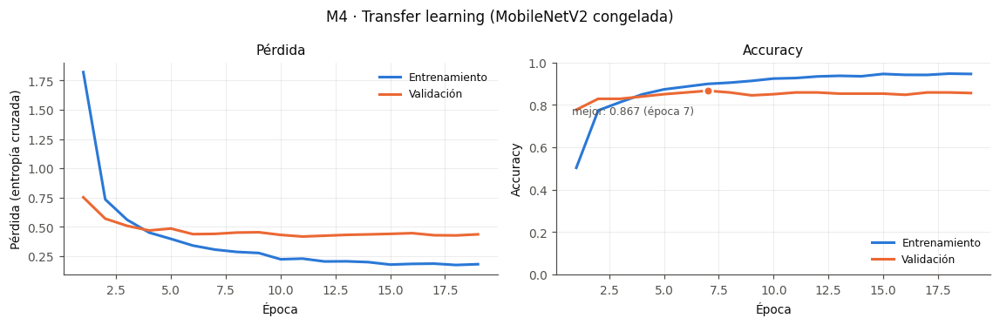

Diagnosticando si el modelo sufre overfitting o underfitting 🩺
Mejor época            : 7 de 19
Accuracy entrenamiento : 89.92 %
Accuracy validación    : 86.68 %
Brecha (ent - val)     : +3.23 puntos
=> AJUSTE CORRECTO: brecha de 3.2 puntos, dentro del margen aceptable.

Evaluando el modelo sobre el conjunto de validación 🧪
  validación: pérdida 0.4400 | accuracy 86.68 % | top-3 97.28 %
Registrando las métricas del modelo para la comparativa final 🗂
Contando los parámetros totales y entrenables del modelo 🧮
Parámetros: 2,305,381 totales | 47,397 entrenables


In [35]:
metricas_m4, diagnostico_m4 = evaluar_y_registrar(
    clave="m4",
    nombre_legible="M4 · Transfer learning (MobileNetV2 congelada)",
    descripcion="Extractor de características ImageNet congelado + cabeza densa entrenada.",
    modelo=modelo_m4,
    registro=registro_m4,
    val_ds=val_ds,
    archivo="m4_transfer",
    estrategia="congelada",
    base="mobilenetv2",
    corto="M4 · MobileNetV2",
)

### 7.3 Conclusiones

En la versión anterior del estudio, la mejor CNN propia entrenada desde cero no llegó al 30 % de *accuracy*
de validación. El Modelo 4 la supera **en decenas de puntos** entrenando únicamente ~47 K parámetros durante
muy pocas épocas. Esto confirma la conclusión del EDA: con ≈ 90 imágenes por clase, **la calidad de las
representaciones preentrenadas pesa mucho más que el diseño de la arquitectura**.

Qué observar en las curvas:

* **Convergencia muy rápida.** Se está resolviendo una regresión logística multinomial sobre características
  de altísima calidad, un problema convexo y bien condicionado.
* **Brecha entrenamiento-validación pequeña.** Con solo la cabeza entrenable, la capacidad de memorizar es
  limitada. La *accuracy* de entrenamiento se mide además con imágenes aumentadas y *dropout* activo, por lo
  que tiende a subestimar la real.
* **Aplanamiento temprano de la validación.** Las características de ImageNet son genéricas y no mejoran sin
  **especializarse** en las razas del problema (Modelo 5), o sin un **modelo base más potente** (sección 9).

## 8. Modelo 5: Fine-tuning de MobileNetV2

El *fine-tuning* parte del Modelo 4 **ya entrenado** y descongela las **últimas 40 capas** del modelo base
para reentrenarlas junto con la cabeza, empleando una tasa de aprendizaje muy pequeña ($10^{-5}$, cien veces
menor que la del Modelo 4).

**Por qué solo las últimas capas.** En una CNN profunda existe un gradiente de especificidad: las primeras
capas detectan bordes y colores —útiles para cualquier imagen natural, no hay nada que mejorar en ellas— y
las últimas codifican conceptos específicos del dominio de origen. Son estas últimas las que deben
reorientarse hacia las 37 razas del problema. Descongelar la red entera con tan pocos datos provocaría
sobreajuste y destruiría representaciones valiosas.

**Por qué una tasa de aprendizaje tan baja.** Los pesos preentrenados están cerca de un buen mínimo. Con
$\eta = 10^{-3}$, las primeras actualizaciones los desplazarían tanto que se perdería el conocimiento
adquirido en ImageNet (*catastrophic forgetting*). Con $\eta = 10^{-5}$ se hace un ajuste fino.

**Por qué la cabeza debía entrenarse primero.** Si se descongelara la base con una cabeza inicializada al
azar, los gradientes iniciales —enormes, procedentes de una salida esencialmente aleatoria— se
retropropagarían a la base y arruinarían sus pesos. Este es el motivo por el que el Modelo 5 se construye
**cargando el punto de control del Modelo 4** en lugar de construirse de cero.

**Por qué la *batch normalization* permanece congelada.** Tal como se explicó en la sección 5.4, el modelo
base se invoca con `training=False` (sus estadísticas móviles nunca se actualizan) y además se marcan sus
capas `BatchNormalization` como no entrenables, de modo que tampoco se actualicen $\gamma$ y $\beta$. Es el
error más habitual —y más difícil de diagnosticar— del *fine-tuning*.

### 8.1 Construcción a partir del Modelo 4

In [36]:
# =====================================================================
# 8. Modelo 5: fine-tuning de las últimas capas de MobileNetV2
# =====================================================================

HP_M5 = {
    "modelo_base": "MobileNetV2 preentrenada + cabeza del M4 ya entrenada",
    "estrategia": "fine-tuning de las últimas 40 capas (BatchNorm congelada)",
    "capas_descongeladas": 40,
    "optimizador": "adam",
    "tasa_aprendizaje": 1e-5,
    "data_augmentation": True,
}


def descongelar_ultimas_capas(base, n_capas=40):
    """Hace entrenables las n últimas capas del modelo base, salvo las de BatchNorm.

    Las capas de normalización por lotes se mantienen congeladas para preservar las
    estadísticas aprendidas sobre ImageNet (sección 5.4).
    """
    print("Descongelando las últimas capas del modelo base, manteniendo congelada la BatchNorm 🔓")
    base.trainable = True
    for capa in base.layers[:-n_capas]:
        capa.trainable = False
    for capa in base.layers[-n_capas:]:
        capa.trainable = not isinstance(capa, keras.layers.BatchNormalization)
    return base


def construir_fine_tuning(nombre_modelo_previo="m4_transfer", n_capas=40, tasa_aprendizaje=1e-5):
    """Modelo 5: parte del mejor punto de control del Modelo 4 y descongela la base."""
    print("Construyendo el Modelo 5: fine-tuning a partir del mejor punto de control del Modelo 4 🔥")
    modelo = keras.models.load_model(_ruta_modelo(nombre_modelo_previo))
    base = obtener_submodelo_base(modelo)
    descongelar_ultimas_capas(base, n_capas)
    modelo._name = "m5_finetuning"
    return compilar_modelo(modelo, tasa_aprendizaje, HP_M5["optimizador"])


_m5_demo = construir_fine_tuning()
_tot5, _ent5 = contar_parametros(_m5_demo)
_base_demo = obtener_submodelo_base(_m5_demo)
print(f"Capas del modelo base            : {len(_base_demo.layers)}")
print(f"Capas base entrenables           : {sum(c.trainable for c in _base_demo.layers)}")
print(f"Parámetros totales               : {_tot5:,}")
print(f"Parámetros entrenables           : {_ent5:,} ({100 * _ent5 / _tot5:.1f} %)")
del _m5_demo, _base_demo

Construyendo el Modelo 5: fine-tuning a partir del mejor punto de control del Modelo 4 🔥
Localizando el modelo preentrenado anidado dentro del modelo compuesto 🔎
Descongelando las últimas capas del modelo base, manteniendo congelada la BatchNorm 🔓
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Contando los parámetros totales y entrenables del modelo 🧮
Localizando el modelo preentrenado anidado dentro del modelo compuesto 🔎
Capas del modelo base            : 154
Capas base entrenables           : 26
Parámetros totales               : 2,305,381
Parámetros entrenables           : 1,710,757 (74.2 %)


### 8.2 Entrenamiento y resultados

In [37]:
modelo_m5, registro_m5 = entrenar_o_cargar(
    nombre="m5_finetuning",
    funcion_constructora=construir_fine_tuning,
    train_ds=train_ds,
    val_ds=val_ds,
    epocas=EPOCAS["m5_finetuning"],
    paciencia_parada=6,
    paciencia_lr=3,
    hiperparametros=HP_M5,
)

Entrenando el modelo 'm5_finetuning', o recuperándolo del disco si ya fue entrenado 🚀
[m5_finetuning] entrenando (máximo 25 épocas)...
Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅

Construyendo el Modelo 5: fine-tuning a partir del mejor punto de control del Modelo 4 🔥
Localizando el modelo preentrenado anidado dentro del modelo compuesto 🔎
Descongelando las últimas capas del modelo base, manteniendo congelada la BatchNorm 🔓
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Creando los callbacks: checkpoint del mejor modelo, early stopping y reducción de la tasa de aprendizaje 🔔
Epoch 1/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9052 - loss: 0.2832 - top3: 0.9912 - val_accuracy: 0.8668 - val_loss: 0.4530 - val_top3: 0.9701 - learning_rate: 1.0000e-05
Epoch 2/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9158 - loss: 0.2481 - top3: 0.9915 - val_accuracy: 0.8505 - val_loss: 0.4757 - val_top3: 0.9755 - le

Ejecutando el bloque de análisis del modelo: curvas, diagnóstico, evaluación y registro 🧾
Dibujando las curvas de pérdida y accuracy de entrenamiento y validación 📉


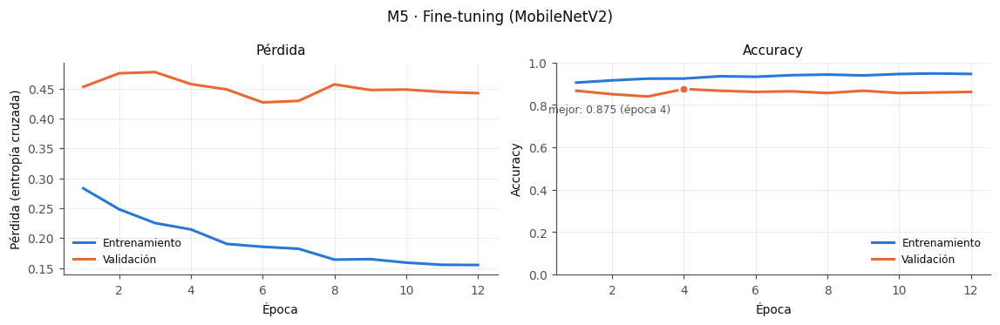

Diagnosticando si el modelo sufre overfitting o underfitting 🩺
Mejor época            : 4 de 12
Accuracy entrenamiento : 92.42 %
Accuracy validación    : 87.50 %
Brecha (ent - val)     : +4.92 puntos
=> AJUSTE CORRECTO: brecha de 4.9 puntos, dentro del margen aceptable.

Evaluando el modelo sobre el conjunto de validación 🧪
  validación: pérdida 0.4575 | accuracy 87.50 % | top-3 96.20 %
Registrando las métricas del modelo para la comparativa final 🗂
Contando los parámetros totales y entrenables del modelo 🧮
Parámetros: 2,305,381 totales | 1,710,757 entrenables


In [38]:
metricas_m5, diagnostico_m5 = evaluar_y_registrar(
    clave="m5",
    nombre_legible="M5 · Fine-tuning (MobileNetV2)",
    descripcion="Últimas 40 capas de MobileNetV2 reentrenadas con lr=1e-5 sobre la cabeza del M4.",
    modelo=modelo_m5,
    registro=registro_m5,
    val_ds=val_ds,
    archivo="m5_finetuning",
    estrategia="fine-tuning",
    base="mobilenetv2",
    corto="M5 · MobileNetV2 FT",
)

### 8.3 Modelo 4 frente a Modelo 5

In [39]:
def comparar_par(clave_a, clave_b, margen_ruido=0.01):
    """Compara dos modelos registrados e interpreta la diferencia de validación."""
    print(f"Comparando {RESULTADOS[clave_a]['corto']} con {RESULTADOS[clave_b]['corto']} ⚖")
    a, b = RESULTADOS[clave_a], RESULTADOS[clave_b]
    print(f"{'':<28}{a['corto']:>22}{b['corto']:>22}")
    for etiqueta, campo, escala, fmt in [
        ("Accuracy validación (%)", "acc_validacion", 100, ".2f"),
        ("Top-3 validación (%)", "top3_validacion", 100, ".2f"),
        ("Pérdida validación", "perdida_validacion", 1, ".4f"),
        ("Brecha ent-val (puntos)", "brecha", 100, "+.2f"),
        ("Mejor época", "mejor_epoca", 1, "d"),
        ("Parámetros entrenables", "parametros_entrenables", 1, ",d"),
    ]:
        print(f"{etiqueta:<28}{format(a[campo] * escala, fmt):>22}{format(b[campo] * escala, fmt):>22}")
    delta = b["acc_validacion"] - a["acc_validacion"]
    print(f"\nDiferencia de accuracy ({b['corto']} - {a['corto']}): {delta * 100:+.2f} puntos")
    if abs(delta) < margen_ruido:
        print(f"=> Diferencia inferior a {margen_ruido * 100:.0f} punto: dentro del ruido de una validación "
              f"de {N_VALIDACION} imágenes; ninguno de los dos es claramente superior.")
    elif delta > 0:
        print(f"=> {b['corto']} mejora a {a['corto']} de forma apreciable.")
    else:
        print(f"=> {b['corto']} NO mejora a {a['corto']}.")
    return delta


delta_m5_m4 = comparar_par("m4", "m5")

Comparando M4 · MobileNetV2 con M5 · MobileNetV2 FT ⚖
                                  M4 · MobileNetV2   M5 · MobileNetV2 FT
Accuracy validación (%)                      86.68                 87.50
Top-3 validación (%)                         97.28                 96.20
Pérdida validación                          0.4400                0.4575
Brecha ent-val (puntos)                      +3.23                 +4.92
Mejor época                                      7                     4
Parámetros entrenables                      47,397             1,710,757

Diferencia de accuracy (M5 · MobileNetV2 FT - M4 · MobileNetV2): +0.82 puntos
=> Diferencia inferior a 1 punto: dentro del ruido de una validación de 368 imágenes; ninguno de los dos es claramente superior.


### 8.4 Conclusiones

El *fine-tuning* debería especializar las últimas capas convolucionales en los detalles de grano fino que
distinguen razas emparentadas: textura del pelaje, forma del hocico, proporción de las orejas. Que lo consiga
depende de un equilibrio delicado, y la comparación anterior sirve para comprobarlo:

* **Si el M5 mejora al M4**, la especialización compensa el aumento de capacidad. Lo normal es que la mejora
  aparezca desde las primeras épocas, señal de que el ajuste es fino y no destructivo.
* **Si el M5 no mejora** (en la versión anterior del estudio quedó 0,27 puntos por debajo, con la mejor época
  en la 3.ª), el motivo es la **capacidad liberada**. Al descongelar 40 capas, los parámetros entrenables pasan
  de ~47 K a ~1,7 M (el 74 % del modelo) para menos de 3 000 imágenes, y la validación se estanca o empeora en
  pocas épocas. MobileNetV2 es además una red muy compacta: hay poco margen para especializarla sin perder
  generalidad.

En ambos casos, el techo del M4/M5 lo marca la **calidad del extractor**. La pregunta natural es si otros
modelos base, con representaciones más ricas, rinden más con el mismo protocolo. Eso es lo que se estudia en
la sección 9.

## 9. Exploración de arquitecturas de transfer learning

Los Modelos 4 y 5 fijan una referencia con MobileNetV2. Esta sección responde a una pregunta más amplia:
**¿qué arquitectura de *transfer learning* resuelve mejor este problema?** Se exploran tres ejes, uno por
fase, cambiando **una sola familia de decisiones en cada una**:

| Fase | Qué se varía | Qué se mantiene fijo |
|---|---|---|
| **1. Modelo base** | 8 redes preentrenadas en ImageNet, congeladas | Cabeza GAP → Dropout(0,3) → Dense(37), Adam $10^{-3}$, *augmentation*, *callbacks* |
| **2. Cabeza de clasificación** | 3 cabezas sobre el mejor modelo base de la fase 1 | Modelo base congelado, optimizador, *augmentation*, *callbacks* |
| **3. *Fine-tuning*** | Se descongela el 25 % final de las capas de los 3 mejores modelos base | Punto de partida = su mejor modelo congelado, Adam $10^{-5}$, BN congelada |

**Controles para que la comparación sea justa:** misma partición, misma semilla (reiniciada antes de cada
modelo), mismo tamaño de entrada (160×160), mismo *data augmentation*, mismos *callbacks* y mismo número
máximo de épocas. Cada modelo base recibe **su propia normalización** (sección 3). La MobileNetV2 congelada
de la fase 1 es el propio Modelo 4, entrenado con exactamente este protocolo.

**Modelos base evaluados.** Las cifras de ImageNet proceden de la documentación de `keras.applications` y
se midieron a la resolución nativa de cada red (224 o 299 px). A 160 px cabe esperar valores algo menores,
aunque el orden relativo suele mantenerse.

| Modelo base | Año | Parámetros (con clasificador) | Top-1 ImageNet | Idea arquitectónica clave | Preprocesado |
|---|---|---|---|---|---|
| MobileNetV2 | 2018 | 3,5 M | 71,3 % | Convoluciones separables en profundidad y residuos invertidos | $[-1, 1]$ |
| EfficientNetB0 | 2019 | 5,3 M | 77,1 % | Escalado compuesto de profundidad, anchura y resolución; bloques MBConv con *squeeze-and-excitation* | Incluido |
| EfficientNetV2B0 | 2021 | 7,2 M | 78,7 % | Bloques *Fused-MBConv* en las primeras etapas, más rápidos de entrenar | Incluido |
| ResNet50V2 | 2016 | 25,6 M | 76,0 % | Conexiones residuales con pre-activación (BN → ReLU → Conv) | $[-1, 1]$ |
| DenseNet121 | 2017 | 8,1 M | 75,0 % | Conexiones densas: cada capa recibe los mapas de todas las anteriores | Media/desv. ImageNet |
| InceptionV3 | 2016 | 23,9 M | 77,9 % | Módulos multiescala en paralelo con convoluciones factorizadas | $[-1, 1]$ |
| Xception | 2017 | 22,9 M | 79,0 % | Inception llevado al extremo: separables en profundidad + residuos | $[-1, 1]$ |
| ConvNeXtTiny | 2022 | 28,6 M | 81,3 % | CNN "modernizada" con decisiones de los *Vision Transformers*: kernels 7×7, LayerNorm, GELU | Incluido |

**Hipótesis.** En clasificación de grano fino con pocos datos, el rendimiento al congelar la base debería
seguir de cerca la calidad de sus representaciones, aproximada por su *accuracy* en ImageNet. El número de
parámetros no debería explicarlo tanto: ResNet50V2 tiene siete veces más que EfficientNetB0 y peor
*accuracy* en ImageNet.

**Criterio de selección.** Gana la mayor *accuracy* de validación **entre los modelos sin síntomas de
sobreajuste ni de infraajuste**: brecha entrenamiento-validación ≤ 10 puntos y *accuracy* de entrenamiento
≥ 55 %, los mismos umbrales de la sección 6.2. Si dos modelos empatan, decide la menor pérdida de
validación. El conjunto de test **no interviene** en ninguna decisión.

> **Coste computacional.** Con GPU, cada modelo congelado tarda unos pocos minutos y cada *fine-tuning*
> algo más. Todos los puntos de control se guardan en `modelos/` y, en ejecuciones posteriores, se
> cargan de disco sin reentrenar. Para acortar la exploración basta con quitar elementos de
> `BASES_EXPLORACION` en la sección 1.2.

### 9.1 Catálogo de modelos base y constructores genéricos

Las funciones siguientes generalizan las de los Modelos 4 y 5 a cualquier red de `keras.applications`:

* `crear_capa_preproceso()` implementa la normalización de cada familia **como capas serializables**
  (`Rescaling`, `Normalization` o `Identity`), sin capas `Lambda`. El modelo guardado sigue siendo
  autocontenido y se carga sin código adicional.
* `construir_extractor()` monta *augmentation* → preprocesado → base congelada (`training=False`) → cabeza,
  con tres cabezas posibles:
  * `simple`: GAP → Dropout → Dense(37). Es la del Modelo 4.
  * `densa`: GAP → Dense(256) → BN → ReLU → Dropout(0,5) → Dense(37). Añade una capa oculta no lineal.
  * `gap_gmp`: concatenación de *global average* y *global max pooling* → Dropout(0,4) → Dense(37). El
    máximo conserva la activación más fuerte de cada canal, útil cuando el rasgo discriminante ocupa una zona
    pequeña de la imagen.
* `construir_fine_tuning_generico()` parte del mejor punto de control congelado y descongela una
  **fracción** final de las capas del modelo base, reutilizando `descongelar_ultimas_capas()` del Modelo 5
  (BN congelada). Se usa una fracción, y no un número fijo de capas, porque las redes tienen profundidades
  muy distintas: de ~150 capas en MobileNetV2 a más de 400 en DenseNet121.

In [40]:
# =====================================================================
# 9.1. Catálogo de modelos base y constructores genéricos
# =====================================================================

CATALOGO_BASES = {
    "mobilenetv2":      {"nombre": "MobileNetV2",      "constructor": keras.applications.MobileNetV2,
                         "preproceso": "tf",       "kwargs": {}},
    "efficientnetb0":   {"nombre": "EfficientNetB0",   "constructor": keras.applications.EfficientNetB0,
                         "preproceso": "incluido", "kwargs": {}},
    "efficientnetv2b0": {"nombre": "EfficientNetV2B0", "constructor": keras.applications.EfficientNetV2B0,
                         "preproceso": "incluido", "kwargs": {"include_preprocessing": True}},
    "resnet50v2":       {"nombre": "ResNet50V2",       "constructor": keras.applications.ResNet50V2,
                         "preproceso": "tf",       "kwargs": {}},
    "densenet121":      {"nombre": "DenseNet121",      "constructor": keras.applications.DenseNet121,
                         "preproceso": "torch",    "kwargs": {}},
    "inceptionv3":      {"nombre": "InceptionV3",      "constructor": keras.applications.InceptionV3,
                         "preproceso": "tf",       "kwargs": {}},
    "xception":         {"nombre": "Xception",         "constructor": keras.applications.Xception,
                         "preproceso": "tf",       "kwargs": {}},
    "convnext_tiny":    {"nombre": "ConvNeXtTiny",     "constructor": keras.applications.ConvNeXtTiny,
                         "preproceso": "incluido", "kwargs": {"include_preprocessing": True}},
}

MEDIA_IMAGENET = [0.485, 0.456, 0.406]
DESV_IMAGENET = [0.229, 0.224, 0.225]

DESCRIPCION_CABEZAS = {
    "simple":  "GAP -> Dropout(0.3) -> Dense(37, softmax)",
    "densa":   "GAP -> Dense(256) -> BN -> ReLU -> Dropout(0.5) -> Dense(37, softmax)",
    "gap_gmp": "Concat[GAP, GMP] -> Dropout(0.4) -> Dense(37, softmax)",
}


def crear_capa_preproceso(tipo, nombre="preproceso"):
    """Normalización que espera cada familia de modelos preentrenados, como capas serializables."""
    print(f"Creando la capa de preprocesado de tipo '{tipo}' 🎚")
    if tipo == "tf":          # [0, 255] -> [-1, 1]
        return keras.layers.Rescaling(1.0 / 127.5, offset=-1.0, name=nombre)
    if tipo == "torch":       # [0, 255] -> [0, 1] -> estandarización con media y desviación de ImageNet
        return keras.Sequential([
            keras.layers.Rescaling(1.0 / 255),
            keras.layers.Normalization(mean=MEDIA_IMAGENET,
                                       variance=[d ** 2 for d in DESV_IMAGENET]),
        ], name=nombre)
    if tipo == "incluido":    # el propio modelo de Keras normaliza internamente
        return keras.layers.Identity(name=nombre)
    raise ValueError(f"Tipo de preprocesado no soportado: {tipo}")


def crear_base(clave_base, entrenable=False):
    """Carga un modelo base de keras.applications preentrenado en ImageNet, sin su clasificador."""
    cfg = CATALOGO_BASES[clave_base]
    print(f"Cargando {cfg['nombre']} preentrenada en ImageNet, sin su clasificador 📦")
    base = cfg["constructor"](input_shape=FORMA_ENTRADA, include_top=False,
                              weights="imagenet", **cfg["kwargs"])
    base.trainable = entrenable
    return base


def crear_cabeza(x, tipo="simple"):
    """Cabeza de clasificación sobre el mapa de características del modelo base."""
    print(f"Añadiendo la cabeza de clasificación '{tipo}': {DESCRIPCION_CABEZAS[tipo]} 🧠")
    if tipo == "simple":
        x = keras.layers.GlobalAveragePooling2D(name="gap")(x)
        x = keras.layers.Dropout(0.3, name="dropout_clasificador")(x)
    elif tipo == "densa":
        x = keras.layers.GlobalAveragePooling2D(name="gap")(x)
        x = keras.layers.Dense(256, use_bias=False, name="densa_cabeza")(x)
        x = keras.layers.BatchNormalization(name="bn_cabeza")(x)
        x = keras.layers.Activation("relu", name="relu_cabeza")(x)
        x = keras.layers.Dropout(0.5, name="dropout_clasificador")(x)
    elif tipo == "gap_gmp":
        promedio = keras.layers.GlobalAveragePooling2D(name="gap")(x)
        maximo = keras.layers.GlobalMaxPooling2D(name="gmp")(x)
        x = keras.layers.Concatenate(name="gap_gmp")([promedio, maximo])
        x = keras.layers.Dropout(0.4, name="dropout_clasificador")(x)
    else:
        raise ValueError(f"Cabeza no soportada: {tipo}")
    return keras.layers.Dense(NUM_CLASES, activation="softmax", name="salida")(x)


def construir_extractor(clave_base, cabeza="simple", tasa_aprendizaje=1e-3, nombre=None):
    """Transfer learning por extracción de características con cualquier modelo base del catálogo."""
    print(f"Construyendo un extractor congelado con {CATALOGO_BASES[clave_base]['nombre']} ♻")
    base = crear_base(clave_base, entrenable=False)
    entradas = keras.Input(shape=FORMA_ENTRADA, name="entrada")
    x = crear_aumentador()(entradas)
    x = crear_capa_preproceso(CATALOGO_BASES[clave_base]["preproceso"])(x)
    # training=False fija las capas BatchNormalization del modelo base en modo inferencia.
    x = base(x, training=False)
    salidas = crear_cabeza(x, cabeza)
    modelo = keras.Model(entradas, salidas, name=nombre or f"tl_{clave_base}_{cabeza}")
    return compilar_modelo(modelo, tasa_aprendizaje, "adam")


def construir_fine_tuning_generico(nombre_modelo_previo, nombre_nuevo,
                                   fraccion=FRACCION_DESCONGELADA, tasa_aprendizaje=1e-5):
    """Fine-tuning: parte del mejor punto de control congelado y descongela la fracción final del modelo base."""
    print(f"Construyendo el fine-tuning de '{nombre_modelo_previo}' 🔥")
    modelo = keras.models.load_model(_ruta_modelo(nombre_modelo_previo),
                                     custom_objects=OBJETOS_PERSONALIZADOS)
    base = obtener_submodelo_base(modelo)
    n_capas = max(1, int(round(len(base.layers) * fraccion)))
    descongelar_ultimas_capas(base, n_capas)
    print(f"Capas del modelo base: {len(base.layers)} | descongeladas: {n_capas} "
          f"(entrenables sin contar BN: {sum(c.trainable for c in base.layers)})")
    modelo._name = nombre_nuevo
    return compilar_modelo(modelo, tasa_aprendizaje, "adam")


def ejecutar_experimento(clave, constructora, epocas, paciencia_parada, paciencia_lr,
                         hiperparametros, nombre_legible, corto, descripcion, estrategia, base,
                         mostrar_curvas=False):
    """Entrena (o carga), evalúa en validación y registra un experimento; libera memoria al terminar."""
    print(f"\n{'=' * 90}\nExperimento: {nombre_legible}\n{'=' * 90}")
    modelo, registro = entrenar_o_cargar(
        nombre=clave, funcion_constructora=constructora,
        train_ds=train_ds, val_ds=val_ds, epocas=epocas,
        paciencia_parada=paciencia_parada, paciencia_lr=paciencia_lr,
        hiperparametros=hiperparametros, verbose=2,
    )
    evaluar_y_registrar(clave=clave, nombre_legible=nombre_legible, descripcion=descripcion,
                        modelo=modelo, registro=registro, val_ds=val_ds, archivo=clave,
                        estrategia=estrategia, base=base, corto=corto,
                        mostrar_curvas=mostrar_curvas)
    del modelo
    gc.collect()
    return RESULTADOS[clave]

#### 9.1.1 Funciones de comparación y selección

Con más de una decena de modelos, un color por modelo sería ilegible. Las figuras codifican la
**estrategia** con color (azul = base congelada, naranja = *fine-tuning*) y la identidad del modelo con
etiquetas directas:

* **Gráfico de mancuernas** (entrenamiento frente a validación): ordena los modelos por *accuracy* de
  validación y muestra en la misma figura la **brecha** que diagnostica el sobreajuste. Al ser un gráfico de
  puntos, el eje no necesita empezar en cero para ser honesto.
* **Pequeños múltiplos** de curvas de aprendizaje: un panel por modelo, en la misma escala.
* **Eficiencia**: *accuracy* frente a parámetros totales, en escala logarítmica.

In [41]:
# =====================================================================
# 9.1.1. Funciones de comparación y selección
# =====================================================================

COLOR_ESTRATEGIA = {"congelada": C_SERIE_1, "fine-tuning": C_SERIE_2}
MARCADOR_ESTRATEGIA = {"congelada": "o", "fine-tuning": "^"}


def seleccionar_mejor(claves, umbral_brecha=0.10, umbral_infraajuste=0.55):
    """Mayor accuracy de validación entre los modelos sin over/underfitting; desempata la pérdida."""
    print("Seleccionando el mejor modelo por validación, descartando los que sobreajustan 🥇")
    candidatos = [k for k in claves if k in RESULTADOS]
    validos = [k for k in candidatos
               if RESULTADOS[k]["brecha"] <= umbral_brecha
               and RESULTADOS[k]["acc_entrenamiento"] >= umbral_infraajuste]
    descartados = sorted(set(candidatos) - set(validos))
    if descartados:
        print("Descartados por diagnóstico de ajuste:", ", ".join(RESULTADOS[k]["corto"] for k in descartados))
    grupo = validos or candidatos
    if not validos:
        print("Aviso: ningún modelo cumple los umbrales; se elige entre todos.")
    return max(grupo, key=lambda k: (round(RESULTADOS[k]["acc_validacion"], 4),
                                     -RESULTADOS[k]["perdida_validacion"]))


def tabla_resultados(claves, titulo, clave_destacada=None):
    """Tabla ordenada por accuracy de validación; la fila destacada se marca con ★."""
    print(f"Tabla comparativa: {titulo} 🏆")
    orden = sorted([k for k in claves if k in RESULTADOS],
                   key=lambda k: RESULTADOS[k]["acc_validacion"], reverse=True)
    encabezado = (f"  {'Modelo':<44}{'Estrategia':>12}{'Params':>13}{'Entren.':>12}{'Ép.':>5}"
                  f"{'Acc val':>9}{'Top-3':>8}{'Pérd.':>7}{'Brecha':>8}{'Min':>6}")
    print(encabezado)
    print("-" * len(encabezado))
    for k in orden:
        r = RESULTADOS[k]
        marca = "★ " if k == clave_destacada else "  "
        print(f"{marca}{r['nombre'][:43]:<44}{r['estrategia']:>12}{r['parametros']:>13,}"
              f"{r['parametros_entrenables']:>12,}{r['epocas']:>5}{r['acc_validacion'] * 100:>8.2f}%"
              f"{r['top3_validacion'] * 100:>7.2f}%{r['perdida_validacion']:>7.3f}"
              f"{r['brecha'] * 100:>+7.1f}p{r['minutos']:>6.1f}")
    print("-" * len(encabezado))
    return orden


def graficar_mancuernas(claves, titulo, clave_destacada=None):
    """Accuracy de entrenamiento y de validación por modelo, unidas por la brecha."""
    print("Dibujando la accuracy de entrenamiento frente a validación de cada modelo 📊")
    orden = sorted([k for k in claves if k in RESULTADOS],
                   key=lambda k: RESULTADOS[k]["acc_validacion"])
    y = np.arange(len(orden))
    ent = np.array([RESULTADOS[k]["acc_entrenamiento"] * 100 for k in orden])
    val = np.array([RESULTADOS[k]["acc_validacion"] * 100 for k in orden])

    fig, eje = plt.subplots(figsize=(8.2, 0.42 * len(orden) + 1.4))
    eje.hlines(y, np.minimum(ent, val), np.maximum(ent, val), color=C_REJILLA, linewidth=2, zorder=1)
    eje.scatter(ent, y, s=64, color=C_SERIE_1, edgecolors="white", linewidths=1.5, zorder=3,
                label="Entrenamiento (época del checkpoint)")
    eje.scatter(val, y, s=64, color=C_SERIE_2, edgecolors="white", linewidths=1.5, zorder=3,
                label="Validación (checkpoint evaluado)")
    for yi, v, e in zip(y, val, ent):
        eje.annotate(f"{v:.1f}", (max(v, e), yi), textcoords="offset points", xytext=(8, -3),
                     fontsize=8, color=C_TEXTO)
    eje.axvline(85, color=C_ACENTO, linestyle="--", linewidth=1.2)
    eje.text(85, len(orden) - 0.35, " objetivo 85 %", fontsize=8, color=C_SUAVE, va="bottom")
    eje.set_yticks(y)
    etiquetas = eje.set_yticklabels(
        [("★ " if k == clave_destacada else "") + RESULTADOS[k]["corto"] for k in orden], fontsize=8.5)
    for etiqueta, k in zip(etiquetas, orden):
        if k == clave_destacada:
            etiqueta.set_fontweight("bold")
    minimo = float(min(ent.min(), val.min()))
    eje.set_xlim(max(0, minimo - 5), 101)
    eje.set_ylim(-0.6, len(orden) - 0.1)
    eje.set_xlabel("Accuracy (%)")
    eje.set_title(titulo, fontsize=10, loc="left")
    eje.grid(axis="y", visible=False)
    fig.legend(*eje.get_legend_handles_labels(), frameon=False, fontsize=8, loc="lower center", ncol=2)
    fig.tight_layout(rect=(0, 0.07, 1, 1))
    plt.show()


def graficar_curvas_multiples(claves, titulo, columnas=4):
    """Pequeños múltiplos: curvas de accuracy de entrenamiento y validación, misma escala."""
    print("Dibujando las curvas de aprendizaje de cada modelo en paneles con la misma escala 📉")
    claves = [k for k in claves if k in REGISTROS]
    filas = int(np.ceil(len(claves) / columnas))
    fig, ejes = plt.subplots(filas, columnas, figsize=(2.9 * columnas, 2.3 * filas),
                             sharey=True, squeeze=False)
    for eje, k in zip(ejes.flat, claves):
        historia = REGISTROS[k]["historia"]
        epocas = np.arange(1, len(historia["accuracy"]) + 1)
        mejor = int(np.argmax(historia["val_accuracy"]))
        eje.plot(epocas, historia["accuracy"], color=C_SERIE_1, linewidth=1.8)
        eje.plot(epocas, historia["val_accuracy"], color=C_SERIE_2, linewidth=1.8)
        eje.scatter([epocas[mejor]], [historia["val_accuracy"][mejor]], s=40, color=C_SERIE_2,
                    edgecolors="white", linewidths=1.5, zorder=4)
        eje.set_title(RESULTADOS[k]["corto"], fontsize=8.5)
        eje.set_ylim(0, 1)
        eje.tick_params(labelsize=7.5)
    for eje in list(ejes.flat)[len(claves):]:
        eje.axis("off")
    manejadores = [plt.Line2D([0], [0], color=C_SERIE_1, lw=2, label="Entrenamiento"),
                   plt.Line2D([0], [0], color=C_SERIE_2, lw=2, label="Validación")]
    fig.legend(handles=manejadores, loc="upper right", frameon=False, fontsize=8, ncol=2)
    fig.suptitle(titulo, fontsize=11, x=0.01, ha="left")
    fig.supxlabel("Época", fontsize=9)
    fig.supylabel("Accuracy", fontsize=9)
    fig.tight_layout()
    plt.show()


def graficar_eficiencia(claves, titulo, clave_destacada=None):
    """Accuracy de validación frente al número de parámetros totales (escala logarítmica)."""
    print("Dibujando la accuracy frente al tamaño del modelo ⚡")
    fig, eje = plt.subplots(figsize=(7.4, 4.2))
    for estrategia, color in COLOR_ESTRATEGIA.items():
        grupo = [k for k in claves if k in RESULTADOS and RESULTADOS[k]["estrategia"] == estrategia]
        if not grupo:
            continue
        eje.scatter([RESULTADOS[k]["parametros"] for k in grupo],
                    [RESULTADOS[k]["acc_validacion"] * 100 for k in grupo],
                    s=80, color=color, marker=MARCADOR_ESTRATEGIA[estrategia],
                    edgecolors="white", linewidths=1.5, zorder=3,
                    label="Base congelada" if estrategia == "congelada" else "Fine-tuning")
    for k in claves:
        if k not in RESULTADOS:
            continue
        r = RESULTADOS[k]
        texto = ("★ " if k == clave_destacada else "") + r["corto"]
        eje.annotate(texto, (r["parametros"], r["acc_validacion"] * 100), textcoords="offset points",
                     xytext=(0, 9), ha="center", fontsize=7.5, color=C_TEXTO,
                     fontweight="bold" if k == clave_destacada else "normal")
    eje.axhline(85, color=C_ACENTO, linestyle="--", linewidth=1.2)
    eje.set_xscale("log")
    eje.set_xlabel("Parámetros totales (escala log)")
    eje.set_ylabel("Accuracy de validación (%)")
    eje.set_title(titulo, fontsize=10, loc="left")
    eje.legend(frameon=False, fontsize=8, loc="lower right")
    fig.tight_layout()
    plt.show()

### 9.2 Fase 1: comparación de modelos base congelados

Se entrena cada modelo base del catálogo con la **misma receta del Modelo 4**. La MobileNetV2 congelada no
se reentrena: es el propio M4, que se incorpora directamente a la comparativa. Para no alargar el notebook,
las trazas de entrenamiento se muestran de forma compacta (`verbose=2`) y las curvas se agrupan en pequeños
múltiplos al final.

In [42]:
# --- Ejecución estructurada: fase 1 ----------------------------------
HP_FASE1 = {
    "estrategia": "extracción de características (base congelada)",
    "cabeza": DESCRIPCION_CABEZAS["simple"],
    "optimizador": "adam",
    "tasa_aprendizaje": 1e-3,
    "data_augmentation": True,
    "epocas_maximas": EPOCAS["base_congelada"],
    "paciencia_parada": 8,
    "paciencia_lr": 3,
}

CLAVES_FASE1 = ["m4"]   # MobileNetV2 congelada = Modelo 4 (mismo protocolo)

for clave_base in BASES_EXPLORACION:
    nombre_base = CATALOGO_BASES[clave_base]["nombre"]
    clave = f"tl_{clave_base}"
    ejecutar_experimento(
        clave=clave,
        constructora=lambda cb=clave_base, nm=clave: construir_extractor(cb, cabeza="simple", nombre=nm),
        epocas=EPOCAS["base_congelada"],
        paciencia_parada=HP_FASE1["paciencia_parada"],
        paciencia_lr=HP_FASE1["paciencia_lr"],
        hiperparametros={**HP_FASE1, "modelo_base": f"{nombre_base} (ImageNet, include_top=False)",
                         "preproceso": CATALOGO_BASES[clave_base]["preproceso"]},
        nombre_legible=f"TL · {nombre_base} congelada",
        corto=nombre_base,
        descripcion=f"{nombre_base} congelada + cabeza simple.",
        estrategia="congelada",
        base=clave_base,
    )
    CLAVES_FASE1.append(clave)


Experimento: TL · EfficientNetB0 congelada
Entrenando el modelo 'tl_efficientnetb0', o recuperándolo del disco si ya fue entrenado 🚀
[tl_efficientnetb0] entrenando (máximo 30 épocas)...
Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅

Construyendo un extractor congelado con EfficientNetB0 ♻
Cargando EfficientNetB0 preentrenada en ImageNet, sin su clasificador 📦
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Creando el bloque de data augmentation: volteo, rotación, zoom, traslación y contraste 🔄
Creando la capa de preprocesado de tipo 'incluido' 🎚
Añadiendo la cabeza de clasificación 'simple': GAP -> Dropout(0.3) -> Dense(37, softmax) 🧠
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Creando los callbacks: checkpoint del mejor modelo, early stopping y reducción de la tasa de aprendizaje 🔔
Epoch 1/30
104/104 - 20s - 190ms/step - accuracy: 0.5411 - loss: 2.0159 - top3: 0.7340 - val_accuracy: 0.8098 - val_loss: 0.8796 - val_top3: 0

#### 9.2.1 Resultados de la fase 1

In [43]:
MEJOR_FASE1 = seleccionar_mejor(CLAVES_FASE1)
_ = tabla_resultados(CLAVES_FASE1, "fase 1 · modelos base congelados", MEJOR_FASE1)
print(f"\nMejor modelo base congelado: {RESULTADOS[MEJOR_FASE1]['nombre']} "
      f"({RESULTADOS[MEJOR_FASE1]['acc_validacion'] * 100:.2f} % en validación)")

Seleccionando el mejor modelo por validación, descartando los que sobreajustan 🥇
Tabla comparativa: fase 1 · modelos base congelados 🏆
  Modelo                                        Estrategia       Params     Entren.  Ép.  Acc val   Top-3  Pérd.  Brecha   Min
------------------------------------------------------------------------------------------------------------------------------
★ TL · ConvNeXtTiny congelada                    congelada   27,848,581      28,453   30   90.76%  98.10%  0.336   +6.0p  11.1
  TL · EfficientNetV2B0 congelada                congelada    5,966,709      47,397   30   90.22%  98.10%  0.327   +4.6p   2.6
  TL · DenseNet121 congelada                     congelada    7,075,429      37,925   24   89.95%  97.01%  0.410   -0.9p   4.7
  TL · EfficientNetB0 congelada                  congelada    4,096,968      47,397   27   89.40%  98.37%  0.316   +6.2p   2.8
  M4 · Transfer learning (MobileNetV2 congela    congelada    2,305,381      47,397   19   86.68%  97.2

Dibujando la accuracy de entrenamiento frente a validación de cada modelo 📊


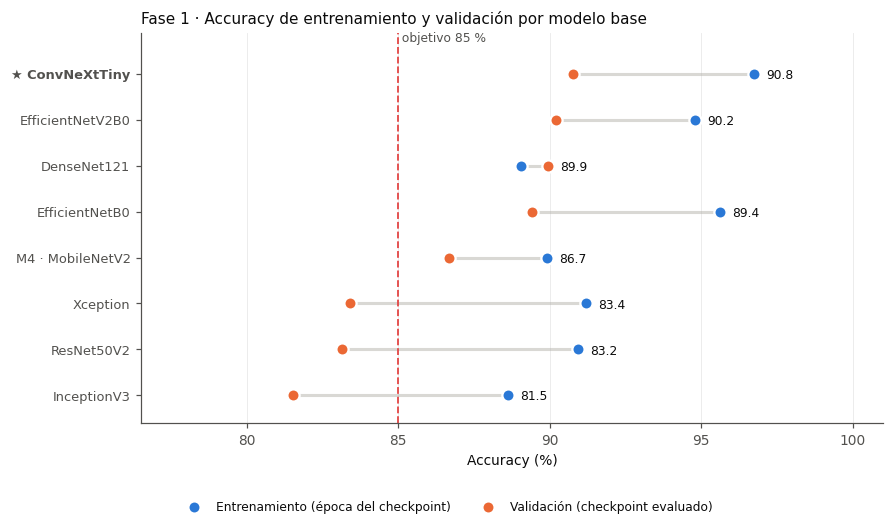

Dibujando las curvas de aprendizaje de cada modelo en paneles con la misma escala 📉


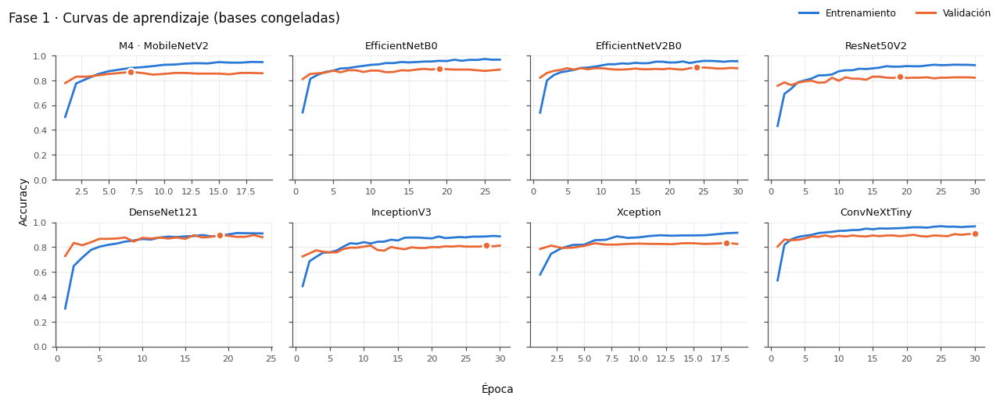

Dibujando la accuracy frente al tamaño del modelo ⚡


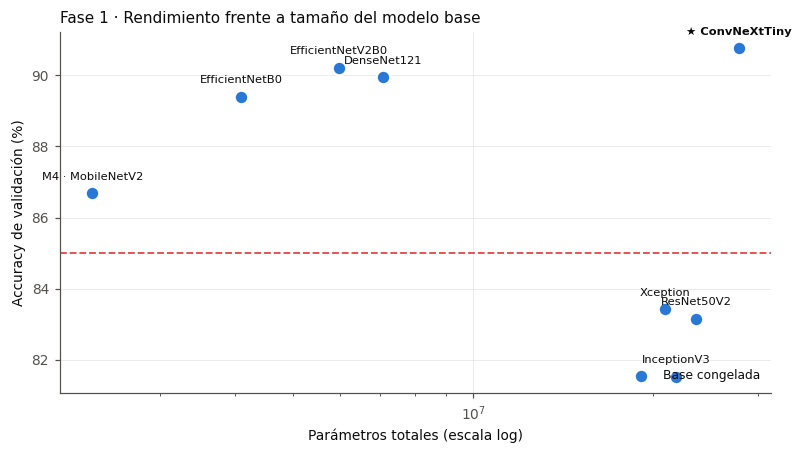

In [44]:
graficar_mancuernas(CLAVES_FASE1, "Fase 1 · Accuracy de entrenamiento y validación por modelo base",
                    MEJOR_FASE1)
graficar_curvas_multiples(CLAVES_FASE1, "Fase 1 · Curvas de aprendizaje (bases congeladas)")
graficar_eficiencia(CLAVES_FASE1, "Fase 1 · Rendimiento frente a tamaño del modelo base", MEJOR_FASE1)

In [45]:
def correlacion_imagenet(claves):
    """¿Predice la accuracy en ImageNet el rendimiento al transferir? Correlación de rangos de Spearman."""
    print("Midiendo si la accuracy en ImageNet anticipa el rendimiento en este problema 🔗")
    top1_imagenet = {"mobilenetv2": 71.3, "efficientnetb0": 77.1, "efficientnetv2b0": 78.7,
                     "resnet50v2": 76.0, "densenet121": 75.0, "inceptionv3": 77.9,
                     "xception": 79.0, "convnext_tiny": 81.3}
    claves = [k for k in claves if RESULTADOS[k]["base"] in top1_imagenet]
    x = np.array([top1_imagenet[RESULTADOS[k]["base"]] for k in claves])
    y = np.array([RESULTADOS[k]["acc_validacion"] for k in claves])
    p = np.array([RESULTADOS[k]["parametros"] for k in claves], dtype=float)
    rango = lambda v: np.argsort(np.argsort(v))
    rho_imagenet = float(np.corrcoef(rango(x), rango(y))[0, 1])
    rho_parametros = float(np.corrcoef(rango(p), rango(y))[0, 1])
    print(f"Spearman(top-1 ImageNet, accuracy validación) = {rho_imagenet:+.2f}")
    print(f"Spearman(nº parámetros,  accuracy validación) = {rho_parametros:+.2f}")
    return rho_imagenet, rho_parametros


rho_imagenet, rho_parametros = correlacion_imagenet(CLAVES_FASE1)

Midiendo si la accuracy en ImageNet anticipa el rendimiento en este problema 🔗
Spearman(top-1 ImageNet, accuracy validación) = +0.29
Spearman(nº parámetros,  accuracy validación) = -0.10


**Cómo leer la fase 1.**

* **El orden de las bases.** Si la hipótesis se cumple, la correlación de Spearman con el top-1 de ImageNet
  será claramente positiva y mayor que la correlación con el número de parámetros. Las familias modernas
  (ConvNeXt, EfficientNet/V2, Xception) deberían ocupar la parte alta, y MobileNetV2 y DenseNet121 la baja.
* **La brecha.** Con la base congelada solo se entrena la cabeza, así que la brecha debería ser pequeña en
  todas. Una base con brecha grande indica que su vector de características es muy largo respecto a los
  datos: 2 048 dimensiones en ResNet50V2, InceptionV3 y Xception, frente a 1 280 en MobileNetV2. En ese caso,
  la cabeza de 37 salidas tiene muchos más pesos que ajustar.
* **La resolución.** Las redes diseñadas para 299 px (InceptionV3 y Xception) llegan a su última etapa con
  mapas de solo 3×3 o 5×5 a 160 px, y pueden verse más penalizadas que las diseñadas para 224 px.

### 9.3 Fase 2: cabezas de clasificación sobre el mejor modelo base

Fijado el mejor modelo base, se estudia si una cabeza más expresiva extrae más información de sus
características. Solo cambia la cabeza. La cabeza `simple` ya está evaluada en la fase 1 y sirve de
referencia.

Modelo base de la fase 2: ConvNeXtTiny

Experimento: TL · ConvNeXtTiny congelada + cabeza densa
Entrenando el modelo 'tlh_convnext_tiny_densa', o recuperándolo del disco si ya fue entrenado 🚀
[tlh_convnext_tiny_densa] entrenando (máximo 30 épocas)...
Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅

Construyendo un extractor congelado con ConvNeXtTiny ♻
Cargando ConvNeXtTiny preentrenada en ImageNet, sin su clasificador 📦
Creando el bloque de data augmentation: volteo, rotación, zoom, traslación y contraste 🔄
Creando la capa de preprocesado de tipo 'incluido' 🎚
Añadiendo la cabeza de clasificación 'densa': GAP -> Dense(256) -> BN -> ReLU -> Dropout(0.5) -> Dense(37, softmax) 🧠
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Creando los callbacks: checkpoint del mejor modelo, early stopping y reducción de la tasa de aprendizaje 🔔
Epoch 1/30
104/104 - 41s - 396ms/step - accuracy: 0.6332 - loss: 1.4282 - top3: 0.7880 - val_accuracy: 0.8

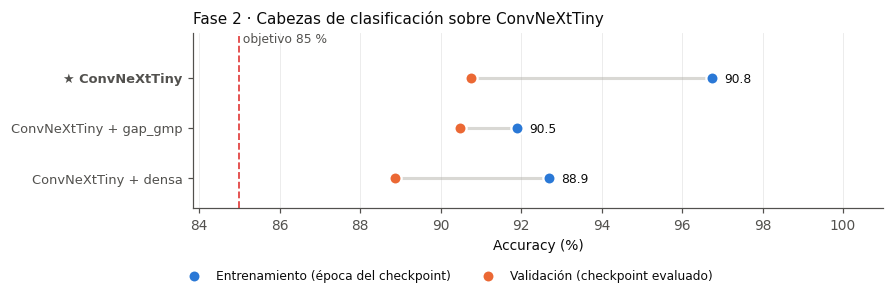

In [46]:
# --- Ejecución estructurada: fase 2 ----------------------------------
BASE_FASE2 = RESULTADOS[MEJOR_FASE1]["base"]
NOMBRE_BASE_FASE2 = CATALOGO_BASES[BASE_FASE2]["nombre"]
print(f"Modelo base de la fase 2: {NOMBRE_BASE_FASE2}")

CLAVES_FASE2 = [MEJOR_FASE1]   # cabeza "simple" ya entrenada en la fase 1

for cabeza in ["densa", "gap_gmp"]:
    clave = f"tlh_{BASE_FASE2}_{cabeza}"
    ejecutar_experimento(
        clave=clave,
        constructora=lambda cb=BASE_FASE2, cz=cabeza, nm=clave: construir_extractor(cb, cabeza=cz, nombre=nm),
        epocas=EPOCAS["base_congelada"],
        paciencia_parada=HP_FASE1["paciencia_parada"],
        paciencia_lr=HP_FASE1["paciencia_lr"],
        hiperparametros={**HP_FASE1, "modelo_base": f"{NOMBRE_BASE_FASE2} (ImageNet, include_top=False)",
                         "cabeza": DESCRIPCION_CABEZAS[cabeza],
                         "preproceso": CATALOGO_BASES[BASE_FASE2]["preproceso"]},
        nombre_legible=f"TL · {NOMBRE_BASE_FASE2} congelada + cabeza {cabeza}",
        corto=f"{NOMBRE_BASE_FASE2} + {cabeza}",
        descripcion=f"{NOMBRE_BASE_FASE2} congelada + cabeza {cabeza}.",
        estrategia="congelada",
        base=BASE_FASE2,
    )
    CLAVES_FASE2.append(clave)

MEJOR_FASE2 = seleccionar_mejor(CLAVES_FASE2)
_ = tabla_resultados(CLAVES_FASE2, f"fase 2 · cabezas sobre {NOMBRE_BASE_FASE2}", MEJOR_FASE2)
graficar_mancuernas(CLAVES_FASE2, f"Fase 2 · Cabezas de clasificación sobre {NOMBRE_BASE_FASE2}", MEJOR_FASE2)

**Cómo leer la fase 2.** La cabeza `densa` añade ~330 K–530 K parámetros entrenables y una no linealidad.
Solo compensa si las características del modelo base **no son linealmente separables** para las 37 razas.
Si iguala a la `simple`, sus parámetros extra no aportan nada y es preferible la cabeza más sencilla
(principio de parsimonia). La cabeza `gap_gmp` duplica el vector de características sin añadir capas
ocultas. Si mejora, indica que los rasgos discriminantes son **localizados**: una zona concreta del hocico o
de las orejas pesa más que la media de toda la imagen.

### 9.4 Fase 3: fine-tuning de los modelos más prometedores

Se toma **el mejor modelo congelado de cada modelo base**, se ordenan por validación y se ajustan los
`TOP_K_FINE_TUNING` primeros. MobileNetV2 se excluye porque ya tiene su *fine-tuning* (Modelo 5). Se aplican
las tres reglas de la sección 5.7: cabeza ya entrenada, tasa de aprendizaje $10^{-5}$ y BN congelada. Se
descongela el 25 % final de las capas de cada modelo base.

Respecto al Modelo 5 se refuerza el control del sobreajuste: la paciencia de parada baja a 5 épocas y la de
reducción de la tasa de aprendizaje a 2, porque en el M5 la mejor época llegó muy pronto.

In [47]:
# --- Ejecución estructurada: fase 3 ----------------------------------
HP_FASE3 = {
    "estrategia": f"fine-tuning del {int(FRACCION_DESCONGELADA * 100)} % final de capas (BN congelada)",
    "fraccion_descongelada": FRACCION_DESCONGELADA,
    "optimizador": "adam",
    "tasa_aprendizaje": 1e-5,
    "data_augmentation": True,
    "epocas_maximas": EPOCAS["fine_tuning"],
    "paciencia_parada": 5,
    "paciencia_lr": 2,
}

# Mejor modelo congelado de cada modelo base (fases 1 y 2), sin MobileNetV2 (ya ajustada en el M5)
mejor_por_base = {}
for k in dict.fromkeys(CLAVES_FASE1 + CLAVES_FASE2):
    r = RESULTADOS[k]
    if r["base"] == "mobilenetv2":
        continue
    if r["base"] not in mejor_por_base or r["acc_validacion"] > RESULTADOS[mejor_por_base[r["base"]]]["acc_validacion"]:
        mejor_por_base[r["base"]] = k

CANDIDATOS_FT = sorted(mejor_por_base.values(), key=lambda k: RESULTADOS[k]["acc_validacion"],
                       reverse=True)[:TOP_K_FINE_TUNING]
print("Modelos que pasan a fine-tuning:", ", ".join(RESULTADOS[k]["corto"] for k in CANDIDATOS_FT))

CLAVES_FASE3 = ["m5"]
for clave_previa in CANDIDATOS_FT:
    previo = RESULTADOS[clave_previa]
    clave = f"ft_{clave_previa}"
    ejecutar_experimento(
        clave=clave,
        constructora=lambda cp=clave_previa, nm=clave: construir_fine_tuning_generico(cp, nm),
        epocas=EPOCAS["fine_tuning"],
        paciencia_parada=HP_FASE3["paciencia_parada"],
        paciencia_lr=HP_FASE3["paciencia_lr"],
        hiperparametros={**HP_FASE3, "punto_de_partida": clave_previa,
                         "cabeza": previo["hiperparametros"].get("cabeza")},
        nombre_legible=f"FT · {previo['corto']}",
        corto=f"{previo['corto']} FT",
        descripcion=f"Fine-tuning de {previo['nombre']} ({int(FRACCION_DESCONGELADA * 100)} % final, lr=1e-5).",
        estrategia="fine-tuning",
        base=previo["base"],
    )
    CLAVES_FASE3.append(clave)

Modelos que pasan a fine-tuning: ConvNeXtTiny, EfficientNetV2B0, DenseNet121

Experimento: FT · ConvNeXtTiny
Entrenando el modelo 'ft_tl_convnext_tiny', o recuperándolo del disco si ya fue entrenado 🚀
[ft_tl_convnext_tiny] entrenando (máximo 20 épocas)...
Fija los generadores aleatorios de Python, NumPy y TensorFlow. ✅

Construyendo el fine-tuning de 'tl_convnext_tiny' 🔥
Localizando el modelo preentrenado anidado dentro del modelo compuesto 🔎
Descongelando las últimas capas del modelo base, manteniendo congelada la BatchNorm 🔓
Capas del modelo base: 133 | descongeladas: 33 (entrenables sin contar BN: 33)
Compilando el modelo con su optimizador adam, su función de pérdida y sus métricas ⚙
Creando los callbacks: checkpoint del mejor modelo, early stopping y reducción de la tasa de aprendizaje 🔔
Epoch 1/20
104/104 - 74s - 712ms/step - accuracy: 0.9728 - loss: 0.1105 - top3: 0.9997 - val_accuracy: 0.8995 - val_loss: 0.3333 - val_top3: 0.9810 - learning_rate: 1.0000e-05
Epoch 2/20
104/104 -

#### 9.4.1 Resultados de la fase 3

Seleccionando el mejor modelo por validación, descartando los que sobreajustan 🥇
Tabla comparativa: fase 3 · fine-tuning 🏆
  Modelo                                        Estrategia       Params     Entren.  Ép.  Acc val   Top-3  Pérd.  Brecha   Min
------------------------------------------------------------------------------------------------------------------------------
★ FT · ConvNeXtTiny                            fine-tuning   27,848,581  16,111,909   18   90.76%  98.37%  0.319   +8.0p  15.1
  FT · EfficientNetV2B0                        fine-tuning    5,966,709   2,772,453    8   89.95%  97.83%  0.322   +5.0p   1.1
  FT · DenseNet121                             fine-tuning    7,075,429   2,065,445    9   89.67%  97.55%  0.404   +1.3p   2.1
  M5 · Fine-tuning (MobileNetV2)               fine-tuning    2,305,381   1,710,757   12   87.50%  96.20%  0.458   +4.9p   1.3
-------------------------------------------------------------------------------------------------------------------

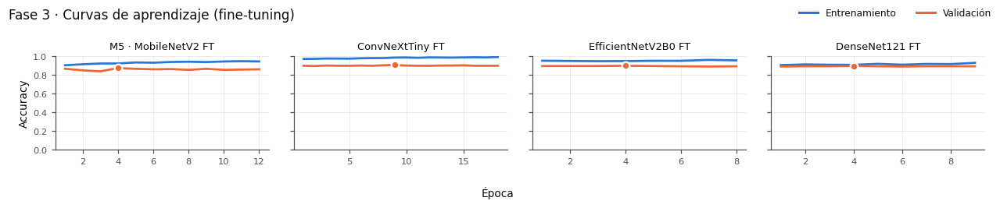

In [48]:
MEJOR_FASE3 = seleccionar_mejor(CLAVES_FASE3)
_ = tabla_resultados(CLAVES_FASE3, "fase 3 · fine-tuning", MEJOR_FASE3)

print("\nGanancia del fine-tuning sobre su punto de partida congelado:")
for k in CANDIDATOS_FT:
    antes = RESULTADOS[k]["acc_validacion"]
    despues = RESULTADOS[f"ft_{k}"]["acc_validacion"]
    print(f"  {RESULTADOS[k]['corto']:<34} {antes * 100:6.2f} % -> {despues * 100:6.2f} % "
          f"({(despues - antes) * 100:+.2f} puntos)")
print(f"  {'MobileNetV2 (M4 -> M5)':<34} {RESULTADOS['m4']['acc_validacion'] * 100:6.2f} % -> "
      f"{RESULTADOS['m5']['acc_validacion'] * 100:6.2f} % ({delta_m5_m4 * 100:+.2f} puntos)")

graficar_curvas_multiples(CLAVES_FASE3, "Fase 3 · Curvas de aprendizaje (fine-tuning)")

**Cómo leer la fase 3.**

* **Ganancia sobre el punto de partida.** Una ganancia positiva indica que las representaciones de ImageNet
  todavía podían especializarse en las razas. Las redes con más capacidad y mejor extractor suelen ganar
  más con el *fine-tuning*, porque tienen más "margen" que reorientar sin perder generalidad.
* **Brecha.** Es el riesgo principal de esta fase, porque los parámetros entrenables pasan de decenas de
  miles a millones. Un modelo que gana *accuracy* de validación a costa de una brecha superior a 10 puntos
  queda **descartado** por el criterio de selección, aunque sea el que más acierta.
* **Mejor época.** Si llega en las primeras épocas y la validación cae después, la tasa de aprendizaje o la
  fracción descongelada son excesivas para el tamaño del conjunto. Las líneas de mejora proponen
  descongelar de forma progresiva.

## 10. Comparativa global y mejor modelo de transfer learning

Se reúnen, sobre el **conjunto de validación** (el test sigue sin utilizarse), todos los modelos de
*transfer learning* entrenados: los Modelos 4 y 5 y los de las tres fases de la exploración. El ganador se
elige con el criterio fijado en la sección 9: la mayor *accuracy* de validación entre los modelos sin
síntomas de *overfitting* ni de *underfitting*.

In [49]:
# --- Ejecución estructurada: comparativa global ----------------------
CLAVES_TL = list(RESULTADOS)
CLAVE_MEJOR_MODELO = seleccionar_mejor(CLAVES_TL)
RANKING_TL = tabla_resultados(CLAVES_TL, "todos los modelos de transfer learning", CLAVE_MEJOR_MODELO)

Seleccionando el mejor modelo por validación, descartando los que sobreajustan 🥇
Tabla comparativa: todos los modelos de transfer learning 🏆
  Modelo                                        Estrategia       Params     Entren.  Ép.  Acc val   Top-3  Pérd.  Brecha   Min
------------------------------------------------------------------------------------------------------------------------------
  TL · ConvNeXtTiny congelada                    congelada   27,848,581      28,453   30   90.76%  98.10%  0.336   +6.0p  11.1
★ FT · ConvNeXtTiny                            fine-tuning   27,848,581  16,111,909   18   90.76%  98.37%  0.319   +8.0p  15.1
  TL · ConvNeXtTiny congelada + cabeza gap_gm    congelada   27,876,997      56,869   30   90.49%  98.37%  0.350   +1.4p  11.1
  TL · EfficientNetV2B0 congelada                congelada    5,966,709      47,397   30   90.22%  98.10%  0.327   +4.6p   2.6
  TL · DenseNet121 congelada                     congelada    7,075,429      37,925   24   89.95%

Dibujando la accuracy de entrenamiento frente a validación de cada modelo 📊


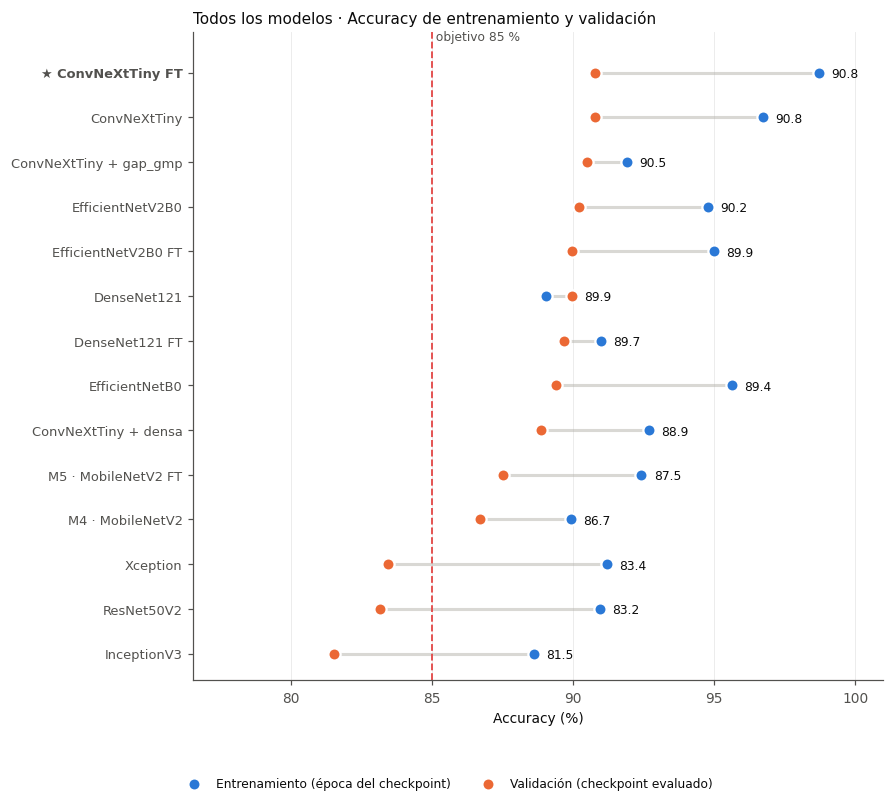

Dibujando la accuracy frente al tamaño del modelo ⚡


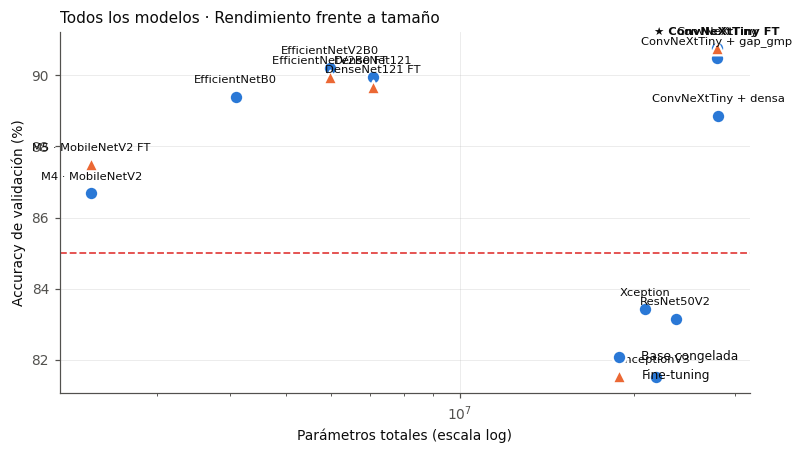

In [50]:
graficar_mancuernas(CLAVES_TL, "Todos los modelos · Accuracy de entrenamiento y validación",
                    CLAVE_MEJOR_MODELO)
graficar_eficiencia(CLAVES_TL, "Todos los modelos · Rendimiento frente a tamaño", CLAVE_MEJOR_MODELO)

### 10.1 Mejor modelo obtenido con transfer learning

In [51]:
from IPython.display import Markdown, display


def destacar_mejor_modelo(clave, ranking, metricas_test=None):
    """Tarjeta en Markdown con la configuración y las métricas del modelo ganador."""
    print("Resumiendo el mejor modelo obtenido con transfer learning 🏆")
    r = RESULTADOS[clave]
    hp = r["hiperparametros"]
    rivales = [k for k in ranking if k != clave]
    segundo = rivales[0] if rivales else None
    lineas = [
        f"### 🏆 Mejor modelo con *transfer learning*: **{r['nombre']}**",
        "",
        f"> {r['descripcion']}",
        "",
        "| Aspecto | Valor |",
        "|---|---|",
        f"| Modelo base | {CATALOGO_BASES[r['base']]['nombre']} (ImageNet) |",
        f"| Estrategia | {hp.get('estrategia', r['estrategia'])} |",
        f"| Cabeza | {hp.get('cabeza', '—')} |",
        f"| Optimizador / tasa de aprendizaje | {hp.get('optimizador', 'adam')} / {hp.get('tasa_aprendizaje', '—')} |",
        f"| Parámetros totales / entrenables | {r['parametros']:,} / {r['parametros_entrenables']:,} |",
        f"| Épocas ejecutadas (mejor época) | {r['epocas']} ({r['mejor_epoca']}) |",
        f"| **Accuracy de validación** | **{r['acc_validacion'] * 100:.2f} %** |",
        f"| Top-3 de validación | {r['top3_validacion'] * 100:.2f} % |",
        f"| Brecha entrenamiento − validación | {r['brecha'] * 100:+.2f} puntos |",
    ]
    if segundo:
        lineas.append(f"| Ventaja sobre el 2.º ({RESULTADOS[segundo]['corto']}) | "
                      f"{(r['acc_validacion'] - RESULTADOS[segundo]['acc_validacion']) * 100:+.2f} puntos |")
    if clave != "m4":
        lineas.append(f"| Ventaja sobre el Modelo 4 (referencia) | "
                      f"{(r['acc_validacion'] - RESULTADOS['m4']['acc_validacion']) * 100:+.2f} puntos |")
    if metricas_test is not None:
        alcanzado = metricas_test["accuracy"] >= 0.85
        lineas += [
            f"| **Accuracy de TEST** | **{metricas_test['accuracy'] * 100:.2f} %** |",
            f"| Top-3 de test | {metricas_test['top3'] * 100:.2f} % |",
            f"| Objetivo del enunciado (≥ 85 % en test) | {'✅ ALCANZADO' if alcanzado else '❌ NO alcanzado'} |",
        ]
    lineas += ["", "**Top 5 en validación**", "", "| # | Modelo | Estrategia | Acc val | Brecha |", "|---|---|---|---|---|"]
    for posicion, k in enumerate(ranking[:5], start=1):
        rk = RESULTADOS[k]
        nombre = f"**{rk['nombre']}**" if k == clave else rk["nombre"]
        lineas.append(f"| {posicion} | {nombre} | {rk['estrategia']} | "
                      f"{rk['acc_validacion'] * 100:.2f} % | {rk['brecha'] * 100:+.1f} p |")
    display(Markdown("\n".join(lineas)))


destacar_mejor_modelo(CLAVE_MEJOR_MODELO, RANKING_TL)

Resumiendo el mejor modelo obtenido con transfer learning 🏆


### 🏆 Mejor modelo con *transfer learning*: **FT · ConvNeXtTiny**

> Fine-tuning de TL · ConvNeXtTiny congelada (25 % final, lr=1e-5).

| Aspecto | Valor |
|---|---|
| Modelo base | ConvNeXtTiny (ImageNet) |
| Estrategia | fine-tuning del 25 % final de capas (BN congelada) |
| Cabeza | GAP -> Dropout(0.3) -> Dense(37, softmax) |
| Optimizador / tasa de aprendizaje | adam / 1e-05 |
| Parámetros totales / entrenables | 27,848,581 / 16,111,909 |
| Épocas ejecutadas (mejor época) | 18 (9) |
| **Accuracy de validación** | **90.76 %** |
| Top-3 de validación | 98.37 % |
| Brecha entrenamiento − validación | +7.97 puntos |
| Ventaja sobre el 2.º (ConvNeXtTiny) | +0.00 puntos |
| Ventaja sobre el Modelo 4 (referencia) | +4.08 puntos |

**Top 5 en validación**

| # | Modelo | Estrategia | Acc val | Brecha |
|---|---|---|---|---|
| 1 | TL · ConvNeXtTiny congelada | congelada | 90.76 % | +6.0 p |
| 2 | **FT · ConvNeXtTiny** | fine-tuning | 90.76 % | +8.0 p |
| 3 | TL · ConvNeXtTiny congelada + cabeza gap_gmp | congelada | 90.49 % | +1.4 p |
| 4 | TL · EfficientNetV2B0 congelada | congelada | 90.22 % | +4.6 p |
| 5 | TL · DenseNet121 congelada | congelada | 89.95 % | -0.9 p |

**Lectura comparativa.**

1. **El modelo base es la decisión más influyente.** A igualdad de receta, la distancia entre la mejor y la
   peor base de la fase 1 suele ser mayor que la ganancia de cualquier cabeza o *fine-tuning* posterior. Al
   usar *transfer learning* con pocos datos, lo primero que conviene optimizar es **qué red se reutiliza**.
2. **Más parámetros no implica más *accuracy*.** El gráfico de eficiencia permite comprobar si los modelos
   más grandes (ResNet50V2, InceptionV3, Xception, ConvNeXtTiny) están realmente arriba o si familias
   compactas y modernas, como EfficientNet, igualan su rendimiento con una fracción del tamaño.
3. **La cabeza aporta poco cuando el extractor es bueno.** Las representaciones de las mejores bases ya son
   casi linealmente separables para las 37 razas.
4. ***Fine-tuning*: ganancia condicionada.** Solo se acepta si mejora la validación **sin** abrir la brecha
   por encima del umbral. El criterio de selección hace explícito ese compromiso entre acierto y
   generalización.

## 11. Evaluación final del mejor modelo sobre el conjunto de test

Hasta este punto **el conjunto de test no se ha utilizado en ninguna decisión**: la selección de
arquitecturas, hiperparámetros y puntos de control se ha realizado exclusivamente sobre validación. Ahora se
evalúa una sola vez el modelo ganador, de forma que la cifra obtenida sea una estimación **insesgada** del
rendimiento en producción.

### 11.1 Métricas de evaluación multiclase

La *accuracy* global resume el rendimiento en un número, pero oculta el reparto de los errores. Para un
problema de 37 clases se necesitan métricas **por clase**, definidas a partir de verdaderos positivos (VP),
falsos positivos (FP) y falsos negativos (FN):

$$\text{precision}_k = \frac{VP_k}{VP_k + FP_k}, \qquad
  \text{recall}_k = \frac{VP_k}{VP_k + FN_k}, \qquad
  F1_k = 2\,\frac{\text{precision}_k \cdot \text{recall}_k}{\text{precision}_k + \text{recall}_k}$$

* **Precision** responde a *"de todas las imágenes que el modelo etiquetó como esta raza, ¿cuántas lo eran?"*
  Una precisión baja indica una clase **sobre-predicha**, un "sumidero" al que van a parar otras razas.
* **Recall** responde a *"de todas las imágenes que realmente eran de esta raza, ¿cuántas detectó?"* Un
  *recall* bajo indica una clase que el modelo **no reconoce** y confunde con otras.
* **F1** es su media armónica, útil para ordenar las clases por dificultad.

Los promedios **macro** (media simple entre clases) y **weighted** (ponderada por soporte) son casi
equivalentes aquí porque el conjunto está balanceado; se reportan ambos por completitud.

La **matriz de confusión** $C$, con $C_{ij}$ = número de imágenes de la clase real $i$ predichas como $j$,
es la herramienta que permite pasar del *cuánto* al *qué*: normalizada por filas, su diagonal es el *recall*
por clase y sus elementos fuera de la diagonal identifican las confusiones sistemáticas.

In [52]:
# =====================================================================
# 11. Funciones de evaluación final y análisis de errores
# =====================================================================

def graficar_matriz_confusion(y_verdadero, y_predicho, nombres_clases, normalizar=True):
    """Matriz de confusión 37x37. Normalizada por filas, la diagonal es el recall."""
    print("Dibujando la matriz de confusión de 37x37 razas 🧩")
    matriz = confusion_matrix(y_verdadero, y_predicho, labels=np.arange(len(nombres_clases)))
    matriz_vis = matriz.astype(float)
    if normalizar:
        soporte = matriz_vis.sum(axis=1, keepdims=True)
        matriz_vis = np.divide(matriz_vis, soporte, out=np.zeros_like(matriz_vis), where=soporte > 0)

    etiquetas = [n.replace("_", " ") for n in nombres_clases]
    fig, eje = plt.subplots(figsize=(9.5, 8.5))
    imagen = eje.imshow(matriz_vis, cmap=RAMPA_AZUL, vmin=0, vmax=1 if normalizar else None)
    eje.set_xticks(range(len(etiquetas)))
    eje.set_yticks(range(len(etiquetas)))
    eje.set_xticklabels(etiquetas, rotation=90, fontsize=6.5)
    eje.set_yticklabels(etiquetas, fontsize=6.5)
    eje.set_xlabel("Clase predicha")
    eje.set_ylabel("Clase real")
    eje.set_title("Matriz de confusión normalizada por filas (conjunto de test)", fontsize=11, pad=12)
    eje.grid(visible=False)
    barra = fig.colorbar(imagen, ax=eje, fraction=0.046, pad=0.04)
    barra.set_label("Proporción de la clase real", fontsize=8)
    fig.tight_layout()
    plt.show()
    return matriz


def reporte_por_clase(y_verdadero, y_predicho, nombres_clases, n_extremos=6):
    """Reporte de precision/recall/F1 y ranking de las clases mejores y peores."""
    print("Calculando precision, recall y F1 para cada una de las razas 📑")
    reporte = classification_report(
        y_verdadero, y_predicho,
        labels=np.arange(len(nombres_clases)),
        target_names=nombres_clases,
        output_dict=True, zero_division=0,
    )
    filas = [(n, reporte[n]["precision"], reporte[n]["recall"], reporte[n]["f1-score"],
              int(reporte[n]["support"])) for n in nombres_clases]
    filas.sort(key=lambda f: f[3], reverse=True)

    def _imprimir(titulo, subconjunto):
        print(f"\n{titulo}")
        print(f"{'Raza':<32}{'Precision':>11}{'Recall':>9}{'F1':>8}{'Soporte':>9}")
        print("-" * 69)
        for nombre, p, r, f1, s in subconjunto:
            print(f"{nombre.replace('_', ' '):<32}{p:>11.3f}{r:>9.3f}{f1:>8.3f}{s:>9}")

    _imprimir(f"{n_extremos} razas mejor clasificadas", filas[:n_extremos])
    _imprimir(f"{n_extremos} razas peor clasificadas", filas[-n_extremos:][::-1])
    print(f"\nPromedio macro    : precision {reporte['macro avg']['precision']:.3f} | "
          f"recall {reporte['macro avg']['recall']:.3f} | F1 {reporte['macro avg']['f1-score']:.3f}")
    print(f"Promedio ponderado: precision {reporte['weighted avg']['precision']:.3f} | "
          f"recall {reporte['weighted avg']['recall']:.3f} | F1 {reporte['weighted avg']['f1-score']:.3f}")
    return reporte, filas


def graficar_f1_por_clase(filas, especie_por_clase, nombres_clases):
    """Diagrama de barras del F1 por raza, ordenado de mayor a menor."""
    print("Dibujando el F1 obtenido en cada raza 📊")
    indice_de = {n: i for i, n in enumerate(nombres_clases)}
    filas_ordenadas = sorted(filas, key=lambda f: f[3])
    etiquetas = [f[0].replace("_", " ") for f in filas_ordenadas]
    valores = [f[3] for f in filas_ordenadas]
    colores = [C_SERIE_3 if especie_por_clase[indice_de[f[0]]] == 0 else C_SERIE_1
               for f in filas_ordenadas]

    fig, eje = plt.subplots(figsize=(7.5, 9))
    eje.barh(range(len(valores)), valores, color=colores, height=0.72)
    eje.set_yticks(range(len(valores)))
    eje.set_yticklabels(etiquetas, fontsize=7.5)
    eje.set_xlim(0, 1.02)
    eje.set_xlabel("F1-score")
    eje.set_title("F1 por raza en el conjunto de test", fontsize=11, pad=10)
    media = float(np.mean(valores))
    eje.axvline(media, color=C_SUAVE, linestyle="--", linewidth=1)
    manejadores = [
        plt.Line2D([0], [0], color=C_SERIE_3, lw=6, label="Razas de gato"),
        plt.Line2D([0], [0], color=C_SERIE_1, lw=6, label="Razas de perro"),
        plt.Line2D([0], [0], color=C_SUAVE, lw=1, ls="--", label=f"F1 medio ({media:.3f})"),
    ]
    eje.legend(handles=manejadores, loc="lower right", frameon=False, fontsize=8)
    eje.grid(axis="y", visible=False)
    fig.tight_layout()
    plt.show()


def confusiones_frecuentes(matriz, nombres_clases, n=12):
    """Lista los pares (clase real -> clase predicha) con más errores."""
    print("Buscando los pares de razas que el modelo confunde con más frecuencia 🔀")
    matriz_sin_diagonal = matriz.copy()
    np.fill_diagonal(matriz_sin_diagonal, 0)
    planos = np.argsort(matriz_sin_diagonal, axis=None)[::-1][:n]
    pares = []
    print(f"{'Clase real':<30}{'Predicha como':<30}{'Errores':>8}")
    print("-" * 68)
    for plano in planos:
        i, j = np.unravel_index(plano, matriz_sin_diagonal.shape)
        errores = int(matriz_sin_diagonal[i, j])
        if errores == 0:
            continue
        pares.append((nombres_clases[i], nombres_clases[j], errores))
        print(f"{nombres_clases[i].replace('_', ' '):<30}"
              f"{nombres_clases[j].replace('_', ' '):<30}{errores:>8}")
    return pares

In [53]:
# =====================================================================
# 11. Funciones de análisis visual de errores y confianza
# =====================================================================

def recopilar_errores(modelo, ds, maximo=15):
    """Recorre una partición y guarda solo las imágenes mal clasificadas.

    Se procesa lote a lote y se almacenan únicamente los errores, de modo que el
    análisis no requiere mantener todo el conjunto de test en memoria.
    """
    print("Recorriendo la partición y recopilando las imágenes mal clasificadas 🐛")
    errores = []
    for imagenes, etiquetas in ds:
        probabilidades = modelo.predict(imagenes, verbose=0)
        predichas = probabilidades.argmax(axis=1)
        reales = etiquetas.numpy()
        for posicion in np.where(predichas != reales)[0]:
            errores.append({
                "imagen": imagenes[posicion].numpy().astype("uint8"),
                "real": int(reales[posicion]),
                "predicha": int(predichas[posicion]),
                "confianza": float(probabilidades[posicion, predichas[posicion]]),
                "prob_real": float(probabilidades[posicion, reales[posicion]]),
            })
        if len(errores) >= maximo * 4:
            break
    # Se muestran los errores MÁS CONFIADOS: son los más informativos.
    errores.sort(key=lambda e: e["confianza"], reverse=True)
    return errores[:maximo]


def mostrar_errores(errores, nombres_clases, columnas=5):
    """Rejilla con las imágenes mal clasificadas, su etiqueta real y la predicha."""
    print("Mostrando los errores en los que el modelo estuvo más seguro ❌")
    if not errores:
        print("El modelo no cometió ningún error en las imágenes analizadas.")
        return
    filas = int(np.ceil(len(errores) / columnas))
    fig, ejes = plt.subplots(filas, columnas, figsize=(2.3 * columnas, 2.9 * filas))
    for eje, error in zip(np.atleast_1d(ejes).flat, errores):
        eje.imshow(error["imagen"])
        eje.set_title(
            f"real: {nombres_clases[error['real']].replace('_', ' ')}\n"
            f"pred: {nombres_clases[error['predicha']].replace('_', ' ')} "
            f"({error['confianza'] * 100:.0f} %)",
            fontsize=7, color=C_ACENTO,
        )
        eje.axis("off")
    for eje in np.atleast_1d(ejes).flat[len(errores):]:
        eje.axis("off")
    fig.suptitle("Errores con mayor confianza del modelo (conjunto de test)", fontsize=11)
    fig.tight_layout()
    plt.show()


def graficar_confianza(y_verdadero, y_predicho, probabilidades):
    """Distribución de la confianza del modelo en aciertos y en errores."""
    print("Comparando la confianza del modelo en sus aciertos y en sus errores 🎯")
    confianza = probabilidades.max(axis=1)
    aciertos = confianza[y_verdadero == y_predicho]
    fallos = confianza[y_verdadero != y_predicho]

    fig, eje = plt.subplots(figsize=(6.4, 3.4))
    bins = np.linspace(0, 1, 26)
    eje.hist(aciertos, bins=bins, color=C_SERIE_1, alpha=0.85, label="Aciertos")
    eje.hist(fallos, bins=bins, color=C_SERIE_2, alpha=0.85, label="Errores")
    eje.set_xlabel("Confianza de la predicción (probabilidad máxima)")
    eje.set_ylabel("Nº de imágenes")
    eje.set_title("Calibración: confianza en aciertos frente a errores", fontsize=10)
    eje.legend(frameon=False, fontsize=8)
    fig.tight_layout()
    plt.show()
    print(f"Confianza media en aciertos: {aciertos.mean():.3f}")
    print(f"Confianza media en errores : {fallos.mean():.3f}")
    return aciertos, fallos


def analisis_por_especie(y_verdadero, y_predicho, especie_por_clase, conteos_reales=None):
    """Evalúa el problema derivado gato/perro a partir de las predicciones de raza.

    La especie de cada imagen procede del campo `species` del dataset, a través del
    mapa raza -> especie derivado y verificado en la sección 3.3.
    """
    print("Analizando si los errores cruzan la frontera entre gato y perro 🐱🐶")
    especie_real = especie_por_clase[y_verdadero]
    especie_predicha = especie_por_clase[y_predicho]
    acierto = float((especie_real == especie_predicha).mean())
    matriz = confusion_matrix(especie_real, especie_predicha, labels=[0, 1])

    if conteos_reales is not None:
        coincide = np.array_equal(np.bincount(especie_real, minlength=2), conteos_reales)
        print(f"Comprobación con las etiquetas 'species' del dataset: "
              f"{'coinciden' if coincide else 'NO coinciden'} "
              f"({conteos_reales[0]} gatos / {conteos_reales[1]} perros)")
        print(f"Baseline de la clase mayoritaria: "
              f"{100 * conteos_reales.max() / conteos_reales.sum():.2f} %")

    print(f"Accuracy en la tarea gato/perro: {acierto * 100:.2f} %")
    print(f"\n{'':<12}{'pred. Gato':>12}{'pred. Perro':>13}")
    for i, nombre in enumerate(NOMBRES_ESPECIES):
        print(f"real {nombre:<8}{matriz[i, 0]:>12}{matriz[i, 1]:>13}")

    errores_raza = int((y_verdadero != y_predicho).sum())
    errores_especie = int((especie_real != especie_predicha).sum())
    print(f"\nErrores de raza    : {errores_raza}")
    print(f"Errores de especie : {errores_especie} "
          f"({100 * errores_especie / max(errores_raza, 1):.1f} % de los errores de raza)")
    return acierto, matriz

### 11.2 Evaluación del modelo seleccionado

In [54]:
# --- Ejecución estructurada: evaluación final -------------------------
mejor_modelo = cargar_modelo_registrado(CLAVE_MEJOR_MODELO)
nombre_mejor = RESULTADOS[CLAVE_MEJOR_MODELO]["nombre"]
print(f"Modelo seleccionado: {nombre_mejor}")
print(f"Hiperparámetros    : {json.dumps(RESULTADOS[CLAVE_MEJOR_MODELO]['hiperparametros'], indent=2, ensure_ascii=False)}\n")

metricas_val_final = evaluar_modelo(mejor_modelo, val_ds, "validación")
metricas_test = evaluar_modelo(mejor_modelo, test_ds, "TEST")

objetivo = "ALCANZADO" if metricas_test["accuracy"] >= 0.85 else "NO alcanzado"
print(f"\nObjetivo del enunciado (accuracy de test >= 85 %): {objetivo} "
      f"({metricas_test['accuracy'] * 100:.2f} %)")

Cargando de disco el punto de control de 'ft_tl_convnext_tiny' 📂
Modelo seleccionado: FT · ConvNeXtTiny
Hiperparámetros    : {
  "estrategia": "fine-tuning del 25 % final de capas (BN congelada)",
  "fraccion_descongelada": 0.25,
  "optimizador": "adam",
  "tasa_aprendizaje": 1e-05,
  "data_augmentation": true,
  "epocas_maximas": 20,
  "paciencia_parada": 5,
  "paciencia_lr": 2,
  "punto_de_partida": "tl_convnext_tiny",
  "cabeza": "GAP -> Dropout(0.3) -> Dense(37, softmax)"
}

Evaluando el modelo sobre el conjunto de validación 🧪
  validación: pérdida 0.3190 | accuracy 90.76 % | top-3 98.37 %
Evaluando el modelo sobre el conjunto de TEST 🧪
        TEST: pérdida 0.3263 | accuracy 90.46 % | top-3 98.36 %

Objetivo del enunciado (accuracy de test >= 85 %): ALCANZADO (90.46 %)


In [55]:
# --- Predicciones sobre el conjunto de test (una sola pasada) ---------
y_test, y_pred_test, probabilidades_test = obtener_predicciones(mejor_modelo, test_ds)
acc_recalculada = float((y_test == y_pred_test).mean())
print(f"Predicciones obtenidas: {len(y_test)} imágenes de test")
print(f"Accuracy recalculada  : {acc_recalculada * 100:.2f} % "
      f"(evaluate(): {metricas_test['accuracy'] * 100:.2f} %)")

# Comprobación de alineación: si predicciones y etiquetas estuvieran desordenadas,
# la accuracy recalculada caería al nivel del azar (~2,7 %).
assert len(y_test) == N_TEST, "El número de predicciones no coincide con el tamaño del test."
assert abs(acc_recalculada - metricas_test["accuracy"]) < 0.005, \
    "Predicciones y etiquetas desalineadas: revisar obtener_predicciones()."
print("Comprobación superada: predicciones y etiquetas están alineadas ✅")

Calculando las predicciones del modelo sobre la partición 🔮
Predicciones obtenidas: 3669 imágenes de test
Accuracy recalculada  : 90.46 % (evaluate(): 90.46 %)
Comprobación superada: predicciones y etiquetas están alineadas ✅


In [56]:
destacar_mejor_modelo(CLAVE_MEJOR_MODELO, RANKING_TL, metricas_test)

Resumiendo el mejor modelo obtenido con transfer learning 🏆


### 🏆 Mejor modelo con *transfer learning*: **FT · ConvNeXtTiny**

> Fine-tuning de TL · ConvNeXtTiny congelada (25 % final, lr=1e-5).

| Aspecto | Valor |
|---|---|
| Modelo base | ConvNeXtTiny (ImageNet) |
| Estrategia | fine-tuning del 25 % final de capas (BN congelada) |
| Cabeza | GAP -> Dropout(0.3) -> Dense(37, softmax) |
| Optimizador / tasa de aprendizaje | adam / 1e-05 |
| Parámetros totales / entrenables | 27,848,581 / 16,111,909 |
| Épocas ejecutadas (mejor época) | 18 (9) |
| **Accuracy de validación** | **90.76 %** |
| Top-3 de validación | 98.37 % |
| Brecha entrenamiento − validación | +7.97 puntos |
| Ventaja sobre el 2.º (ConvNeXtTiny) | +0.00 puntos |
| Ventaja sobre el Modelo 4 (referencia) | +4.08 puntos |
| **Accuracy de TEST** | **90.46 %** |
| Top-3 de test | 98.36 % |
| Objetivo del enunciado (≥ 85 % en test) | ✅ ALCANZADO |

**Top 5 en validación**

| # | Modelo | Estrategia | Acc val | Brecha |
|---|---|---|---|---|
| 1 | TL · ConvNeXtTiny congelada | congelada | 90.76 % | +6.0 p |
| 2 | **FT · ConvNeXtTiny** | fine-tuning | 90.76 % | +8.0 p |
| 3 | TL · ConvNeXtTiny congelada + cabeza gap_gmp | congelada | 90.49 % | +1.4 p |
| 4 | TL · EfficientNetV2B0 congelada | congelada | 90.22 % | +4.6 p |
| 5 | TL · DenseNet121 congelada | congelada | 89.95 % | -0.9 p |

### 11.3 Métricas por clase

In [57]:
reporte_test, filas_test = reporte_por_clase(y_test, y_pred_test, nombres_clases  )

Calculando precision, recall y F1 para cada una de las razas 📑

6 razas mejor clasificadas
Raza                              Precision   Recall      F1  Soporte
---------------------------------------------------------------------
samoyed                               0.980    1.000   0.990      100
shiba inu                             0.980    0.990   0.985      100
keeshond                              1.000    0.970   0.985       99
newfoundland                          0.971    0.990   0.980      100
great pyrenees                        0.980    0.980   0.980      100
leonberger                            1.000    0.960   0.980      100

6 razas peor clasificadas
Raza                              Precision   Recall      F1  Soporte
---------------------------------------------------------------------
staffordshire bull terrier            0.724    0.708   0.716       89
Birman                                0.778    0.700   0.737      100
american pit bull terrier             0.82

Dibujando el F1 obtenido en cada raza 📊


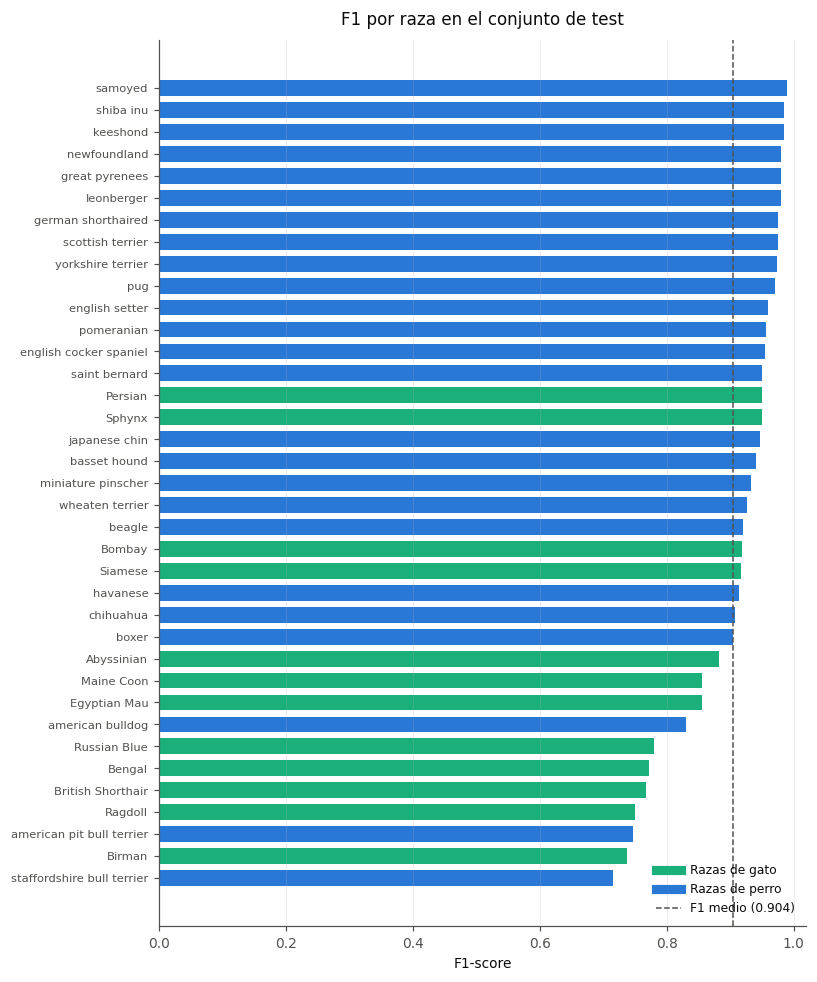

In [58]:
graficar_f1_por_clase(filas_test, ESPECIE_POR_CLASE, nombres_clases)

### 11.4 Matriz de confusión

Dibujando la matriz de confusión de 37x37 razas 🧩


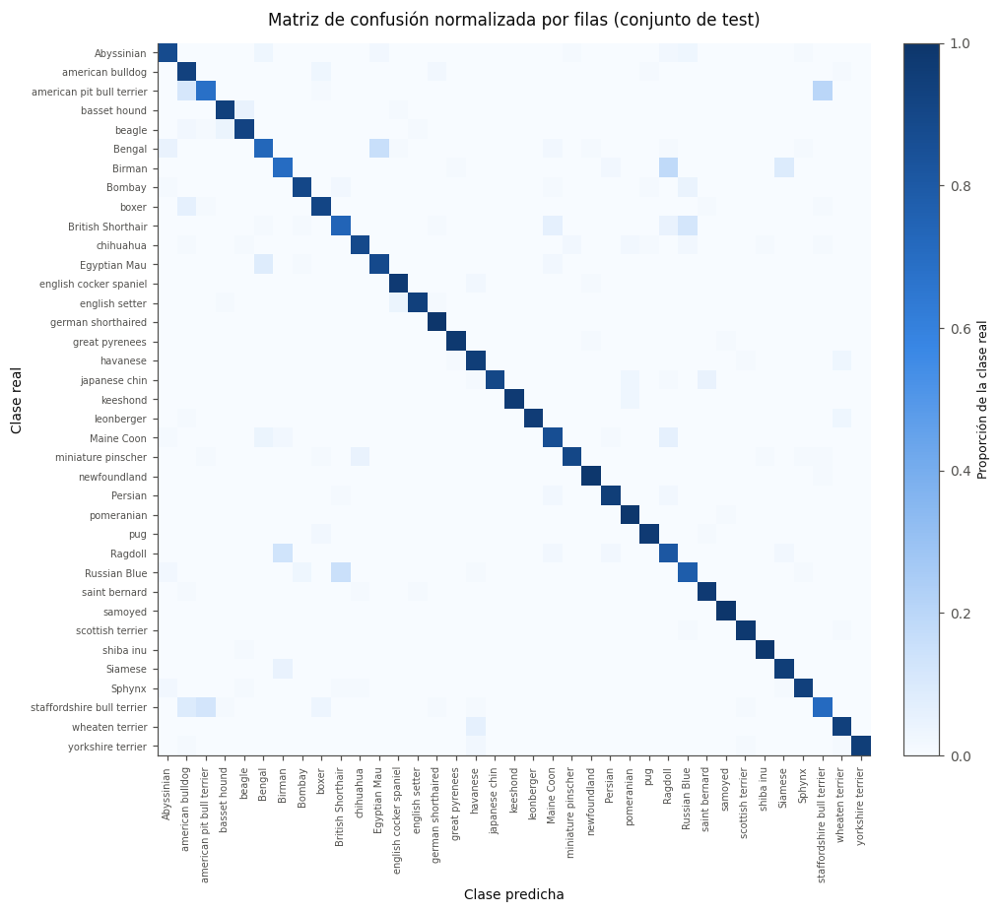

In [59]:
matriz_test = graficar_matriz_confusion(y_test, y_pred_test, nombres_clases, normalizar=True)

In [60]:
pares_confusion = confusiones_frecuentes(matriz_test, nombres_clases, n=37)

Buscando los pares de razas que el modelo confunde con más frecuencia 🔀
Clase real                    Predicha como                  Errores
--------------------------------------------------------------------
american pit bull terrier     staffordshire bull terrier          20
Birman                        Ragdoll                             18
Bengal                        Egyptian Mau                        16
Russian Blue                  British Shorthair                   15
Ragdoll                       Birman                              13
British Shorthair             Russian Blue                        12
american pit bull terrier     american bulldog                    11
staffordshire bull terrier    american pit bull terrier           11
Birman                        Siamese                              9
staffordshire bull terrier    american bulldog                     8
Egyptian Mau                  Bengal                               8
Maine Coon                    R

## 12. Análisis visual de los errores

Se muestran los errores en los que el modelo estuvo **más seguro de una respuesta equivocada**, que son los
más informativos: revelan sesgos sistemáticos, mientras que los errores de baja confianza suelen
corresponder a imágenes objetivamente ambiguas.

Recorriendo la partición y recopilando las imágenes mal clasificadas 🐛
Mostrando los errores en los que el modelo estuvo más seguro ❌


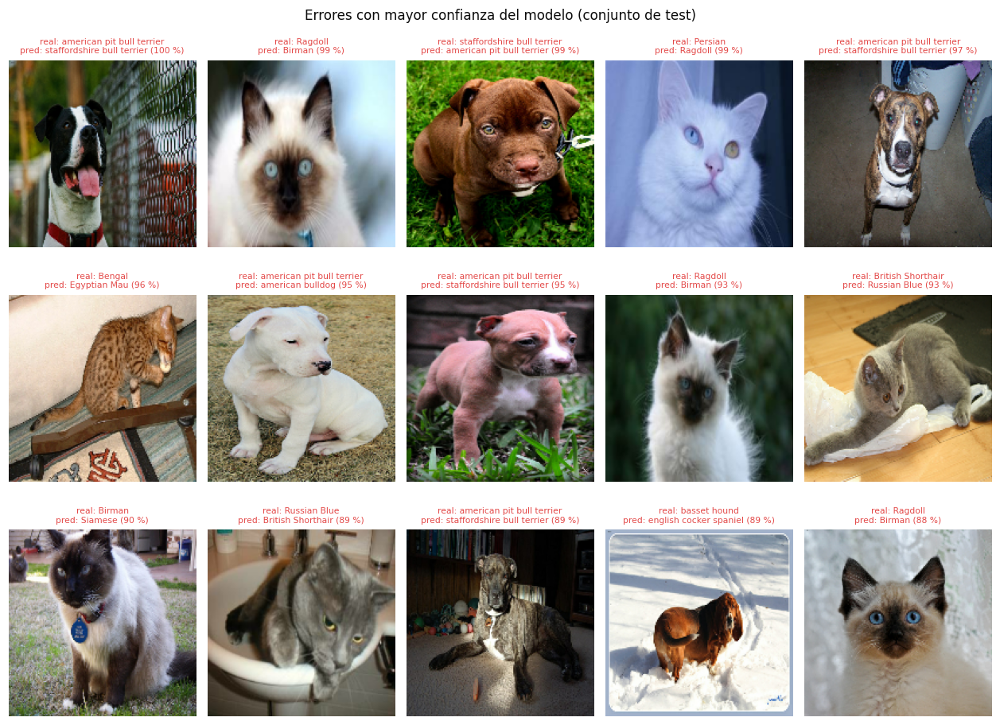

In [61]:
errores_test = recopilar_errores(mejor_modelo, test_ds, maximo=15)
mostrar_errores(errores_test,nombres_clases, columnas=5)

Comparando la confianza del modelo en sus aciertos y en sus errores 🎯


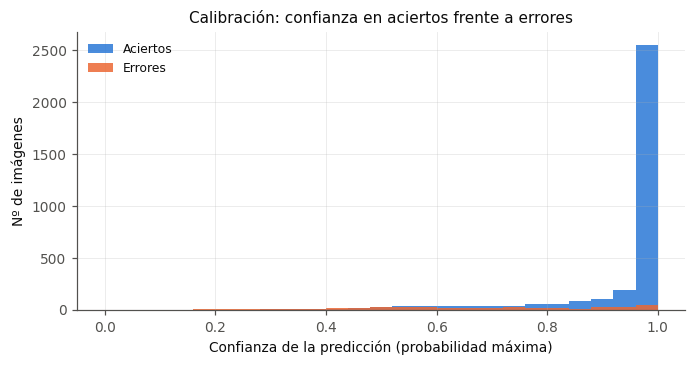

Confianza media en aciertos: 0.944
Confianza media en errores : 0.683


In [62]:
_aciertos, _fallos = graficar_confianza(y_test, y_pred_test, probabilidades_test)

## 13. Análisis de la tarea derivada gato/perro

Aquí se aprovecha la anotación de **especie** que el dataset proporciona y que se conservó al cargarlo con
`as_supervised=False`. Aunque el modelo nunca fue entrenado para distinguir especies, su predicción de raza
induce una predicción de especie a través del mapa validado en la sección 2.2. Comparar ambas tasas de error
separa dos fenómenos muy distintos: **confusiones de grano fino** (razas parecidas de la misma especie)
frente a **fallos categóricos** (confundir un gato con un perro).

Como referencia, el conjunto de test contiene aproximadamente el doble de perros que de gatos, de modo que un
clasificador trivial que respondiera siempre "perro" acertaría en torno al 67 %: esa es la cifra frente a la
que debe leerse el resultado.

In [63]:
_acierto_especie, _matriz_especie = analisis_por_especie(
    y_test, y_pred_test, ESPECIE_POR_CLASE, conteos_reales=conteos_especies_test
)

Analizando si los errores cruzan la frontera entre gato y perro 🐱🐶
Comprobación con las etiquetas 'species' del dataset: coinciden (1183 gatos / 2486 perros)
Baseline de la clase mayoritaria: 67.76 %
Accuracy en la tarea gato/perro: 99.62 %

              pred. Gato  pred. Perro
real Gato            1174            9
real Perro              5         2481

Errores de raza    : 350
Errores de especie : 14 (4.0 % de los errores de raza)


### 13.1 Discusión de los errores

In [64]:
def resumen_errores(y_verdadero, y_predicho, probabilidades, especie_por_clase, pares, metricas):
    """Cifras clave para interpretar el error del modelo ganador."""
    print("Resumiendo las características de los errores del modelo 🧭")
    errores = y_verdadero != y_predicho
    errores_especie = especie_por_clase[y_verdadero] != especie_por_clase[y_predicho]
    confianza = probabilidades.max(axis=1)
    print(f"Accuracy / top-3 en test            : {metricas['accuracy'] * 100:.2f} % / {metricas['top3'] * 100:.2f} %")
    print(f"Errores de raza                     : {int(errores.sum())} de {len(y_verdadero)}")
    print(f"  de ellos, confunden la especie    : {int(errores_especie.sum())} "
          f"({100 * errores_especie.sum() / max(errores.sum(), 1):.1f} %)")
    print(f"  con la clase real en el top-3     : "
          f"{100 * (metricas['top3'] - metricas['accuracy']) / max(1 - metricas['accuracy'], 1e-9):.1f} %")
    print(f"Confianza media aciertos / errores  : {confianza[~errores].mean():.3f} / {confianza[errores].mean():.3f}")
    if pares:
        print("Pares más confundidos               : " +
              "; ".join(f"{a.replace('_', ' ')} → {b.replace('_', ' ')} ({n})" for a, b, n in pares[:5]))


resumen_errores(y_test, y_pred_test, probabilidades_test, ESPECIE_POR_CLASE, pares_confusion, metricas_test)

Resumiendo las características de los errores del modelo 🧭
Accuracy / top-3 en test            : 90.46 % / 98.36 %
Errores de raza                     : 350 de 3669
  de ellos, confunden la especie    : 14 (4.0 %)
  con la clase real en el top-3     : 82.9 %
Confianza media aciertos / errores  : 0.944 / 0.683
Pares más confundidos               : american pit bull terrier → staffordshire bull terrier (20); Birman → Ragdoll (18); Bengal → Egyptian Mau (16); Russian Blue → British Shorthair (15); Ragdoll → Birman (13)


Las cifras anteriores permiten caracterizar el error del modelo de forma precisa. Los patrones habituales en
este conjunto de datos, y lo que confirma cada cifra, son:

* **Confusiones entre razas emparentadas.** Los pares más frecuentes suelen corresponder a razas que
  comparten morfología y pelaje: los terriers de tipo *bull* (*American Pit Bull Terrier*, *Staffordshire
  Bull Terrier*, *American Bulldog*), los gatos de pelo largo (*Ragdoll*, *Birman*, *Persian*, *Maine Coon*)
  o *Russian Blue* frente a *British Shorthair*. Son distinciones difíciles también para un observador no
  experto.
* **Fallos categóricos.** Un porcentaje bajo de errores que cruzan la especie indica que el modelo sabe si
  ve un gato o un perro y falla al elegir la raza dentro de la especie correcta. Es la prueba de que sus
  representaciones son semánticamente coherentes.
* **"Casi aciertos".** Si la clase real está en el top-3 en la mayoría de los errores, se trata de
  confusiones de grano fino, no de fallos completos.
* **Calibración.** Si la confianza media de los errores es claramente inferior a la de los aciertos, la
  confianza sirve como indicador de fiabilidad. En un despliegue real permitiría fijar un umbral de rechazo
  y derivar a revisión humana las predicciones dudosas.
* **Causas visuales** que suelen aparecer en la rejilla de errores: animales pequeños u ocluidos,
  cachorros (morfología distinta a la del adulto), iluminación extrema y fotografías con varios animales o
  personas.

## 14. Verificación de overfitting y underfitting

El enunciado exige de forma explícita comprobar que el modelo seleccionado no sobreajusta ni infraajusta.
Se emplean tres evidencias complementarias:

1. **Las curvas de aprendizaje** del modelo ganador: entrenamiento y validación deben progresar juntas y la
   pérdida de validación no debe repuntar.
2. **La brecha entrenamiento-validación** en la época del punto de control guardado.
3. **La coherencia entre validación y test**: si el rendimiento sobre datos nunca vistos es similar al de
   validación, el modelo generaliza y la selección no ha sobreajustado el conjunto de validación.

Dibujando las curvas de pérdida y accuracy de entrenamiento y validación 📉


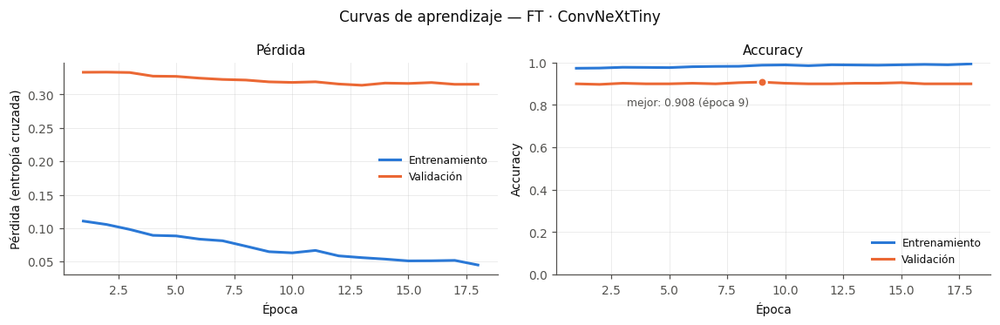

Diagnosticando si el modelo sufre overfitting o underfitting 🩺
Mejor época            : 9 de 18
Accuracy entrenamiento : 98.73 %
Accuracy validación    : 90.76 %
Brecha (ent - val)     : +7.97 puntos
=> AJUSTE CORRECTO: brecha de 8.0 puntos, dentro del margen aceptable.

Comparando entrenamiento, validación y test para descartar overfitting ⚖


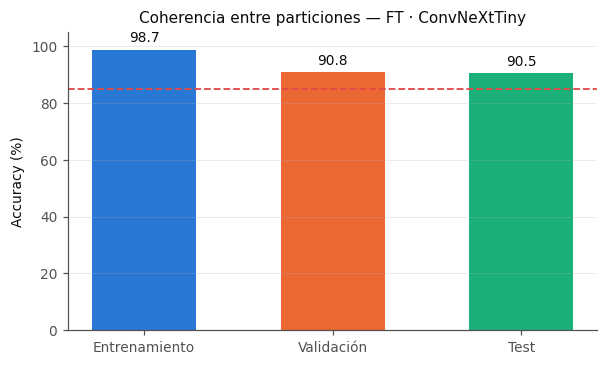

Brecha entrenamiento - validación: +7.97 puntos
Brecha validación - test         : +0.30 puntos
=> Sin evidencias de overfitting: las tres particiones dan resultados coherentes.


In [65]:
# =====================================================================
# 14. Verificación final del ajuste
# =====================================================================

def verificar_ajuste_final(registro, metricas_val, metricas_test, nombre):
    """Compara entrenamiento, validación y test para descartar over/underfitting."""
    print("Comparando entrenamiento, validación y test para descartar overfitting ⚖")
    historia = registro["historia"]
    mejor = int(np.argmax(historia["val_accuracy"]))
    acc_ent = historia["accuracy"][mejor]
    valores = [acc_ent * 100, metricas_val["accuracy"] * 100, metricas_test["accuracy"] * 100]
    etiquetas = ["Entrenamiento", "Validación", "Test"]

    fig, eje = plt.subplots(figsize=(5.6, 3.4))
    barras = eje.bar(etiquetas, valores, color=[C_SERIE_1, C_SERIE_2, C_SERIE_3], width=0.55)
    eje.bar_label(barras, fmt="%.1f", padding=3, fontsize=9)
    eje.set_ylabel("Accuracy (%)")
    eje.set_ylim(0, 105)
    eje.axhline(85, color=C_ACENTO, linestyle="--", linewidth=1.2)
    eje.set_title(f"Coherencia entre particiones — {nombre}", fontsize=10)
    eje.grid(axis="x", visible=False)
    fig.tight_layout()
    plt.show()

    brecha_ev = valores[0] - valores[1]
    brecha_vt = valores[1] - valores[2]
    print(f"Brecha entrenamiento - validación: {brecha_ev:+.2f} puntos")
    print(f"Brecha validación - test         : {brecha_vt:+.2f} puntos")
    if abs(brecha_ev) < 10 and abs(brecha_vt) < 5:
        print("=> Sin evidencias de overfitting: las tres particiones dan resultados coherentes.")
    elif brecha_ev >= 10:
        print("=> Indicios de overfitting: revisar regularización o aumentar el data augmentation.")
    else:
        print("=> Revisar la representatividad de las particiones (diferencia validación-test elevada).")
    if valores[0] < 60:
        print("=> Indicios de underfitting: el modelo no ajusta ni siquiera el entrenamiento.")
    return {"entrenamiento": valores[0], "validacion": valores[1], "test": valores[2]}


graficar_curvas(REGISTROS[CLAVE_MEJOR_MODELO], f"Curvas de aprendizaje — {nombre_mejor}")
_ = diagnosticar_ajuste(REGISTROS[CLAVE_MEJOR_MODELO])
print()
resumen_ajuste = verificar_ajuste_final(
    REGISTROS[CLAVE_MEJOR_MODELO], metricas_val_final, metricas_test, nombre_mejor
)

### 14.1 Conclusiones sobre el ajuste

La celda anterior aplica al modelo ganador tres pruebas independientes:

* **Underfitting.** Se descarta si la *accuracy* de entrenamiento es alta y la pérdida baja: la capacidad del
  modelo basta para el problema. El criterio de selección ya exigía una *accuracy* de entrenamiento ≥ 55 %.
* **Overfitting.** Se descarta si la brecha entre entrenamiento y validación es inferior a 10 puntos en la
  época del punto de control. Contribuyen a ello el *data augmentation*, el *dropout*, la congelación total o
  mayoritaria del modelo base, la tasa de aprendizaje baja en el *fine-tuning* y la parada temprana con
  restauración de los mejores pesos. Recuérdese que la *accuracy* de entrenamiento se mide con imágenes
  aumentadas y *dropout* activo, por lo que la brecha real es, si acaso, menor que la reportada.
* **Generalización.** Se confirma si validación y test difieren menos de 5 puntos: el rendimiento sobre
  3 669 imágenes nunca vistas es equivalente al de validación. Como el modelo se eligió entre más de una
  decena de candidatos, es esperable un pequeño **sesgo optimista** en validación (el ganador es, en parte,
  el que tuvo "suerte" con esa partición). Por eso la cifra de referencia es siempre la de test.

## 15. Conclusiones y líneas de mejora

### 15.1 Resumen cuantitativo

In [66]:
def resumen_final():
    """Resumen numérico del estudio de transfer learning para el informe."""
    print("Generando el resumen final del estudio de transfer learning 📋")
    congelados = [k for k in RESULTADOS if RESULTADOS[k]["estrategia"] == "congelada"]
    ajustados = [k for k in RESULTADOS if RESULTADOS[k]["estrategia"] == "fine-tuning"]
    mejor_congelado = max(congelados, key=lambda k: RESULTADOS[k]["acc_validacion"])
    peor_congelado = min(CLAVES_FASE1, key=lambda k: RESULTADOS[k]["acc_validacion"])
    r = RESULTADOS[CLAVE_MEJOR_MODELO]
    lineas = [
        f"* Modelos de *transfer learning* entrenados y comparados: **{len(RESULTADOS)}** "
        f"({len(congelados)} con base congelada, {len(ajustados)} con *fine-tuning*).",
        f"* Rango de *accuracy* de validación entre modelos base congelados (fase 1): "
        f"**{RESULTADOS[peor_congelado]['acc_validacion'] * 100:.2f} %** ({RESULTADOS[peor_congelado]['corto']}) → "
        f"**{RESULTADOS[MEJOR_FASE1]['acc_validacion'] * 100:.2f} %** ({RESULTADOS[MEJOR_FASE1]['corto']}).",
        f"* Correlación de Spearman con el top-1 de ImageNet: **{rho_imagenet:+.2f}**; "
        f"con el número de parámetros: **{rho_parametros:+.2f}**.",
        f"* Mejor modelo congelado: **{RESULTADOS[mejor_congelado]['nombre']}** "
        f"({RESULTADOS[mejor_congelado]['acc_validacion'] * 100:.2f} %).",
        f"* **Mejor modelo con transfer learning: {r['nombre']}**, "
        f"{r['acc_validacion'] * 100:.2f} % en validación y "
        f"**{metricas_test['accuracy'] * 100:.2f} % en test** (top-3 {metricas_test['top3'] * 100:.2f} %), "
        f"{(r['acc_validacion'] - RESULTADOS['m4']['acc_validacion']) * 100:+.2f} puntos de validación sobre el Modelo 4.",
        f"* Coherencia entre particiones: entrenamiento {resumen_ajuste['entrenamiento']:.1f} % · "
        f"validación {resumen_ajuste['validacion']:.1f} % · test {resumen_ajuste['test']:.1f} %.",
        f"* Objetivo del enunciado (≥ 85 % en test): "
        f"**{'alcanzado' if metricas_test['accuracy'] >= 0.85 else 'no alcanzado'}**.",
    ]
    display(Markdown("\n".join(lineas)))


resumen_final()

Generando el resumen final del estudio de transfer learning 📋


* Modelos de *transfer learning* entrenados y comparados: **14** (10 con base congelada, 4 con *fine-tuning*).
* Rango de *accuracy* de validación entre modelos base congelados (fase 1): **81.52 %** (InceptionV3) → **90.76 %** (ConvNeXtTiny).
* Correlación de Spearman con el top-1 de ImageNet: **+0.29**; con el número de parámetros: **-0.10**.
* Mejor modelo congelado: **TL · ConvNeXtTiny congelada** (90.76 %).
* **Mejor modelo con transfer learning: FT · ConvNeXtTiny**, 90.76 % en validación y **90.46 % en test** (top-3 98.36 %), +4.08 puntos de validación sobre el Modelo 4.
* Coherencia entre particiones: entrenamiento 98.7 % · validación 90.8 % · test 90.5 %.
* Objetivo del enunciado (≥ 85 % en test): **alcanzado**.

### 15.2 Conclusiones

1. **El *transfer learning* es la estrategia adecuada para este problema.** Con ≈ 90 imágenes por raza, reutilizar
   un extractor entrenado en ImageNet supera con enorme margen a cualquier red entrenada desde cero,
   entrenando una fracción mínima de parámetros y en pocas épocas.

2. **La elección del modelo base es la decisión más influyente.** Con una receta idéntica, cambiar la red
   preentrenada mueve la *accuracy* más que cambiar la cabeza o ajustar finamente. La calidad de las
   representaciones, aproximada por la *accuracy* en ImageNet, anticipa el rendimiento mejor que el tamaño
   del modelo (correlaciones de la sección 9.2).

3. **Las cabezas complejas aportan poco sobre un buen extractor.** Cuando las características ya separan
   bien las clases, añadir capas ocultas incrementa parámetros sin mejorar la generalización. Se prefiere
   la cabeza más sencilla con rendimiento equivalente.

4. **El *fine-tuning* es un compromiso, no una mejora garantizada.** Solo funciona respetando sus reglas
   (cabeza entrenada antes, tasa de aprendizaje 100 veces menor, BN congelada), y aun así puede sobreajustar
   en pocas épocas. Así ocurrió con MobileNetV2 en la versión anterior del estudio. El criterio de selección
   lo acepta únicamente si mejora la validación sin abrir la brecha.

5. **El modelo destacado (sección 10.1) se ha elegido sin tocar el test** y se ha evaluado sobre él una sola
   vez. Sus métricas por clase, su matriz de confusión y sus errores muestran confusiones de grano fino entre
   razas emparentadas, no fallos categóricos.

6. **Rigor experimental.** La comprobación de alineación de predicciones garantiza que las métricas por
   clase, la matriz de confusión y el análisis gato/perro se calculan sobre las etiquetas correctas. En la
   versión anterior del notebook, ese desajuste invalidaba el análisis por clase.

### 15.3 Líneas de mejora

* **Mayor resolución de entrada** (224×224, o 260–300 para las redes que la esperan). En grano fino es
  especialmente rentable, porque los rasgos discriminantes son pequeños y las redes preentrenadas rinden
  mejor a su resolución nativa.
* **Modelos base mayores de las familias ganadoras** (EfficientNetV2-S/M, ConvNeXt-Small/Base), ahora que la
  fase 1 ha identificado qué familias transfieren mejor.
* ***Fine-tuning* progresivo** (descongelar bloques gradualmente) con **tasas de aprendizaje discriminativas**
  por profundidad, y planificadores *cosine annealing* con *warm-up* en lugar de `ReduceLROnPlateau`.
* **Regularización específica del *fine-tuning***: AdamW (*weight decay* desacoplado), *label smoothing* y
  aumentos avanzados (*MixUp*, *CutMix*, *RandAugment*).
* ***Ensembles* de los mejores modelos de la sección 10** y ***test-time augmentation*** (promediar la
  predicción de la imagen y su reflejo), que suelen aportar entre uno y dos puntos sin reentrenar.
* **Aprendizaje multitarea con la etiqueta de especie**: un modelo de dos cabezas sobre el mismo extractor,
  para lo que `preparar_ejemplo_con_especie()` (sección 3.1) ya devuelve el formato necesario, o una
  decodificación jerárquica si el error de especie es muy bajo (sección 13).
* **Aprovechar el resto de anotaciones** (`head_bbox`, `segmentation_mask`) para recortar la región de interés
  y atacar la fuente de error de los animales pequeños dentro de la escena.
* **Validación cruzada** o repeticiones con varias semillas, para estimar la varianza de cada configuración
  y distinguir diferencias reales de ruido al comparar modelos con rendimientos próximos.